# Leveraging Machine Learning for Enhanced Stock Trading Performance

## Problem definition

The idea of the project is to design a machine learning model to optimize trading decisions, manage risks in the financial market and enhance trading outcomes. 

Implementing such a model involves multiple stages:


1. Data collection for about 53000 financial instruments from 1962 to 2023 (61 years)
2. Adapting a certain trading strategy into Python code and extracting all relevant trades from collected data for the given period of time
3. Feature engineering 
4. Classification model development
5. Evaluating the model 
6. Backtesting and experimenting


## Introduction

In today’s rapidly evolving financial markets, the integration of machine learning techniques has emerged as a powerful tool for optimizing trading decisions and managing risks. ML algorithms help to analyze vast amounts of data, identify complex patterns and provide insights.

My project aims to research the potential of machine learning tools and techniques in the context of stock trading with controlled risks. By designing, implementing and backtesting advanced predictive algorithms, I seek an opportunity to enhance trading performance and achieve better financial outcomes.


## Environment

A list of main data analytical tools that will be used in the project:

1. Python
2. Numpy
3. Pandas
4. Scikit-Learn
5. Matplotlib
6. Jupyter Notebook
7. Multiprocessing


## Data collection

To effectively achieve stated results, comprehensive and high-quality data collection is paramount. The next step in the project involves the continual collecting of relevant financial market data. 

The data is divided in two main parts:

1. Technical data of a financial instrument
2. Fundamental data of an instrument issuer 

For the first part, the OHLC data, I utilized the [Fundamentalanalysys](https://pypi.org/project/fundamentalanalysis/) library, which is a free source and uses Yahoo Finance to obtain prices.

However, for the second part, the fundamental data, I opted for the [Financial Modeling Prep
](https://site.financialmodelingprep.com/developer/docs/) API by purchasing their service. The decision was made because of the challenge of finding comprehensive and reliable data from freely available sources. By using their API I was able to access a wide range of essential financial information, such as companies financial statements, key ratios and other important data. 


### Technical data

This type of data consists of price records for each trading period (e.g., week, day, hour) of a financial asset and also known as OHLC prices (stands for Open, High, Low, Close) and trading volume. Specifically, my trading strategy operates on a daily timeframe. The following code snippets illustrate the steps involved in downloading the daily OHLC prices data for a selected stock.


#### Available assets

First of all we need to get information about all available assets from the data provider, and import all necessary libraries.

In [11]:
# Import necessary libraries
import pandas as pd
import numpy as np
from urllib.request import urlopen
import json
import certifi
import requests
import warnings
from datetime import date
import mplfinance as mpf
import multiprocess as mp
from IPython.display import clear_output
import matplotlib.pyplot as plt
import seaborn as sns

# Ignore DeprecationWarnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=RuntimeWarning)
warnings.simplefilter(action='ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

# Define the API Key provided by Financial Modeling Prep
api_key = "4ba263e6138f65b3e45601f418a8eaad"


Next, define a simple function that fetches JSON data from a specific URL and converts it to a DataFrame. It will be used several times for downloading Data for the Project

In [12]:
def fetch_json_as_dataframe(url):
    """
    Receive the content of ``url``, parse it as JSON, and return the object.
    
    Parameters
    ----------
    url : str
        The URL to fetch the data from.
    
    Returns
    -------
    pandas.DataFrame
        A DataFrame containing the parsed JSON data.
    """
    
    # Send a GET request to the URL and retrieve the response
    response = requests.get(url)
    
    # Check if the request was successful (status code 200)
    if response.status_code == 200:
        # Parse the response content as JSON
        json_data = response.json()
        
        # Convert the JSON data to a DataFrame
        df = pd.DataFrame(json_data)
        
        # Return the DataFrame
        return df
    else:
        # If the request was not successful, print an error message
        print(f"Error: {response.status_code}")
        return None

Download the available assets data using the function

In [18]:
# Define the Url for available assets
url = f"https://financialmodelingprep.com/api/v3/available-traded/list?apikey={api_key}"

# Call the function to get the available assets DataFrame
available_assets = fetch_json_as_dataframe(url)

# Save the df to a csv file
available_assets.to_csv("/home/jj/anaconda3/envs/stocks/Database/available_assets.csv")

# Display the available assets DataFrame
available_assets

,symbol,name,price,exchange,exchangeShortName,type
0,NRJL.L,Lyxor New Energy (DR) UCITS ETF Dist,30.09500,London Stock Exchange,LSE,etf
1,5302.T,"Nippon Carbon Co., Ltd.",4370.00000,Tokyo,JPX,stock
2,ZIM,ZIM Integrated Shipping Services Ltd.,12.39000,New York Stock Exchange,NYSE,stock
3,1571.HK,Xin Point Holdings Limited,2.62000,HKSE,HKSE,stock
4,326230.KS,KB Kbstar Domestic Consumption Plus ETF,7775.00000,KSE,KSC,etf
...,...,...,...,...,...,...
52663,U-UN.TO,Sprott Physical Uranium Trust Fund,16.72000,Toronto Stock Exchange,TSX,trust
52664,AIE.L,Ashoka India Equity Investment Trust Plc,209.96500,London Stock Exchange,LSE,trust
52665,NZIA.JK,PT Nusantara Almazia Tbk,161.00000,Jakarta Stock Exchange,JKT,stock
52666,ORK.OL,Orkla ASA,77.48000,Oslo Stock Exchange,OSE,stock


Let's look at what we have got.


In [19]:
# Display information about the DataFrame
available_assets.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52668 entries, 0 to 52667
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symbol             52668 non-null  object 
 1   name               52654 non-null  object 
 2   price              52668 non-null  float64
 3   exchange           52668 non-null  object 
 4   exchangeShortName  52668 non-null  object 
 5   type               52668 non-null  object 
dtypes: float64(1), object(5)
memory usage: 2.4+ MB


There are 52668 rows and each row in the DataFrame represents a different financial instrument. The columns provide details about its symbol, name, price, exchange, exchange abbreviation and type

__Nota Bene: To streamline the processing and reduce the execution time in this section of the notebook, I will create a list of the first 100 instruments. This approach was implemented to avoid processing all 52,668 items. The comprehensive calculations for all assets will be carried out at a later stage of the notebook.__  

In [17]:
# Select a subset of asset symbols from the available_assets DataFrame
assets_list = list(available_assets['symbol'][:100])
# Display first 10 items
assets_list[:10]

['NRJL.L',
 '5302.T',
 'ZIM',
 '1571.HK',
 '326230.KS',
 'VTIAX',
 'EM13.MI',
 'NEOG',
 '9551.T',
 '0L35.L']

Let's see what we have got and make some visual representation

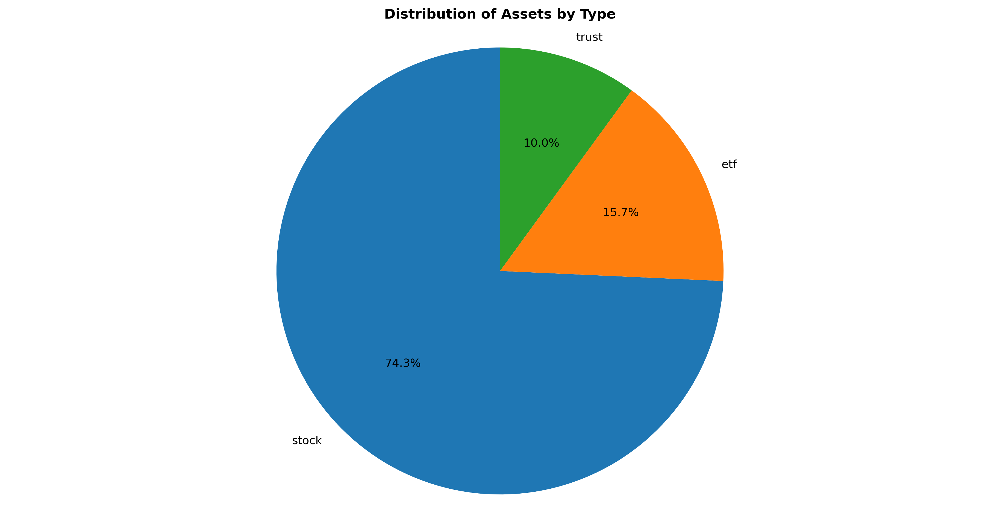

In [9]:
import matplotlib.pyplot as plt

# Count the number of occurrences for each asset type
asset_type_counts = available_assets['type'].value_counts()

# Create a figure with a single cell grid
fig, ax = plt.subplots(figsize=(6, 6), dpi=300, gridspec_kw={'left': 0, 'right': 2, 'bottom': 0, 'top': 1}, )

# Create a pie chart to show the proportion of asset types
ax.pie(asset_type_counts, labels=asset_type_counts.index, autopct='%1.1f%%', startangle=90)
ax.set_title('Distribution of Assets by Type', fontweight='bold')
ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle

plt.show();


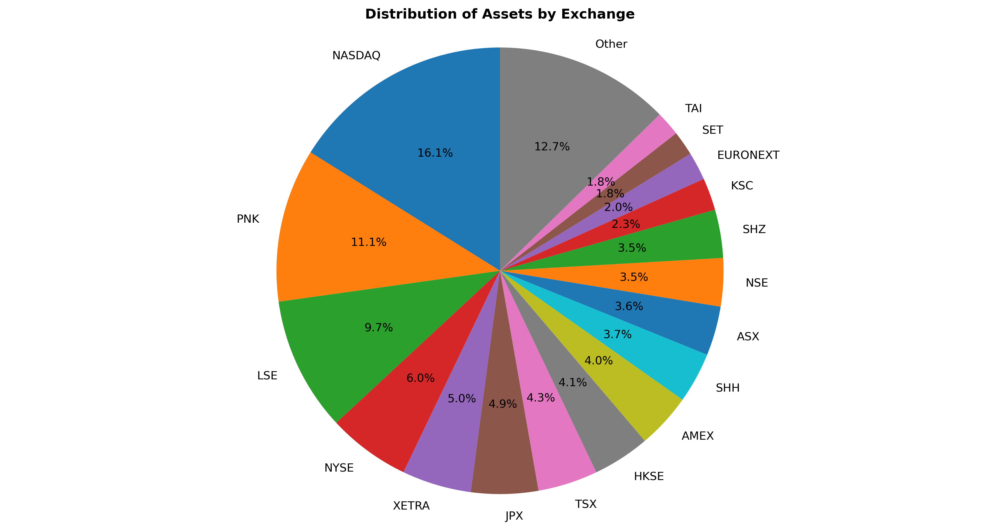

In [10]:
# Count the number of occurrences for each asset type
asset_type_counts = available_assets['exchangeShortName'].value_counts()

# Calculate the percentage of each asset type
asset_type_percentages = asset_type_counts / len(available_assets) * 100

# Filter out asset types that account for less than 1.5%
threshold = 1.5
filtered_asset_types = asset_type_percentages[asset_type_percentages >= threshold]
filtered_asset_types['Other'] = asset_type_percentages[asset_type_percentages < threshold].sum()

# Create a figure with a single cell grid
fig, ax = plt.subplots(figsize=(6, 6), dpi=300, gridspec_kw={'left': 0, 'right': 2, 'bottom': 0, 'top': 1}, )

# Create a pie chart to show the proportion of asset types
ax.pie(filtered_asset_types, labels=filtered_asset_types.index, autopct='%1.1f%%', startangle=90)
ax.set_title('Distribution of Assets by Exchange', fontweight='bold')
ax.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle

plt.show();


### 4.2 Open-High-Low-Close Price Data

The OHLC data is pretty easily obtained by using open source solutions. I used [Fundamentalanalysys](https://pypi.org/project/fundamentalanalysis/) library

Also, in order to check the process progress I ipliment [TQDM](https://github.com/tqdm/tqdm/blob/master/README.rst) library. It creates a very appealing progress bar.

In [12]:
import fundamentalanalysis as fa
from tqdm import tqdm

def download_ohlc_data(assets_list):
    """
    Downloads OHLC (Open-High-Low-Close) data for a list of assets and saves it as CSV files.

    Parameters
    ----------
    assets_list : list
        The list of asset symbols to download OHLC data for.

    """
    # Initialize the progress bar
    pbar = tqdm(assets_list)
    
    # Iterate over each symbol in the list
    for symbol in pbar:
        try:
            # Update the progress bar description
            pbar.set_description("Processing %s" % symbol)

            # Download OHLC data using the fundamentalanalysis library
            df = fa.stock_data(f"{symbol}", start="1960-01-01", end="2023-04-30", interval='1d')

            # Save the data as a CSV file if it is not empty
            if not df.empty:
                df.to_csv(f"/home/jj/anaconda3/envs/stocks/Database/1D/from_1960_to_2023/{symbol}.csv")
        
        # Ignore any exceptions and continue to the next symbol
        except:
            pass
        
    # Print a report after the tqdm loop finishes
    print("Data download completed.")


To speed up the download process, I will utilize python's multiprocessing capabilities. And to do this I need to split the `assets_list` into almost equal parts that will be processed in parallel. Let's create a function for this.

In [13]:
def divide_list_into_chunks(lst, m):
    """
    Divides a list into approximately equal-sized chunks and yields each chunk.

    Parameters
    ----------
    lst : list
        The list to be divided.
    m : int
        The number of chunks to create.

    Yields
    ------
    list
        A chunk of the original list.

    """
    
    # Get the length of the list
    n = len(lst)
    
    # Calculate the approximate chunk size
    chunk_size = n // m
    
    # Iterate over the range of m-1 to yield each chunk
    for i in range(0, m - 1):
        yield lst[i * chunk_size : (i + 1) * chunk_size]
    
    # Yield the remaining portion of the list as the last chunk
    yield lst[(m - 1) * chunk_size:]


In [14]:
# Define the number of processes
n_processes = 2 # Only two because my subscription is limitited to 300 requsets per minute.

# Divide the asset_list into approximately equal-sized chunks
chunks = list(divide_list_into_chunks(assets_list, n_processes))

Dowload data using `multiprocess` library

In [15]:
import multiprocess as mp

# Create a separate process for each chunk
processes = [mp.Process(target=download_ohlc_data, args=(chunk,)) for chunk in chunks]

if __name__ == "__main__":
    """
    Main block of code that executes when the script is run as the main program.
    """

    # Start each process
    for process in processes:
        process.start()

    # Wait for each process to finish
    for process in processes:
        process.join()


Processing ASLE: 100%|███████████████████████████████| 50/50 [00:11<00:00,  4.39it/s]


Data download completed.


Data download completed.


In [2]:
# Check data on an example asset
jpm_df = pd.read_csv("/home/jj/anaconda3/envs/stocks/Database/1D/from_1960_to_2023/JPM.csv", index_col=0)
jpm_df.tail()

,low,volume,open,high,close,adjclose
2023-04-24,140.039993,7567500,140.460007,141.100006,140.729996,140.729996
2023-04-25,137.630005,10629300,139.600006,139.960007,137.669998,137.669998
2023-04-26,134.000000,14416100,137.619995,137.809998,135.229996,135.229996
2023-04-27,135.660004,9041100,136.000000,137.910004,137.050003,137.050003
2023-04-28,135.669998,9881800,136.559998,138.320007,138.240005,138.240005


In [3]:
# Display info
jpm_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10872 entries, 1980-03-17 to 2023-04-28
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   low       10872 non-null  float64
 1   volume    10872 non-null  int64  
 2   open      10872 non-null  float64
 3   high      10872 non-null  float64
 4   close     10872 non-null  float64
 5   adjclose  10872 non-null  float64
dtypes: float64(5), int64(1)
memory usage: 594.6+ KB


Each row in the DataFrame represnts a trading day and columns provide information about Open, High, Low, Close, Adjusted Close prices and trading Volumne

Let's make a visual representation and plot a Price chart using [Mplfinance](https://github.com/matplotlib/mplfinance) library

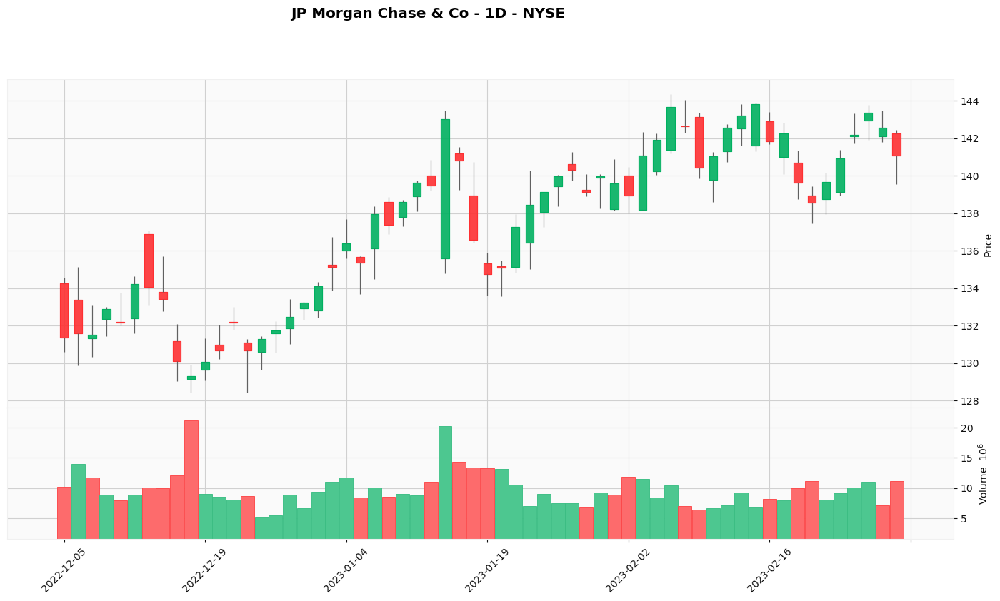

In [4]:
import mplfinance as mpf

# Define the start and end dates for the period to plot
plot_period_start = pd.to_datetime('2022-12-03')
plot_period_end = pd.to_datetime('2023-03-02')

# Convert the index of example_df to datetime and rename it to 'Date'
jpm_df.index = jpm_df.index.astype('datetime64[ns]').rename('Date')

# Select the subset of data within the print period
plot_df = jpm_df[(jpm_df.index >= plot_period_start) & (jpm_df.index <= plot_period_end)]

# Plot the selected data using mplfinance
mpf.plot(
    
    plot_df, 
    title=f'JP Morgan Chase & Co - 1D - NYSE',
    type='candle',  # Specify the type of plot (Candles)
    volume=True,
    datetime_format='%Y-%m-%d',
    figratio=(10,5),
    figscale=1.6,
    style='yahoo',  # Apply the yahoo style
        
)


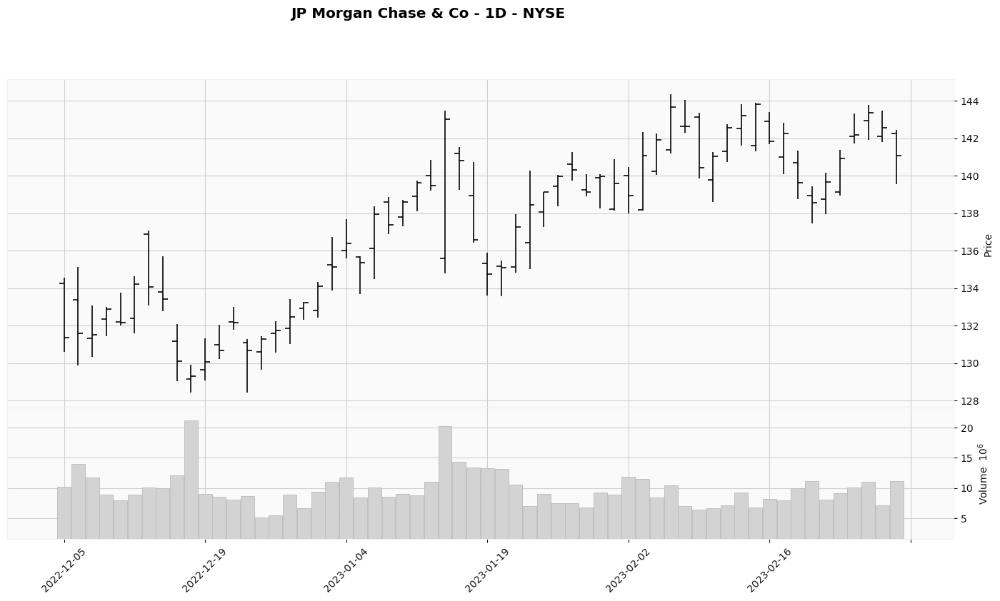

In [5]:
# Define the start and end dates for the period to plot
plot_period_start = pd.to_datetime('2022-12-03')
plot_period_end = pd.to_datetime('2023-03-02')

# Convert the index of example_df to datetime and rename it to 'Date'
jpm_df.index = jpm_df.index.astype('datetime64[ns]').rename('Date')

# Select the subset of data within the print period
plot_df = jpm_df[(jpm_df.index >= plot_period_start) & (jpm_df.index <= plot_period_end)]

# Define the market colors with faded volume bars
market_colors = mpf.make_marketcolors(
    
    volume='lightgray',  # Color for the volume bars
#     up='g',
#     down='r',
#     ohlc='i',
    
)

# Create a style using the customized market colors
custom_style = mpf.make_mpf_style(base_mpf_style='yahoo', marketcolors=market_colors)

# Plot the selected data using mplfinance
mpf.plot(
    
    plot_df, 
    title=f'JP Morgan Chase & Co - 1D - NYSE',
    type='ohlc',  # Specify the type of plot (OHLC)
    volume=True,
    datetime_format='%Y-%m-%d',
    figratio=(10,5),
    figscale=1.6,
    style=custom_style,  # Apply the customized style
        
)


### 4.3 Financial Growth Quarterly Data Downwload

In [49]:
def donwload_financial_growth_data(assets_list):
    """
    Downloads Financial Growth Quarterly data for a list of assets and saves it as CSV files.

    Parameters
    ----------
    assets_list : list
        The list of asset symbols to download data for.

    """
    # Initialize the progress bar
    pbar = tqdm(assets_list)
    
    # Iterate over each symbol in the list
    for symbol in pbar:
        try:
            # Update the progress bar description
            pbar.set_description("Processing %s" % symbol)
            
            # Define the API URL
            url = (f"https://financialmodelingprep.com/api/v3/financial-growth/{symbol}?period=quarter&limit=80&apikey={api_key}")

            # Fetch JSON data and convert it to a DataFrame
            df = fetch_json_as_dataframe(url)

            # Save the data as a CSV file if it is not empty
            if not df.empty:
                df.to_csv(f"/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/growth_quarterly/{symbol}.csv")
        
        # Ignore any exceptions and continue to the next symbol
        except:
            pass

    # Print a report after the tqdm loop finishes
    print("Data download completed.")

In [50]:
# Create a separate process for each chunk
processes = [mp.Process(target=donwload_financial_growth_data, args=(chunk,)) for chunk in chunks]

if __name__ == "__main__":
    """
    Main block of code that executes when the script is run as the main program.
    """

    # Start each process
    for process in processes:
        process.start()

    # Wait for each process to finish
    for process in processes:
        process.join()


Processing 200581.SZ: 100%|██████████| 50/50 [00:30<00:00,  1.64it/s]    


Data download completed.


Processing LU2263803533.SG: 100%|██████████| 50/50 [00:34<00:00,  1.44it/s]


Data download completed.


In [54]:
# Check data on an example asset
financial_growth_example_df = pd.read_csv("/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/growth_quarterly/JPM.csv", index_col=0)
financial_growth_example_df.head()

,symbol,date,period,revenueGrowth,grossProfitGrowth,ebitgrowth,operatingIncomeGrowth,netIncomeGrowth,epsgrowth,epsdilutedGrowth,...,tenYDividendperShareGrowthPerShare,fiveYDividendperShareGrowthPerShare,threeYDividendperShareGrowthPerShare,receivablesGrowth,inventoryGrowth,assetGrowth,bookValueperShareGrowth,debtGrowth,rdexpenseGrowth,sgaexpensesGrowth
0,JPM,2023-03-31,Q1,0.188785,0.086518,1.891977,1.891977,0.146621,0.148045,0.145251,...,2.515561,0.766197,0.103879,-0.109548,0,0.021431,0.034820,0.034616,0,0.068688
1,JPM,2022-12-31,Q4,-0.013969,0.105214,0.144337,0.144337,0.130533,0.143770,0.147436,...,1.941450,0.588955,0.089869,-0.170742,0,-0.028655,0.014397,-0.003814,0,-0.016169
2,JPM,2022-09-30,Q3,0.065147,0.072694,0.130596,0.130596,0.125795,0.129964,0.130435,...,2.588133,0.957786,0.240409,0.042688,0,-0.017554,0.006858,-0.033045,0,0.023840
3,JPM,2022-06-30,Q2,-0.000065,0.004689,0.104535,0.104535,0.044313,0.049242,0.049430,...,1.931903,0.733132,0.205630,0.004056,0,-0.028668,0.005813,-0.021369,0,-0.034716
4,JPM,2022-03-31,Q1,0.049903,-0.074307,-0.238736,-0.238736,-0.203577,-0.243553,-0.246418,...,3.291006,1.042647,0.254985,1.201843,0,0.056395,-0.027713,0.396239,0,0.085175


In [55]:
# Display info
financial_growth_example_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 80 entries, 0 to 79
Data columns (total 37 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   symbol                                  80 non-null     object 
 1   date                                    80 non-null     object 
 2   period                                  80 non-null     object 
 3   revenueGrowth                           80 non-null     float64
 4   grossProfitGrowth                       80 non-null     float64
 5   ebitgrowth                              80 non-null     float64
 6   operatingIncomeGrowth                   80 non-null     float64
 7   netIncomeGrowth                         80 non-null     float64
 8   epsgrowth                               80 non-null     float64
 9   epsdilutedGrowth                        80 non-null     float64
 10  weightedAverageSharesGrowth             80 non-null     float64


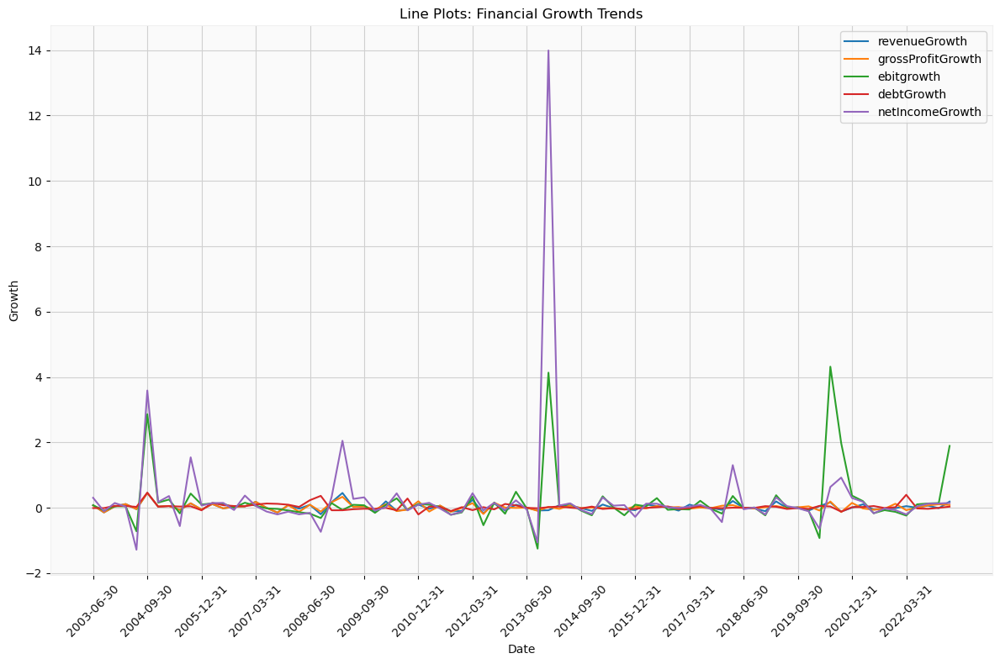

In [56]:
financial_growth_example_df = financial_growth_example_df[::-1]

# Select the columns for the line plots
line_plot_columns = ['revenueGrowth', 'grossProfitGrowth', 'ebitgrowth', 'debtGrowth', 'netIncomeGrowth']

# Create a larger figure
plt.figure(figsize=(12, 8))

# Create a line plot for each column
for column in line_plot_columns:
    plt.plot(financial_growth_example_df['date'], financial_growth_example_df[column], label=column)

# Set the x-axis label and ticks
plt.xlabel('Date')
plt.xticks(rotation=45)

# Set the y-axis label
plt.ylabel('Growth')

# Set the title
plt.title('Line Plots: Financial Growth Trends')

# Specify the step size for the x-axis ticks
step = 5  # Display every 5th date

# Set the step size for the x-axis ticks
plt.xticks(range(0, len(financial_growth_example_df['date']), step))

# Display the legend
plt.legend()

# Adjust the layout to prevent overlap of dates
plt.tight_layout()

# Display the plot
plt.show();


### 4.4 Balance Sheet History Data Downwload

In [57]:
def donwload_balance_sheet_data(assets_list):
    """
    Downloads Financial Balance Sheet data for a list of assets and saves it as CSV files.

    Parameters
    ----------
    assets_list : list
        The list of asset symbols to download data for.

    """
    # Initialize the progress bar
    pbar = tqdm(assets_list)
    
    # Iterate over each symbol in the list
    for symbol in pbar:
        try:
            # Update the progress bar description
            pbar.set_description("Processing %s" % symbol)
            
            # Define the API URL
            url = (f"https://financialmodelingprep.com/api/v3/balance-sheet-statement/{symbol}?period=quarter&limit=400&apikey={api_key}")

            # Fetch JSON data and convert it to a DataFrame
            df = fetch_json_as_dataframe(url)

            # Save the data as a CSV file if it is not empty
            if not df.empty:
                df.to_csv(f"/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/Balance_sheet_statements/{symbol}.csv")
        
        # Ignore any exceptions and continue to the next symbol
        except:
            pass
        
    # Print a report after the tqdm loop finishes
    print("Data download completed.")


In [58]:
# Create a separate process for each chunk
processes = [mp.Process(target=donwload_balance_sheet_data, args=(chunk,)) for chunk in chunks]

if __name__ == "__main__":
    """
    Main block of code that executes when the script is run as the main program.
    """

    # Start each process
    for process in processes:
        process.start()

    # Wait for each process to finish
    for process in processes:
        process.join()


Processing 200581.SZ: 100%|██████████| 50/50 [00:31<00:00,  1.57it/s]    


Data download completed.


Processing LU2263803533.SG: 100%|██████████| 50/50 [00:39<00:00,  1.28it/s]


Data download completed.


In [59]:
# Check data on an example asset
example_df = pd.read_csv("/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/Balance_sheet_statements/JPM.csv", index_col=0)
example_df.head()

,date,symbol,reportedCurrency,cik,fillingDate,acceptedDate,calendarYear,period,cashAndCashEquivalents,shortTermInvestments,...,totalStockholdersEquity,totalEquity,totalLiabilitiesAndStockholdersEquity,minorityInterest,totalLiabilitiesAndTotalEquity,totalInvestments,totalDebt,netDebt,link,finalLink
0,2023-03-31,JPM,USD,19617,2023-05-03,2023-05-03 16:10:19,2023,Q1,546000000000,197248000000,...,303082000000,303082000000,3744305000000,0,3744305000000,1326941000000,482883000000,-63117000000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
1,2022-12-31,JPM,USD,19617,2023-02-21,2023-02-21 16:13:55,2022,Q4,567234000000,205857000000,...,292332000000,292332000000,3665743000000,0,3665743000000,1219938000000,466727000000,-100507000000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
2,2022-09-30,JPM,USD,19617,2022-11-03,2022-11-03 16:13:37,2022,Q3,644187000000,188140000000,...,288018000000,288018000000,3773884000000,0,3773884000000,795272000000,468514000000,-175673000000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
3,2022-06-30,JPM,USD,19617,2022-08-03,2022-08-03 16:13:24,2022,Q2,669260000000,222069000000,...,286143000000,286143000000,3841314000000,0,3841314000000,1222970000000,484525000000,-184735000000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
4,2022-03-31,JPM,USD,19617,2022-05-03,2022-05-03 16:13:30,2022,Q1,754532000000,312875000000,...,285899000000,285899000000,3954687000000,0,3954687000000,1342867000000,495105000000,-259427000000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...


In [60]:
# Display info
example_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 134 entries, 0 to 133
Data columns (total 54 columns):
 #   Column                                   Non-Null Count  Dtype 
---  ------                                   --------------  ----- 
 0   date                                     134 non-null    object
 1   symbol                                   134 non-null    object
 2   reportedCurrency                         134 non-null    object
 3   cik                                      134 non-null    int64 
 4   fillingDate                              134 non-null    object
 5   acceptedDate                             134 non-null    object
 6   calendarYear                             134 non-null    int64 
 7   period                                   134 non-null    object
 8   cashAndCashEquivalents                   134 non-null    int64 
 9   shortTermInvestments                     134 non-null    int64 
 10  cashAndShortTermInvestments              134 non-null    int64

### 4.5 Cash Flow History Data Downwload

In [61]:
def donwload_cahs_flow_data(assets_list):
    """
    Downloads Cash Flow data for a list of assets and saves it as CSV files.

    Parameters
    ----------
    assets_list : list
        The list of asset symbols to download data for.

    """
    # Initialize the progress bar
    pbar = tqdm(assets_list)
    
    # Iterate over each symbol in the list
    for symbol in pbar:
        try:
            # Update the progress bar description
            pbar.set_description("Processing %s" % symbol)
            
            # Define the API URL
            url = (f"https://financialmodelingprep.com/api/v3/cash-flow-statement/{symbol}?period=quarter&limit=400&apikey={api_key}")

            # Fetch JSON data and convert it to a DataFrame
            df = fetch_json_as_dataframe(url)

            # Save the data as a CSV file if it is not empty
            if not df.empty:
                df.to_csv(f"/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/cash_flow_statement/{symbol}.csv")
        
        # Ignore any exceptions and continue to the next symbol
        except:
            pass
        
    # Print a report after the tqdm loop finishes
    print("Data download completed.")


In [62]:
# Create a separate process for each chunk
processes = [mp.Process(target=donwload_cahs_flow_data, args=(chunk,)) for chunk in chunks]

if __name__ == "__main__":
    """
    Main block of code that executes when the script is run as the main program.
    """

    # Start each process
    for process in processes:
        process.start()

    # Wait for each process to finish
    for process in processes:
        process.join()


Processing 200581.SZ: 100%|██████████| 50/50 [00:30<00:00,  1.62it/s]    


Data download completed.


Processing LU2263803533.SG: 100%|██████████| 50/50 [00:34<00:00,  1.46it/s]


Data download completed.


In [63]:
# Check data on an example asset
example_cahs_flow_df = pd.read_csv("/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/cash_flow_statement/JPM.csv", index_col=0)
example_cahs_flow_df.head()

,date,symbol,reportedCurrency,cik,fillingDate,acceptedDate,calendarYear,period,netIncome,depreciationAndAmortization,...,netCashUsedProvidedByFinancingActivities,effectOfForexChangesOnCash,netChangeInCash,cashAtEndOfPeriod,cashAtBeginningOfPeriod,operatingCashFlow,capitalExpenditure,freeCashFlow,link,finalLink
0,2023-03-31,JPM,USD,19617,2023-05-03,2023-05-03 16:10:19,2023,Q1,12622000000,1649000000,...,64557000000,1656000000,-21234000000,546000000000,567234000000,-111241000000,0,-111241000000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
1,2022-12-31,JPM,USD,19617,2023-02-21,2023-02-21 16:13:55,2022,Q4,11008000000,1671000000,...,-142344000000,15699000000,-76953000000,567234000000,644187000000,101222000000,0,101222000000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
2,2022-09-30,JPM,USD,19617,2022-11-03,2022-11-03 16:13:37,2022,Q3,9737000000,1771000000,...,-32883000000,-13508000000,-25073000000,644187000000,669260000000,-18204000000,0,-18204000000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
3,2022-06-30,JPM,USD,19617,2022-08-03,2022-08-03 16:13:24,2022,Q2,8649000000,1789000000,...,-83802000000,-14285000000,-85272000000,669260000000,754532000000,66018000000,0,66018000000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
4,2022-03-31,JPM,USD,19617,2022-05-03,2022-05-03 16:13:30,2022,Q1,8282000000,1820000000,...,132772000000,-4549000000,13698000000,754532000000,740834000000,-41917000000,0,-41917000000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...


In [64]:
# Display info
example_cahs_flow_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 133 entries, 0 to 132
Data columns (total 40 columns):
 #   Column                                    Non-Null Count  Dtype 
---  ------                                    --------------  ----- 
 0   date                                      133 non-null    object
 1   symbol                                    133 non-null    object
 2   reportedCurrency                          133 non-null    object
 3   cik                                       133 non-null    int64 
 4   fillingDate                               133 non-null    object
 5   acceptedDate                              133 non-null    object
 6   calendarYear                              133 non-null    int64 
 7   period                                    133 non-null    object
 8   netIncome                                 133 non-null    int64 
 9   depreciationAndAmortization               133 non-null    int64 
 10  deferredIncomeTax                         133 non-

### 4.6 Income Statements History Data Downwload

In [65]:
def donwload_income_statement_data(assets_list):
    """
    Downloads Cash Flow data for a list of assets and saves it as CSV files.

    Parameters
    ----------
    assets_list : list
        The list of asset symbols to download data for.

    """
    # Initialize the progress bar
    pbar = tqdm(assets_list)
    
    # Iterate over each symbol in the list
    for symbol in pbar:
        try:
            # Update the progress bar description
            pbar.set_description("Processing %s" % symbol)
            
            # Define the API URL
            url = (f"https://financialmodelingprep.com/api/v3/income-statement/{symbol}?period=quarter&limit=400&apikey={api_key}")

            # Fetch JSON data and convert it to a DataFrame
            df = fetch_json_as_dataframe(url)

            # Save the data as a CSV file if it is not empty
            if not df.empty:
                df.to_csv(f"/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/income_statement/{symbol}.csv")
        
        # Ignore any exceptions and continue to the next symbol
        except:
            pass
        
    # Print a report after the tqdm loop finishes
    print("Data download completed.")

In [66]:
# Create a separate process for each chunk
processes = [mp.Process(target=donwload_income_statement_data, args=(chunk,)) for chunk in chunks]

if __name__ == "__main__":
    """
    Main block of code that executes when the script is run as the main program.
    """

    # Start each process
    for process in processes:
        process.start()

    # Wait for each process to finish
    for process in processes:
        process.join()


Processing 200581.SZ: 100%|██████████| 50/50 [00:31<00:00,  1.61it/s]    


Data download completed.


Processing LU2263803533.SG: 100%|██████████| 50/50 [00:35<00:00,  1.41it/s]


Data download completed.


In [67]:
# Check data on an example asset
example_income_df = pd.read_csv("/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/income_statement/JPM.csv", index_col=0)
example_income_df.head()

,date,symbol,reportedCurrency,cik,fillingDate,acceptedDate,calendarYear,period,revenue,costOfRevenue,...,incomeBeforeTaxRatio,incomeTaxExpense,netIncome,netIncomeRatio,eps,epsdiluted,weightedAverageShsOut,weightedAverageShsOutDil,link,finalLink
0,2023-03-31,JPM,USD,19617,2023-05-03,2023-05-03 16:10:19,2023,Q1,38349000000,3299000000,...,0.416360,3345000000,12622000000,0.329135,4.11,4.10,2972700000,2972700000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
1,2022-12-31,JPM,USD,19617,2023-02-21,2023-02-21 16:13:55,2022,Q4,32259000000,0,...,0.410335,2229000000,11008000000,0.341238,3.58,3.58,2967100000,2967100000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
2,2022-09-30,JPM,USD,19617,2022-11-03,2022-11-03 16:13:37,2022,Q3,32716000000,3528000000,...,0.366824,2264000000,9737000000,0.297622,3.13,3.12,2965400000,2965400000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
3,2022-06-30,JPM,USD,19617,2022-08-03,2022-08-03 16:13:24,2022,Q2,30715000000,3505000000,...,0.353736,2216000000,8649000000,0.281589,2.77,2.76,2966300000,2966300000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
4,2022-03-31,JPM,USD,19617,2022-05-03,2022-05-03 16:13:30,2022,Q1,30717000000,3634000000,...,0.327604,1781000000,8282000000,0.269623,2.64,2.63,2981000000,2981000000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...


In [69]:
# Display info
example_income_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 137 entries, 0 to 136
Data columns (total 38 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   date                                     137 non-null    object 
 1   symbol                                   137 non-null    object 
 2   reportedCurrency                         137 non-null    object 
 3   cik                                      137 non-null    int64  
 4   fillingDate                              137 non-null    object 
 5   acceptedDate                             137 non-null    object 
 6   calendarYear                             137 non-null    int64  
 7   period                                   137 non-null    object 
 8   revenue                                  137 non-null    int64  
 9   costOfRevenue                            137 non-null    int64  
 10  grossProfit                              137 non-n

The Data Download part has been completed. And in Total __176801 csv files__ was created.

## 2 Data Engineering

### 2.1 Find Resistance Levels

In [5]:
def find_resistance_levels(df, lookback_period, min_volume):
    """
    Finds long-term resistance levels in a DataFrame based on a given resistance period and minimum volume.

    Parameters
    ----------
    df : pandas.DataFrame
        The DataFrame containing the OHLC (Open-High-Low-Close) data.
    resistance_period : int
        The number of preceding rows to consider for finding the maximum high.
    min_volume : int
        The minimum volume threshold.

    Returns
    -------
    pandas.DataFrame
        A DataFrame containing the long-term resistance levels.

    """
    resistance_levels = []
    resistance_levels_df = pd.DataFrame()

    # Loop backwards through the dataframe, starting from the last row and going to the first.
    for index in range(len(df) - 1, -1, -1):
        # Get the row at the current index.
        row = df.iloc[index]

        # Determine the window of rows to look at for finding the maximum high.
        if index - lookback_period < 0:
            window_start = 0
        else:
            window_start = index - lookback_period

        # Find the maximum high within the window.
        max_high = df["high"][window_start:index].max()

        # Extract the subset of rows for calculating mean volume.
        if index - 10 <= 0:
            df_mean_vol = df.iloc[:index + 20]
        else:
            df_mean_vol = df.iloc[index - 10:index]

        # Check if the current row's high is greater than or equal to the maximum high
        # and if the mean volume of the subset is not below the minimum volume threshold.
        if row["high"] >= max_high and not (df_mean_vol["volume"] < min_volume).any():
            row_dict = {"Level_Price": row["high"], "Formation_Date": df.index[index]}
            resistance_levels.append(row_dict)

    # If there are any long-term resistance levels and there are enough rows in the dataframe to look at,
    # create a dataframe of the resistance levels and return it.
    if len(resistance_levels) != 0:
        resistance_levels_df = pd.DataFrame(resistance_levels).sort_values(by='Formation_Date')
        resistance_levels_df.set_index('Formation_Date', inplace=True, drop=False)
        resistance_levels_df.drop("Formation_Date", axis=1, inplace=True)
    else:
        # If there are no long-term resistance levels or not enough rows in the dataframe, return an empty dataframe.
        resistance_levels_df = pd.DataFrame()

    return resistance_levels_df


### 2.1 Find Breakout Models


In [60]:
def find_breakout_days(
    df, 
    resistance_levels, 
    min_level_age, 
    stoploss_offset, 
    lookback_period,
    entry_window,
    ATR_enter_window,
    symbol, 
    available_assets_df,
    balance_sheet_df
):
    """
    Finds breakout days in a DataFrame based on resistance levels and specified parameters.

    Parameters
    ----------
    df : pandas.DataFrame
        The DataFrame containing OHLC (Open-High-Low-Close) data.
    resistance_levels : pandas.DataFrame
        The DataFrame containing long-term resistance levels.
    min_level_age : int
        The minimum age (number of days) between level appearance and a breakout model.
    stoploss_offset : float
        The offset factor for determining the stoploss price.
    lookback_period : int
        The number of preceding rows to consider for finding the maximum high.
    entry_window : int
        The maximum number of days for searching entry point after breakout day.
    ATR_enter_window : int
        The window size for for entry price calculation based on Average True Range.
    symbol : str
        The symbol of the asset.
    available_assets : pandas.DataFrame
        The DataFrame containing available assets information.

    Returns
    -------
    pandas.DataFrame
        A DataFrame containing breakout days and relevant information.

    """

    breakout_days_df = pd.DataFrame()

    if not resistance_levels.empty:
        # Iterate over each resistance level
        for index, row in resistance_levels.iterrows():

            # Filter the dataframe to include data from the resistance level onwards
            df_search = df[df.index >= index]

            # Find the first row where the stock breaks out above the resistance level
            potential_model = df_search[
                (df_search["open"] < row["Level_Price"]) &
                (df_search["close"] > row["Level_Price"])
            ].head(1)
            potential_model = potential_model.assign(Level_Price=row["Level_Price"], Level_Date=index)

            if not potential_model.empty:
                potential_model_date = potential_model.index[0]

                # Calculate the number of days between the resistance level and the breakout day
                days_between = df_search[(df_search.index >= index) & (df_search.index < potential_model_date)]

                # Filter the dataframe to include data from the breakout day onwards
                df_to_the_end = df[df.index >= potential_model_date]

                level_age = len(days_between)
                potential_model = potential_model.assign(Level_Age=level_age)
                potential_model = potential_model.assign(Lookback_Period=lookback_period)

                if (
                    (days_between["high"] <= row["Level_Price"]).all()
                    and level_age >= min_level_age
                    and len(df_to_the_end) >= entry_window
                ):
                    df_ATR5 = df[df.index <= potential_model_date][-5:]
                    ATR5 = (df_ATR5["high"] - df_ATR5['low']).mean()
                    potential_model = potential_model.assign(ATR5=ATR5)

                    breakout_days_df = pd.concat([breakout_days_df, potential_model]).rename_axis("Breakout_Date").sort_index()
    
    # Add techical parameters of a trade: 
    if not breakout_days_df.empty:
        # Add additional columns and modify the DataFrame
        breakout_days_df["Symbol"] = symbol
        breakout_days_df.insert(0, "Symbol", breakout_days_df.pop("Symbol"))
        breakout_days_df["Type"] = available_assets_df[available_assets_df["symbol"] == symbol]["type"].values[0]
        breakout_days_df["Exchange"] = available_assets_df[available_assets_df["symbol"] == symbol]["exchangeShortName"].values[0]
        
#         if not balance_sheet_df.empty:
#             breakout_days_df["Currency"] = balance_sheet_df['reportedCurrency'].values[0]
            
#         else:
#             breakout_days_df["Currency"] = None
        
        # Insert columns on 1, 2, 3 places
        breakout_days_df.insert(1, "Type", breakout_days_df.pop("Type"))
        breakout_days_df.insert(2, "Exchange", breakout_days_df.pop("Exchange"))
#         breakout_days_df.insert(3, "Currency", breakout_days_df.pop("Currency"))
        
        # Set spread values based on the high price range
        breakout_days_df.loc[breakout_days_df["high"] <= 5, "Spread"] = 0.01
        breakout_days_df.loc[(breakout_days_df["high"] > 5) & (breakout_days_df["high"] <= 50), "Spread"] = 0.05
        breakout_days_df.loc[(breakout_days_df["high"] > 50) & (breakout_days_df["high"] <= 100), "Spread"] = 0.2
        breakout_days_df.loc[(breakout_days_df["high"] > 100) & (breakout_days_df["high"] <= 400), "Spread"] = 0.5
        breakout_days_df.loc[breakout_days_df["high"] > 400, "Spread"] = 1
        
        breakout_days_df = breakout_days_df.reset_index().drop_duplicates(subset='Breakout_Date', keep='first').set_index('Breakout_Date')


        # Calculate entry, stoploss, and takeprofit prices
        breakout_days_df["Entry_Price"] = breakout_days_df["Level_Price"] + breakout_days_df["ATR5"] * ATR_enter_window
        
        breakout_days_df["Stoploss_Price"] = breakout_days_df["low"] - breakout_days_df["Spread"] * stoploss_offset
        breakout_days_df.loc[breakout_days_df.index.year >= 1999, "Stoploss_Price"] = breakout_days_df["low"] - breakout_days_df["Spread"] * stoploss_offset * 10 

        breakout_days_df["Takeprofit_3/1_Price"] = breakout_days_df["Entry_Price"] + (breakout_days_df["Entry_Price"] - breakout_days_df["Stoploss_Price"]) * 3
        breakout_days_df["Takeprofit_5/1_Price"] = breakout_days_df["Entry_Price"] + (breakout_days_df["Entry_Price"] - breakout_days_df["Stoploss_Price"]) * 5
        breakout_days_df["Takeprofit_10/1_Price"] = breakout_days_df["Entry_Price"] + (breakout_days_df["Entry_Price"] - breakout_days_df["Stoploss_Price"]) * 10
        breakout_days_df["Takeprofit_15/1_Price"] = breakout_days_df["Entry_Price"] + (breakout_days_df["Entry_Price"] - breakout_days_df["Stoploss_Price"]) * 15
        breakout_days_df["Takeprofit_30/1_Price"] = breakout_days_df["Entry_Price"] + (breakout_days_df["Entry_Price"] - breakout_days_df["Stoploss_Price"]) * 30

        # Calculate price deltas from the Level
        breakout_days_df["Open_Delta"] = breakout_days_df["Level_Price"] - breakout_days_df["open"]
        breakout_days_df["High_Delta"] = breakout_days_df["high"] - breakout_days_df["Level_Price"]
        breakout_days_df["Close_Delta"] = breakout_days_df["close"] - breakout_days_df["Level_Price"]
        breakout_days_df["Low_Delta"] = breakout_days_df["Level_Price"] - breakout_days_df["low"]
        
        # Multiply Stoploss_Price by 10 if breakout_day year is greater than 2000

    return breakout_days_df.sort_index()

In [192]:
example_income_df

,date,symbol,reportedCurrency,cik,fillingDate,acceptedDate,calendarYear,period,revenue,costOfRevenue,grossProfit,grossProfitRatio,researchAndDevelopmentExpenses,generalAndAdministrativeExpenses,sellingAndMarketingExpenses,sellingGeneralAndAdministrativeExpenses,otherExpenses,operatingExpenses,costAndExpenses,interestIncome,interestExpense,depreciationAndAmortization,ebitda,ebitdaratio,operatingIncome,operatingIncomeRatio,totalOtherIncomeExpensesNet,incomeBeforeTax,incomeBeforeTaxRatio,incomeTaxExpense,netIncome,netIncomeRatio,eps,epsdiluted,weightedAverageShsOut,weightedAverageShsOutDil,link,finalLink
0,2023-03-31,JPM,USD,19617,2023-05-03,2023-05-03 16:10:19,2023,Q1,38349000000,3299000000,35050000000,0.913974,0,4632000000,1045000000,18468000000,0,-20107000000,-20107000000,37004000000,16293000000,-16722000000,15538000000,0.405174,32260000000,0.841221,-16293000000,15967000000,0.416360,3345000000,12622000000,0.329135,4.11,4.10,2972700000,2972700000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
1,2022-12-31,JPM,USD,19617,2023-02-21,2023-02-21 16:13:55,2022,Q4,32259000000,0,32259000000,1.000000,0,4908000000,1093000000,17281000000,0,-19022000000,-19022000000,33054000000,12862000000,1671000000,12826000000,0.397594,11155000000,0.345795,2082000000,13237000000,0.410335,2229000000,11008000000,0.341238,3.58,3.58,2967100000,2967100000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
2,2022-09-30,JPM,USD,19617,2022-11-03,2022-11-03 16:13:37,2022,Q3,32716000000,3528000000,29188000000,0.892163,0,4847000000,1017000000,17565000000,0,-19178000000,-19178000000,25611000000,8093000000,1771000000,11519000000,0.352091,9748000000,0.297958,2253000000,12001000000,0.366824,2264000000,9737000000,0.297622,3.13,3.12,2965400000,2965400000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
3,2022-06-30,JPM,USD,19617,2022-08-03,2022-08-03 16:13:24,2022,Q2,30715000000,3505000000,27210000000,0.885886,0,4845000000,881000000,17156000000,0,-18749000000,-18749000000,18646000000,3518000000,1789000000,10411000000,0.338955,8622000000,0.280710,2243000000,10865000000,0.353736,2216000000,8649000000,0.281589,2.77,2.76,2966300000,2966300000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
4,2022-03-31,JPM,USD,19617,2022-05-03,2022-05-03 16:13:30,2022,Q1,30717000000,3634000000,27083000000,0.881694,0,4932000000,920000000,17773000000,0,-19191000000,-19191000000,15496000000,1624000000,1820000000,9626000000,0.313377,7806000000,0.254126,2257000000,10063000000,0.327604,1781000000,8282000000,0.269623,2.64,2.63,2981000000,2981000000,https://www.sec.gov/Archives/edgar/data/19617/...,https://www.sec.gov/Archives/edgar/data/19617/...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132,1990-03-31,JPM,USD,19617,1990-03-31,1990-03-30 19:00:00,1990,Q1,928100000,0,928100000,1.000000,0,339100000,0,339100000,0,0,0,1636300000,1153900000,54000000,1378000000,1.484754,1324000000,1.426570,0,170100000,0.183278,18400000,151700000,0.163452,0.52,0.52,370440780,370440780,NaN,NaN
133,1989-03-31,JPM,USD,19617,1989-03-31,1989-03-30 19:00:00,1989,Q1,0,0,0,0.000000,0,0,0,0,0,0,0,0,0,0,0,0.000000,0,0.000000,0,0,0.000000,0,0,0.000000,0.50,0.50,193208396,193208396,NaN,NaN
134,1988-03-31,JPM,USD,19617,1988-03-31,1988-03-30 19:00:00,1988,Q1,0,0,0,0.000000,0,0,0,0,0,0,0,0,0,0,0,0.000000,0,0.000000,0,0,0.000000,0,0,0.000000,0.65,0.65,168596702,168596702,NaN,NaN
135,1987-03-31,JPM,USD,19617,1987-03-31,1987-03-30 19:00:00,1987,Q1,0,0,0,0.000000,0,0,0,0,0,0,0,0,0,0,0,0.000000,0,0.000000,0,0,0.000000,0,0,0.000000,0.53,0.53,152497751,152497751,NaN,NaN


In [81]:
breakout_models.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 39 entries, 1993-03-10 to 2021-10-22
Data columns (total 26 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Symbol                 39 non-null     object        
 1   Type                   39 non-null     object        
 2   Exchange               39 non-null     object        
 3   low                    39 non-null     float64       
 4   volume                 39 non-null     int64         
 5   open                   39 non-null     float64       
 6   high                   39 non-null     float64       
 7   close                  39 non-null     float64       
 8   adjclose               39 non-null     float64       
 9   Level_Price            39 non-null     float64       
 10  Level_Date             39 non-null     datetime64[ns]
 11  Level_Age              39 non-null     int64         
 12  Lookback_Period        39 non-null     int64  

### 2.3 Get Results of Trades

In [6]:
def get_model_results(df, breakout_models, entry_window):
    
    """
    Get model results based on breakout models and DataFrame.

    Parameters
    ----------
    df : pandas.DataFrame
        The DataFrame containing OHLC (Open-High-Low-Close) data.
    breakout_models : pandas.DataFrame
        The DataFrame containing breakout models.
    entry_window : int
        The entry window duration.

    Returns
    -------
    pandas.DataFrame
        The DataFrame containing model results.

    """
    
    for index, row in breakout_models.iterrows():
        # Filter the df DataFrame to search for the entry point
        df_entrypoint_search = df[df.index > index][:entry_window]

        # Find the entry point based on the Entry_Price in the current row
        entry_point = df_entrypoint_search[(df_entrypoint_search["low"] <= row["Entry_Price"]) &
                                           (df_entrypoint_search['high'] >= row["Entry_Price"])].head(1)
        
        # Set the model age
        breakout_models.loc[index, "Model_Age"] = len(df[df.index <= index])

        if len(entry_point) == 1:
            
            # Mark that an entry point is triggered
            breakout_models.loc[index, "Entry_Point_Triggered"] = 1
            # Set the entry point date
            breakout_models.loc[index, "Entry_Point_Date"] = entry_point.index[0].date()
            # Calculate the entry point duration in days
            breakout_models.loc[index, "Entry_Point_Duration"] = (entry_point.index[0] - index).days
            # Set the entry point day of the week (1 for Monday, 2 for Tuesday, etc.)
            breakout_models.loc[index, "Entry_Point_Day_of_Week"] = entry_point.index[0].dayofweek + 1
            # Set the entry point week number
            breakout_models.loc[index, "Entry_Point_Week"] = entry_point.index[0].week
            # Set the entry point month
            breakout_models.loc[index, "Entry_Point_Month"] = entry_point.index[0].month

            # Filter the df DataFrame starting from the entry point date
            df_trade_result = df[df.index >= entry_point.index[0]]
            # Find the first occurrence of stoploss price being reached
            stoploss = df_trade_result[df_trade_result["low"] <= row["Stoploss_Price"]].head(1)
            # Find the first occurrence of takeprofit_3/1 price being reached
            takeprofit_31 = df_trade_result[df_trade_result["high"] >= row["Takeprofit_3/1_Price"]].head(1)
            # Find the first occurrence of takeprofit_5/1 price being reached
            takeprofit_51 = df_trade_result[df_trade_result["high"] >= row["Takeprofit_5/1_Price"]].head(1)
            # Find the first occurrence of takeprofit_10/1 price being reached
            takeprofit_101 = df_trade_result[df_trade_result["high"] >= row["Takeprofit_10/1_Price"]].head(1)
            # Find the first occurrence of takeprofit_15/1 price being reached
            takeprofit_151 = df_trade_result[df_trade_result["high"] >= row["Takeprofit_15/1_Price"]].head(1)
            # Find the first occurrence of takeprofit_30/1 price being reached
            takeprofit_301 = df_trade_result[df_trade_result["high"] >= row["Takeprofit_30/1_Price"]].head(1)

            # Extract the stoploss date and duration if it is triggered
            sl_date = stoploss.index[0].date() if not stoploss.empty else None
            sl_duration = (stoploss.index - index).days if not stoploss.empty else None

            # Extract the takeprofit_3/1 date and duration if it is triggered
            tp31_date = takeprofit_31.index[0].date() if not takeprofit_31.empty else None
            tp31_duration = (takeprofit_31.index - index).days if not takeprofit_31.empty else None

            # Extract the takeprofit_5/1 date and duration if it is triggered
            tp51_date = takeprofit_51.index[0].date() if not takeprofit_51.empty else None
            tp51_duration = (takeprofit_51.index - index).days if not takeprofit_51.empty else None

            # Extract the takeprofit_10/1 date and duration if it is triggered
            tp101_date = takeprofit_101.index[0].date() if not takeprofit_101.empty else None
            tp101_duration = (takeprofit_101.index - index).days if not takeprofit_101.empty else None

            # Extract the takeprofit_15/1 date and duration if it is triggered
            tp151_date = takeprofit_151.index[0].date() if not takeprofit_151.empty else None
            tp151_duration = (takeprofit_151.index - index).days if not takeprofit_151.empty else None

            # Extract the takeprofit_30/1 date and duration if it is triggered
            tp301_date = takeprofit_301.index[0].date() if not takeprofit_301.empty else None
            tp301_duration = (takeprofit_301.index - index).days if not takeprofit_301.empty else None

            # Check if both stoploss and takeprofit_3/1 are triggered
            if sl_date and tp31_date:
                if sl_date <= tp31_date:
                    # Set the stoploss and takeprofit_3/1 triggered flags accordingly
                    breakout_models.loc[index, [
                        "Stoploss_3/1_Triggered",
                        "Stoploss_3/1_Date", 
                        "Stoploss_3/1_Duration",
                        "Takeprofit_3/1_Triggered",
                        "Takeprofit_3/1_Date", 
                        "Takeprofit_3/1_Duration",
                    ]] = [1, sl_date, sl_duration, 0, 0, 0]
                else:
                    # Set the stoploss and takeprofit_3/1 triggered flags accordingly
                    breakout_models.loc[index, [
                        "Stoploss_3/1_Triggered",
                        "Stoploss_3/1_Date", 
                        "Stoploss_3/1_Duration",
                        "Takeprofit_3/1_Triggered",
                        "Takeprofit_3/1_Date", 
                        "Takeprofit_3/1_Duration"
                    ]] = [0, 0, 0, 1, tp31_date, tp31_duration]

            # Check if stoploss is triggered and takeprofit_3/1 is not triggered
            if sl_date and tp31_date == None:
                # Set the stoploss triggered flag and related information
                breakout_models.loc[index, [
                    "Stoploss_3/1_Triggered",
                    "Stoploss_3/1_Date", 
                    "Stoploss_3/1_Duration",
                    "Takeprofit_3/1_Triggered",
                    "Takeprofit_3/1_Date", 
                    "Takeprofit_3/1_Duration"
                ]] = [1, sl_date, sl_duration, 0, 0, 0]

            # Check if takeprofit_3/1 is triggered and stoploss is not triggered
            if tp31_date and sl_date == None:
                # Set the takeprofit_3/1 triggered flag and related information
                breakout_models.loc[index, [
                    "Takeprofit_3/1_Triggered",
                    "Takeprofit_3/1_Date", 
                    "Takeprofit_3/1_Duration",
                    "Stoploss_3/1_Triggered",
                    "Stoploss_3/1_Date", 
                    "Stoploss_3/1_Duration",
                ]] = [1, tp31_date, tp31_duration, 0, 0, 0]

            # Check if neither stoploss nor takeprofit_3/1 is triggered and an entry point is found
            if tp31_date == None and sl_date == None and len(entry_point) == 1:
                # Set the takeprofit_3/1 and stoploss flags as not triggered
                breakout_models.loc[index, [
                    "Takeprofit_3/1_Triggered",
                    "Takeprofit_3/1_Date", 
                    "Takeprofit_3/1_Duration",
                    "Stoploss_3/1_Triggered",
                    "Stoploss_3/1_Date", 
                    "Stoploss_3/1_Duration",
                ]] = [0, 0, 0, 0, 0, 0]
                
            
#             5/1

            if sl_date and tp51_date:
                if sl_date <= tp51_date:
                    breakout_models.loc[index, [
                        "Stoploss_5/1_Triggered",
                        "Stoploss_5/1_Date", 
                        "Stoploss_5/1_Duration",
                        "Takeprofit_5/1_Triggered",
                        "Takeprofit_5/1_Date", 
                        "Takeprofit_5/1_Duration",
                    ]] = [1, sl_date, sl_duration, 0, 0, 0]
                else:
                    breakout_models.loc[index, [
                        "Stoploss_5/1_Triggered",
                        "Stoploss_5/1_Date", 
                        "Stoploss_5/1_Duration",
                        "Takeprofit_5/1_Triggered",
                        "Takeprofit_5/1_Date", 
                        "Takeprofit_5/1_Duration"
                    ]] = [0, 0, 0, 1, tp51_date, tp51_duration]

            if sl_date and tp51_date == None:
                breakout_models.loc[index, [
                    "Stoploss_5/1_Triggered",
                    "Stoploss_5/1_Date", 
                    "Stoploss_5/1_Duration",
                    "Takeprofit_5/1_Triggered",
                    "Takeprofit_5/1_Date", 
                    "Takeprofit_5/1_Duration"
                ]] = [1, sl_date, sl_duration, 0, 0, 0]
                
            if tp51_date and sl_date == None:
                breakout_models.loc[index, [
                    "Takeprofit_5/1_Triggered",
                    "Takeprofit_5/1_Date", 
                    "Takeprofit_5/1_Duration",
                    "Stoploss_5/1_Triggered",
                    "Stoploss_5/1_Date", 
                    "Stoploss_5/1_Duration",
                ]] = [1, tp51_date, tp51_duration, 0, 0, 0]

            if tp51_date == None and sl_date == None and len(entry_point) == 1:
                breakout_models.loc[index, [
                    "Takeprofit_5/1_Triggered",
                    "Takeprofit_5/1_Date", 
                    "Takeprofit_5/1_Duration",
                    "Stoploss_5/1_Triggered",
                    "Stoploss_5/1_Date", 
                    "Stoploss_5/1_Duration",
                ]] = [0, 0, 0, 0, 0, 0]
                
#             10/1
            
            if sl_date and tp101_date:
                if sl_date <= tp101_date:
                    breakout_models.loc[index, [
                        "Stoploss_10/1_Triggered",
                        "Stoploss_10/1_Date", 
                        "Stoploss_10/1_Duration",
                        "Takeprofit_10/1_Triggered",
                        "Takeprofit_10/1_Date", 
                        "Takeprofit_10/1_Duration",
                    ]] = [1, sl_date, sl_duration, 0, 0, 0]
                else:
                    breakout_models.loc[index, [
                        "Stoploss_10/1_Triggered",
                        "Stoploss_10/1_Date", 
                        "Stoploss_10/1_Duration",
                        "Takeprofit_10/1_Triggered",
                        "Takeprofit_10/1_Date", 
                        "Takeprofit_10/1_Duration"
                    ]] = [0, 0, 0, 1, tp101_date, tp101_duration]

            if sl_date and tp101_date == None:
                breakout_models.loc[index, [
                    "Stoploss_10/1_Triggered",
                    "Stoploss_10/1_Date", 
                    "Stoploss_10/1_Duration",
                    "Takeprofit_10/1_Triggered",
                    "Takeprofit_10/1_Date", 
                    "Takeprofit_10/1_Duration"
                ]] = [1, sl_date, sl_duration, 0, 0, 0]
                
            if tp101_date and sl_date == None:
                breakout_models.loc[index, [
                    "Takeprofit_10/1_Triggered",
                    "Takeprofit_10/1_Date", 
                    "Takeprofit_10/1_Duration",
                    "Stoploss_10/1_Triggered",
                    "Stoploss_10/1_Date", 
                    "Stoploss_10/1_Duration",
                ]] = [1, tp101_date, tp101_duration, 0, 0, 0]

            if tp101_date == None and sl_date == None and len(entry_point) == 1:
                breakout_models.loc[index, [
                    "Takeprofit_10/1_Triggered",
                    "Takeprofit_10/1_Date", 
                    "Takeprofit_10/1_Duration",
                    "Stoploss_10/1_Triggered",
                    "Stoploss_10/1_Date", 
                    "Stoploss_10/1_Duration",
                ]] = [0, 0, 0, 0, 0, 0]
                
#             15/1
            
            if sl_date and tp151_date:
                if sl_date <= tp151_date:
                    breakout_models.loc[index, [
                        "Stoploss_15/1_Triggered",
                        "Stoploss_15/1_Date", 
                        "Stoploss_15/1_Duration",
                        "Takeprofit_15/1_Triggered",
                        "Takeprofit_15/1_Date", 
                        "Takeprofit_15/1_Duration",
                    ]] = [1, sl_date, sl_duration, 0, 0, 0]
                else:
                    breakout_models.loc[index, [
                        "Stoploss_15/1_Triggered",
                        "Stoploss_15/1_Date", 
                        "Stoploss_15/1_Duration",
                        "Takeprofit_15/1_Triggered",
                        "Takeprofit_15/1_Date", 
                        "Takeprofit_15/1_Duration"
                    ]] = [0, 0, 0, 1, tp151_date, tp151_duration]

            if sl_date and tp151_date == None:
                breakout_models.loc[index, [
                    "Stoploss_15/1_Triggered",
                    "Stoploss_15/1_Date", 
                    "Stoploss_15/1_Duration",
                    "Takeprofit_15/1_Triggered",
                    "Takeprofit_15/1_Date", 
                    "Takeprofit_15/1_Duration"
                ]] = [1, sl_date, sl_duration, 0, 0, 0]
                
            if tp151_date and sl_date == None:
                breakout_models.loc[index, [
                    "Takeprofit_15/1_Triggered",
                    "Takeprofit_15/1_Date", 
                    "Takeprofit_15/1_Duration",
                    "Stoploss_15/1_Triggered",
                    "Stoploss_15/1_Date", 
                    "Stoploss_15/1_Duration",
                ]] = [1, tp151_date, tp151_duration, 0, 0, 0]

            if tp151_date == None and sl_date == None and len(entry_point) == 1:
                breakout_models.loc[index, [
                    "Takeprofit_15/1_Triggered",
                    "Takeprofit_15/1_Date", 
                    "Takeprofit_15/1_Duration",
                    "Stoploss_15/1_Triggered",
                    "Stoploss_15/1_Date", 
                    "Stoploss_15/1_Duration",
                ]] = [0, 0, 0, 0, 0, 0]        
                
#             30/1
            
            if sl_date and tp301_date:
                if sl_date <= tp301_date:
                    breakout_models.loc[index, [
                        "Stoploss_30/1_Triggered",
                        "Stoploss_30/1_Date", 
                        "Stoploss_30/1_Duration",
                        "Takeprofit_30/1_Triggered",
                        "Takeprofit_30/1_Date", 
                        "Takeprofit_30/1_Duration",
                    ]] = [1, sl_date, sl_duration, 0, 0, 0]
                else:
                    breakout_models.loc[index, [
                        "Stoploss_30/1_Triggered",
                        "Stoploss_30/1_Date", 
                        "Stoploss_30/1_Duration",
                        "Takeprofit_30/1_Triggered",
                        "Takeprofit_30/1_Date", 
                        "Takeprofit_30/1_Duration"
                    ]] = [0, 0, 0, 1, tp301_date, tp301_duration]

            if sl_date and tp301_date == None:
                breakout_models.loc[index, [
                    "Stoploss_30/1_Triggered",
                    "Stoploss_30/1_Date", 
                    "Stoploss_30/1_Duration",
                    "Takeprofit_30/1_Triggered",
                    "Takeprofit_30/1_Date", 
                    "Takeprofit_30/1_Duration"
                ]] = [1, sl_date, sl_duration, 0, 0, 0]
                
            if tp301_date and sl_date == None:
                breakout_models.loc[index, [
                    "Takeprofit_30/1_Triggered",
                    "Takeprofit_30/1_Date", 
                    "Takeprofit_30/1_Duration",
                    "Stoploss_30/1_Triggered",
                    "Stoploss_30/1_Date", 
                    "Stoploss_30/1_Duration",
                ]] = [1, tp301_date, tp301_duration, 0, 0, 0]

            if tp301_date == None and sl_date == None and len(entry_point) == 1:
                breakout_models.loc[index, [
                    "Takeprofit_30/1_Triggered",
                    "Takeprofit_30/1_Date", 
                    "Takeprofit_30/1_Duration",
                    "Stoploss_30/1_Triggered",
                    "Stoploss_30/1_Date", 
                    "Stoploss_30/1_Duration",
                ]] = [0, 0, 0, 0, 0, 0]                       
                
        else:
            # If no entry point is found, set all relevant columns to 0
            breakout_models.loc[index, [
                "Entry_Point_Triggered",
                "Entry_Point_Date",
                "Entry_Point_Duration",
                "Entry_Point_Day_of_Week",
                "Entry_Point_Week",
                "Entry_Point_Month",
                "Takeprofit_3/1_Triggered",
                "Takeprofit_3/1_Date", 
                "Takeprofit_3/1_Duration",
                "Takeprofit_5/1_Triggered",
                "Takeprofit_5/1_Date", 
                "Takeprofit_5/1_Duration",
                "Takeprofit_10/1_Triggered",
                "Takeprofit_10/1_Date", 
                "Takeprofit_10/1_Duration",
                "Takeprofit_15/1_Triggered",
                "Takeprofit_15/1_Date", 
                "Takeprofit_15/1_Duration",
                "Takeprofit_30/1_Triggered",
                "Takeprofit_30/1_Date", 
                "Takeprofit_30/1_Duration",
                "Stoploss_3/1_Triggered",
                "Stoploss_3/1_Date", 
                "Stoploss_3/1_Duration",
                "Stoploss_5/1_Triggered",
                "Stoploss_5/1_Date", 
                "Stoploss_5/1_Duration",
                "Stoploss_10/1_Triggered",
                "Stoploss_10/1_Date", 
                "Stoploss_10/1_Duration",
                "Stoploss_15/1_Triggered",
                "Stoploss_15/1_Date", 
                "Stoploss_15/1_Duration",
                "Stoploss_30/1_Triggered",
                "Stoploss_30/1_Date", 
                "Stoploss_30/1_Duration"
                
            ]] = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

    return breakout_models


In [87]:
breakout_models_with_results.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 39 entries, 1993-03-10 to 2021-10-22
Data columns (total 63 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Symbol                     39 non-null     object        
 1   Type                       39 non-null     object        
 2   Exchange                   39 non-null     object        
 3   low                        39 non-null     float64       
 4   volume                     39 non-null     int64         
 5   open                       39 non-null     float64       
 6   high                       39 non-null     float64       
 7   close                      39 non-null     float64       
 8   adjclose                   39 non-null     float64       
 9   Level_Price                39 non-null     float64       
 10  Level_Date                 39 non-null     datetime64[ns]
 11  Level_Age                  39 non-null     int64     

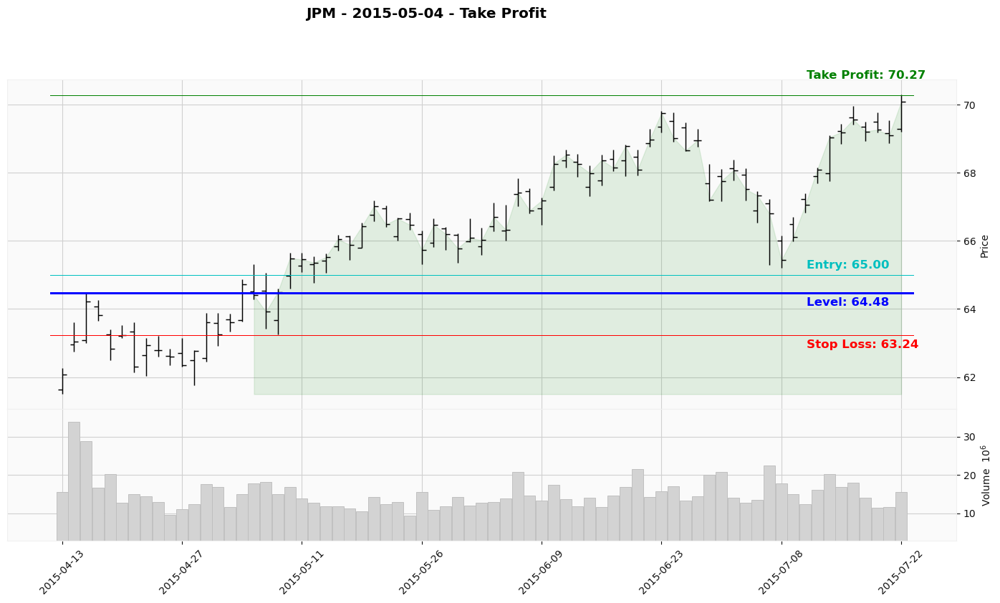

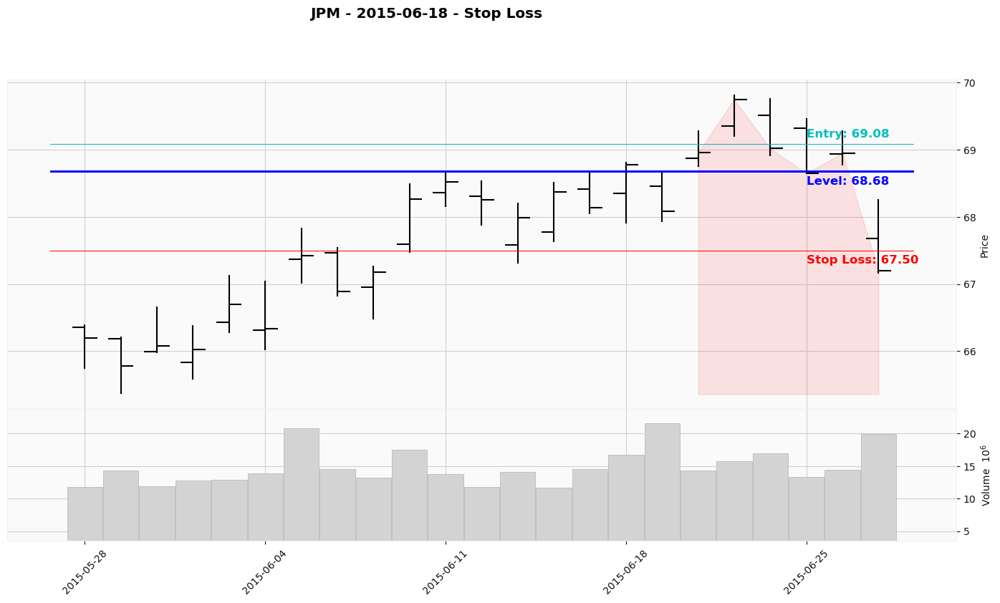

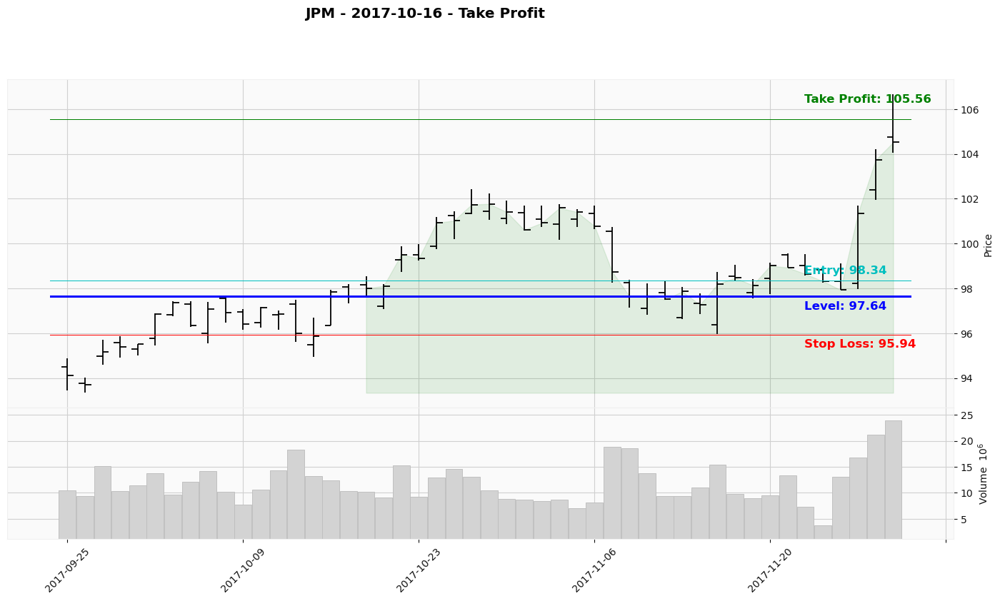

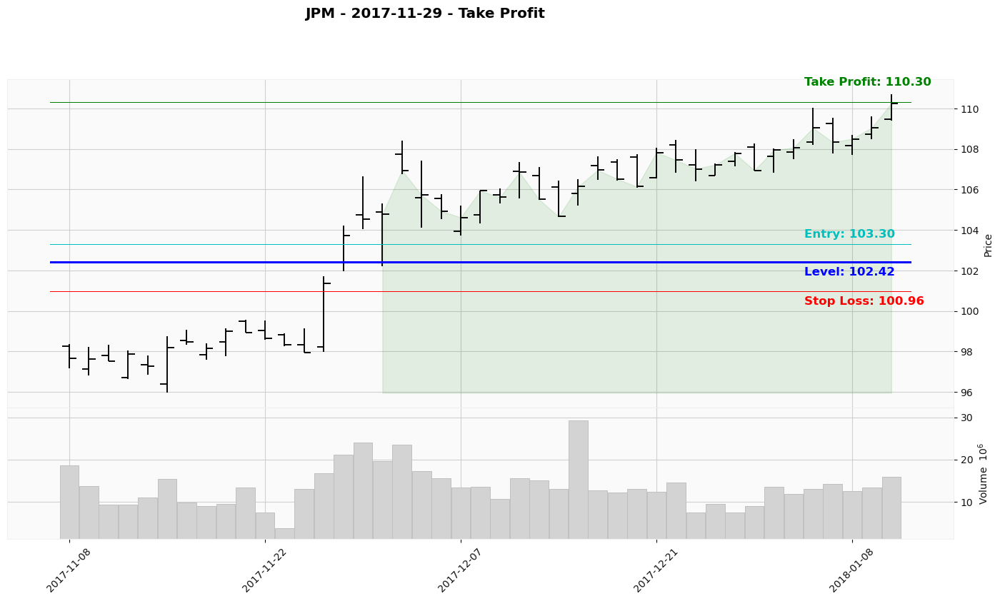

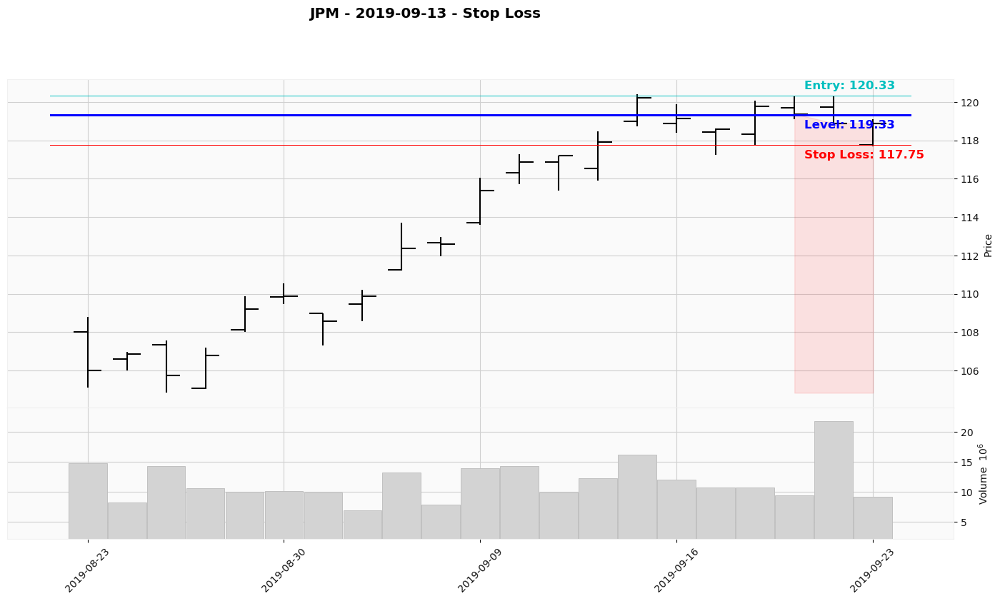

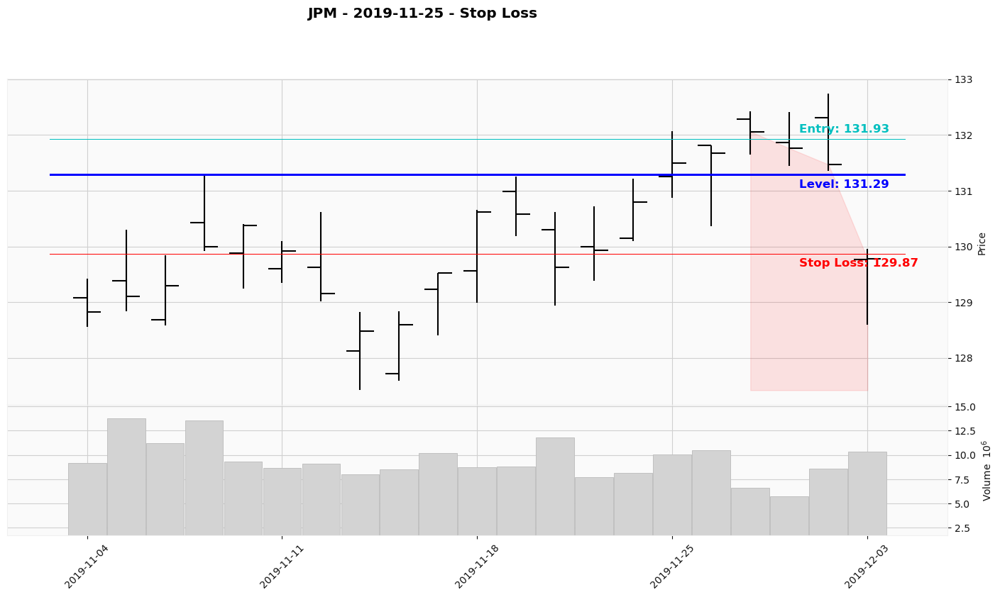

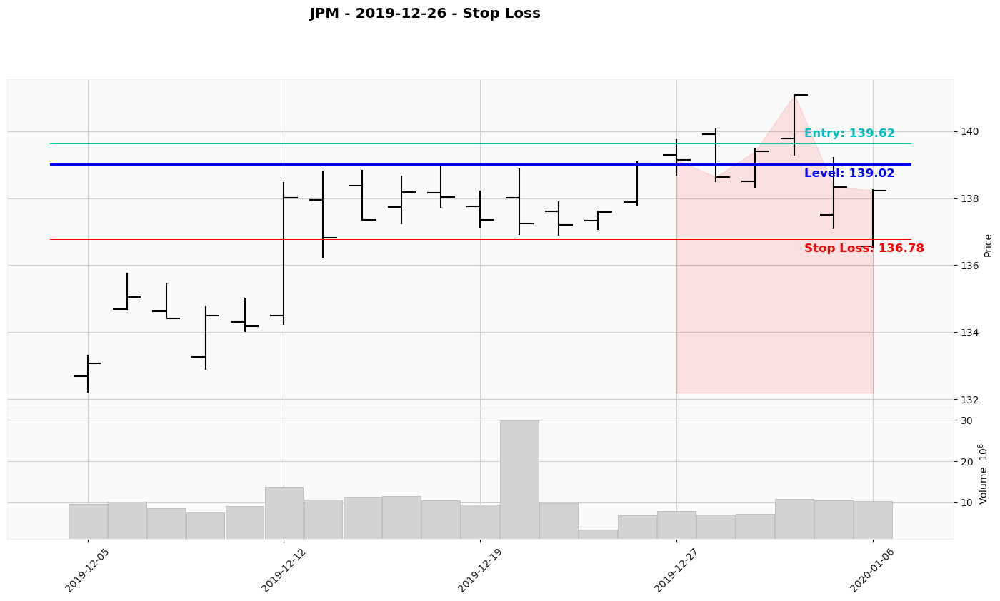

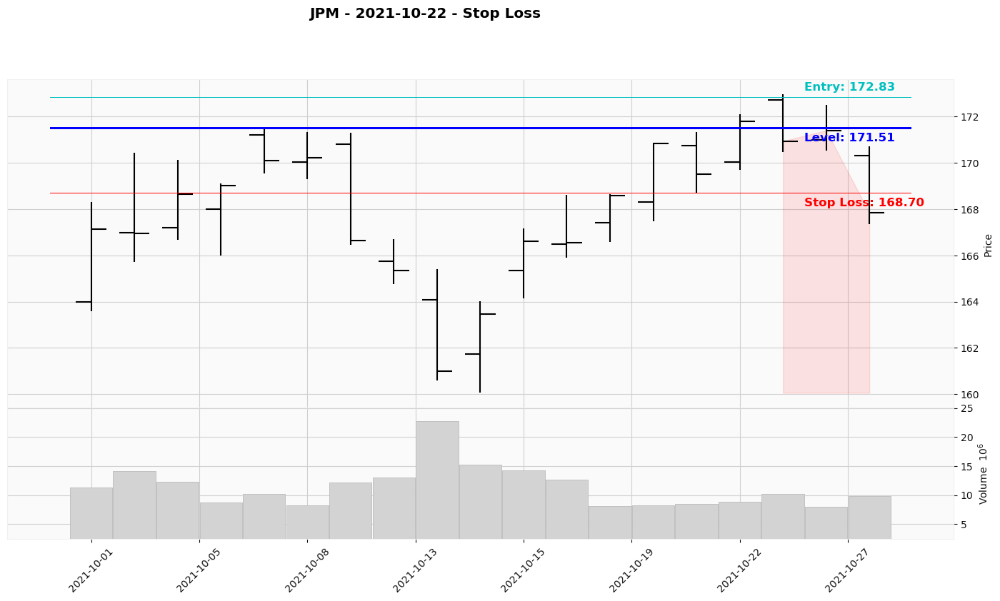

In [107]:

# Set the start date for printing
plot_period_start = '2015-01-01'

# Set the number of days to include in the past and future for printing
print_days_in_past = 15
print_days_in_future = 0

# Define column names
tp = "Takeprofit_3/1_Triggered"  # Take Profit column
sl = "Stoploss_3/1_Triggered"  # Stop Loss column
tp_date = "Takeprofit_3/1_Date"  # Take Profit date column
sl_date = "Stoploss_3/1_Date"  # Stop Loss date column
tp_price = tp.replace('Triggered', 'Price')  # Take Profit price column

# Select the relevant data for printing based on the start date
df_print = breakout_models_with_results[breakout_models_with_results.index >= plot_period_start]

# Iterate over each unique row in the breakout_models_with_results DataFrame
for (uniquerow), group in df_print.groupby(df_print["ID"]):
    symbol = group["Symbol"][0]  # Get the symbol for the current group

    # Plotting Profit Trades
    if group[tp][0] != 0:  # Check if Take Profit is triggered
        status = "Take Profit"
        group.loc[group.index[0], tp_date] = pd.Timestamp(group.loc[group.index[0], tp_date])  # Convert Take Profit date to Timestamp
        print_df_1d = jpm_df[group.index[0] - BDay(print_days_in_past):group[tp_date][0] + BDay(print_days_in_future)]
        # Select the relevant data for plotting based on the dates
        dates_df = pd.DataFrame(print_df_1d.index)
        buy_date = pd.Timestamp(group["Entry_Point_Date"][0]).normalize()  # Normalize the Entry Point date
        sell_date = pd.Timestamp(group[tp_date][0]).normalize()  # Normalize the Take Profit date
        where_values = pd.notnull(dates_df[(dates_df >= buy_date) & (dates_df <= sell_date)])['Date'].values
        # Get the values for plotting the fill_between area
        y1values = print_df_1d["close"].values
        y2value = print_df_1d['low'].min()
        level = group.iloc[0]["Level_Price"]

        # Generate the plot for profit trades
        fig, axlist = mpf.plot(
            print_df_1d,
            volume=True,
            hlines=dict(
                hlines=[group.iloc[0]["Level_Price"], group.iloc[0]["Entry_Price"], group.iloc[0]["Stoploss_Price"], group.iloc[0][tp_price]],
                colors=["b", "c", "r", "g"],
                linestyle=["-", "-", "-"],
                linewidths=[1, 0.7, 0.7, 0.7]  # Specify the linewidths for each horizontal line
            ),
            title=f"{symbol} - {group.iloc[0].name.date()} - {status} ",
            fill_between=dict(y1=y1values, y2=y2value, where=where_values, alpha=0.1, color='g'),
            datetime_format='%Y-%m-%d',
            figratio=(10, 5),
            figscale=1.6,
            style=custom_style,  # Apply the customized style
            returnfig=True,
        )

        # Add annotations for horizontal lines
        ax = axlist[0]
        ax.annotate(
            f"Stop Loss: {group.iloc[0]['Stoploss_Price']:.2f}",
            xy=(1, group.iloc[0]['Stoploss_Price']),
            xycoords=('axes fraction', 'data'),
            xytext=(-150, -10),
            textcoords='offset points',
            ha='left',
            va='center',
            fontsize=12,
            fontweight='bold',
            color='r'
        )

        # Add annotations for horizontal lines
        ax.annotate(
            f"Level: {group.iloc[0]['Level_Price']:.2f}",
            xy=(1, group.iloc[0]['Level_Price']),
            xycoords=('axes fraction', 'data'),
            xytext=(-150, -10),
            textcoords='offset points',
            ha='left',
            va='center',
            fontsize=12,
            fontweight='bold',
            color='b'
        )

        # Add annotations for horizontal lines
        ax.annotate(
            f"Entry: {group.iloc[0]['Entry_Price']:.2f}",
            xy=(1, group.iloc[0]['Entry_Price']),
            xycoords=('axes fraction', 'data'),
            xytext=(-150, 10),
            textcoords='offset points',
            ha='left',
            va='center',
            fontsize=12,
            fontweight='bold',
            color='c'
        )

        # Add annotations for horizontal lines
        ax.annotate(
            f"Take Profit: {group.iloc[0][tp_price]:.2f}",
            xy=(1, group.iloc[0][tp_price]),
            xycoords=('axes fraction', 'data'),
            xytext=(-150, 20),
            textcoords='offset points',
            ha='left',
            va='center',
            fontsize=12,
            fontweight='bold',
            color='g'
        )

        plt.show()
        
    # Plotting Negative Trades
    if group[sl][0] != 0:  # Check if Stop Loss is triggered
        status = "Stop Loss"
        group.loc[group.index[0], sl_date] = pd.Timestamp(group.loc[group.index[0], sl_date])  # Convert Stop Loss date to Timestamp
        print_df_1d = jpm_df[group.index[0] - BDay(15):group[sl_date][0] + BDay(0)]
        # Select the relevant data for plotting based on the dates
        dates_df = pd.DataFrame(print_df_1d.index)
        buy_date = pd.Timestamp(group["Entry_Point_Date"][0]).normalize()  # Normalize the Entry Point date
        sell_date = pd.Timestamp(group[sl_date][0]).normalize()  # Normalize the Stop Loss date
        where_values = pd.notnull(dates_df[(dates_df >= buy_date) & (dates_df <= sell_date)])['Date'].values
        # Get the values for plotting the fill_between area
        y1values = print_df_1d["close"].values
        y2value = print_df_1d['low'].min()
        level = group.iloc[0]["Level_Price"]

        # Generate the plot for negative trades
        fig, axlist = mpf.plot(
            print_df_1d,
            volume=True,
            hlines=dict(
                hlines=[group.iloc[0]["Level_Price"], group.iloc[0]["Entry_Price"], group.iloc[0]["Stoploss_Price"]],
                colors=["b", "c", "r"],
                linestyle=["-", "-", "-"],
                linewidths=[1, 0.7, 0.7]  # Specify the linewidths for each horizontal line
            ),
            title=f"{symbol} - {group.iloc[0].name.date()} - {status} ",
            fill_between=dict(y1=y1values, y2=y2value, where=where_values, alpha=0.1, color='r'),
            datetime_format='%Y-%m-%d',
            figratio=(10, 5),
            figscale=1.6,
            style=custom_style,  # Apply the customized style
            returnfig=True,
        )

        # Add annotations for horizontal lines
        ax = axlist[0]
        ax.annotate(
            f"Stop Loss: {group.iloc[0]['Stoploss_Price']:.2f}",
            xy=(1, group.iloc[0]['Stoploss_Price']),
            xycoords=('axes fraction', 'data'),
            xytext=(-150, -10),
            textcoords='offset points',
            ha='left',
            va='center',
            fontsize=12,
            fontweight='bold',
            color='r'
        )

        ax.annotate(
            f"Level: {group.iloc[0]['Level_Price']:.2f}",
            xy=(1, group.iloc[0]['Level_Price']),
            xycoords=('axes fraction', 'data'),
            xytext=(-150, -10),
            textcoords='offset points',
            ha='left',
            va='center',
            fontsize=12,
            fontweight='bold',
            color='b'
        )

        ax.annotate(
            f"Entry: {group.iloc[0]['Entry_Price']:.2f}",
            xy=(1, group.iloc[0]['Entry_Price']),
            xycoords=('axes fraction', 'data'),
            xytext=(-150, 10),
            textcoords='offset points',
            ha='left',
            va='center',
            fontsize=12,
            fontweight='bold',
            color='c'
        )

plt.show();  # Show the plots


### 2.4 Calculate Techical Indicators

In [7]:
# Define function to calculate technical indicators
def calculate_techical_indicators(df, close_column='close', adj_close_column='adjclose'):
    """
    Calculate various technical indicators based on the given DataFrame.

    :param df: DataFrame containing price data
    :param close_column: Column name for the close price (default: 'Close')
    :param adj_close_column: Column name for the adjusted close price (default: 'Adj Close')
    :return: DataFrame with added indicator columns
    """
    for window in [5, 8, 10, 12, 15, 20, 50, 100, 150, 200, 300, 400, 500]:
        # Calculate Simple Moving Average (SMA)
        df[f"SMA_{window}"] = df[adj_close_column].rolling(window=window).mean().shift(1)

        # Calculate Standard Deviation (STD)
        df[f"STD_{window}"] = df[adj_close_column].rolling(window=window).std().shift(1)

        # Calculate lower and upper Bollinger Bands based on SMA and STD
        df[f"Band1_{window}"] = df[f"SMA_{window}"] - df[f'STD_{window}']
        df[f"Band2_{window}"] = df[f"SMA_{window}"] + df[f'STD_{window}']

        # Calculate the distance of close price from the SMA
        df[f"Dist_From_Mean_{window}"] = df[close_column].shift(1) - df[f"SMA_{window}"]

        # Calculate Bollinger Bands using BollingerBands class from a library
        df[f"BB_{window}"] = BollingerBands(close=df[close_column], window=window, window_dev=2).bollinger_hband()

        # Calculate Kaufman's Adaptive Moving Average (KAMA) using KAMAIndicator class from a library
        df[f"KAMA_{window}"] = KAMAIndicator(close=df[close_column], window=window, pow1=2, pow2=30).kama()

        # Calculate Stochastic RSI (STOCHRSI) using StochRSIIndicator class from a library
        df[f"STOSHI_{window}"] = StochRSIIndicator(close=df[close_column], window=window, smooth1=3, smooth2=3).stochrsi()

        # Calculate Moving Average Convergence Divergence (MACD) using MACD class from a library
        df[f"MACD_{window}"] = MACD(close=df[close_column], window_slow=window, window_fast=12, window_sign=9).macd()

    return df


def rate_of_change(df, n, high_column='high'):
    """
    :param df: DataFrame containing price data
    :param n: Number of periods for ROC calculation
    :param high_column: Column name for the high price (default: 'high')
    :return: ROC values as a DataFrame column
    """
    delta = df[high_column].diff(n)
    prev_price = df[high_column].shift(n)
    df['ROC'] = (delta / prev_price) * 100

    return df


def hull_moving_average(df, n, close_column='close'):
    """
    :param df: DataFrame containing close price data
    :param n: Period for calculating the Hull Moving Average
    :param close_column: Column name for the close price (default: 'close')
    :return: Hull Moving Average values as a DataFrame column
    """
    wma_half_n = 2 * df[close_column].rolling(window=n // 2).mean()
    wma_full_n = df[close_column].rolling(window=n).mean()

    weighted_wma = wma_half_n - wma_full_n
    df['HMA'] = weighted_wma.rolling(window=int(n ** 0.5)).mean()

    return df


def ease_of_movement(df, n=1, high_column='high', low_column='low', volume_column='volume'):
    """
    :param df: DataFrame containing high, low, and volume data
    :param n: Period for calculating the Ease of Movement (default is 1)
    :param high_column: Column name for the high price (default: 'high')
    :param low_column: Column name for the low price (default: 'low')
    :param volume_column: Column name for the volume (default: 'volume')
    :return: Ease of Movement values as a DataFrame column
    """
    distance_moved = ((df[high_column] + df[low_column]) / 2) - ((df[high_column].shift(1) + df[low_column].shift(1)) / 2)
    box_ratio = (df[volume_column] / 1e6) / (df[high_column] - df[low_column])
    eom = distance_moved / box_ratio
    df['EOM'] = eom.rolling(window=n).mean()

    return df


def coppock_curve(df, roc1=14, roc2=11, wma=10, close_column='close'):
    """
    :param df: DataFrame containing close price data
    :param roc1: First rate of change period (default is 14)
    :param roc2: Second rate of change period (default is 11)
    :param wma: Weighted moving average period (default is 10)
    :param close_column: Column name for the close price (default: 'close')
    :return: Coppock Curve values as a DataFrame column
    """
    roc1_values = (df[close_column].diff(roc1) / df[close_column].shift(roc1)) * 100
    roc2_values = (df[close_column].diff(roc2) / df[close_column].shift(roc2)) * 100
    weighted_roc = roc1_values + roc2_values
    weights = pd.Series(range(1, wma + 1))
    df['Coppock_Curve'] = weighted_roc.rolling(wma).apply(lambda x: (x * weights).sum() / weights.sum(), raw=True).fillna(0)

    return df


def force_index(df, n=1, close_column='close', volume_column='volume'):
    """
    :param df: DataFrame containing close price and volume data
    :param n: Period for calculating the Force Index (default is 1)
    :param close_column: Column name for the close price (default: 'close')
    :param volume_column: Column name for the volume (default: 'volume')
    :return: Force Index values as a DataFrame column
    """
    df['Force_Index'] = (df[close_column].diff(n) * df[volume_column].shift(n)).fillna(0)

    return df


def gator_oscillator(df, jaw_period=13, teeth_period=8, lips_period=5, close_column='close'):
    """
    :param df: DataFrame containing close price data
    :param jaw_period: Jaw period for Alligator Indicator (default is 13)
    :param teeth_period: Teeth period for Alligator Indicator (default is 8)
    :param lips_period: Lips period for Alligator Indicator (default is 5)
    :param close_column: Column name for the close price (default: 'close')
    :return: Gator Oscillator values as two DataFrame columns (Gator_Upper and Gator_Lower)
    """
    jaw = df[close_column].rolling(jaw_period).mean().shift(jaw_period // 2 + 1)
    teeth = df[close_column].rolling(teeth_period).mean().shift(teeth_period // 2 + 1)
    lips = df[close_column].rolling(lips_period).mean().shift(lips_period // 2 + 1)

    df['Gator_Upper'] = abs(jaw - teeth)
    df['Gator_Lower'] = abs(teeth - lips)

    return df


def pivot_points(df, high_column='high', low_column='low', close_column='close'):
    """
    :param df: DataFrame containing high, low, and close price data
    :param high_column: Column name for the high price (default: 'high')
    :param low_column: Column name for the low price (default: 'low')
    :param close_column: Column name for the close price (default: 'close')
    :return: DataFrame with pivot points, support, and resistance levels
    """
    df['Pivot'] = (df[high_column].shift(1) + df[low_column].shift(1) + df[close_column].shift(1)) / 3
    df['R1'] = 2 * df['Pivot'] - df[low_column].shift(1)
    df['S1'] = 2 * df['Pivot'] - df[high_column].shift(1)
    df['R2'] = df['Pivot'] + (df[high_column].shift(1) - df[low_column].shift(1))
    df['S2'] = df['Pivot'] - (df[high_column].shift(1) - df[low_column].shift(1))
    df['R3'] = df[high_column].shift(1) + 2 * (df['Pivot'] - df[low_column].shift(1))
    df['S3'] = df[low_column].shift(1) - 2 * (df[high_column].shift(1) - df['Pivot'])

    return df


def percentage_price_oscillator(df, short_period=12, long_period=26, signal_period=9, close_column='close'):
    """
    :param df: DataFrame containing close price data
    :param short_period: Shorter period for calculating the EMA (default: 12)
    :param long_period: Longer period for calculating the EMA (default: 26)
    :param signal_period: Period for calculating the signal line (default: 9)
    :param close_column: Column name for the close price (default: 'close')
    :return: DataFrame with PPO, signal line, and histogram values
    """
    short_ema = df[close_column].ewm(span=short_period, adjust=False).mean()
    long_ema = df[close_column].ewm(span=long_period, adjust=False).mean()

    ppo = ((short_ema - long_ema) / long_ema) * 100
    ppo_signal = ppo.ewm(span=signal_period, adjust=False).mean()
    ppo_histogram = ppo - ppo_signal

    df['PPO'] = ppo
    df['PPO_Signal'] = ppo_signal
    df['PPO_Histogram'] = ppo_histogram

    return df


def williams_fractal(df, high_column='high', low_column='low'):
    """
    :param df: DataFrame containing high and low price data
    :param high_column: Column name for the high price (default: 'high')
    :param low_column: Column name for the low price (default: 'low')
    :return: DataFrame with bearish and bullish fractal columns
    """
    bearish_fractal = ((df[high_column].shift(2) < df[high_column].shift(1)) &
                       (df[high_column].shift(1) > df[high_column]) &
                       (df[high_column].shift(-1) < df[high_column].shift(1)) &
                       (df[high_column].shift(-2) < df[high_column].shift(1)))

    bullish_fractal = ((df[low_column].shift(2) > df[low_column].shift(1)) &
                       (df[low_column].shift(1) < df[low_column]) &
                       (df[low_column].shift(-1) > df[low_column].shift(1)) &
                       (df[low_column].shift(-2) > df[low_column].shift(1)))

    df['Bearish_Fractal'] = bearish_fractal.astype(int)
    df['Bullish_Fractal'] = bullish_fractal.astype(int)

    return df


def relative_vigor_index(df, period=10, open_column='open', close_column='close'):
    """
    :param df: DataFrame containing open and close price data
    :param period: Period for calculating the RVI (default: 10)
    :param open_column: Column name for the open price (default: 'open')
    :param close_column: Column name for the close price (default: 'close')
    :return: DataFrame with RVI column
    """
    num = df[close_column] - df[open_column]
    den = df[close_column].shift(1) - df[open_column].shift(1)

    rvi_raw = num / den
    rvi = rvi_raw.rolling(window=period).mean()

    df['RVI'] = rvi

    return df


def triple_exponential_moving_average(df, period=10, close_column='close'):
    """
    :param df: DataFrame containing close price data
    :param period: Period for calculating the TEMA (default: 10)
    :param close_column: Column name for the close price (default: 'close')
    :return: DataFrame with TEMA column
    """
    ema1 = df[close_column].ewm(span=period).mean()
    ema2 = ema1.ewm(span=period).mean()
    ema3 = ema2.ewm(span=period).mean()

    tema = 3 * ema1 - 3 * ema2 + ema3
    df['TEMA'] = tema

    return df


def detrended_price_oscillator(df, period=10, close_column='close'):
    """
    :param df: DataFrame containing close price data
    :param period: Period for calculating the DPO (default: 10)
    :param close_column: Column name for the close price (default: 'close')
    :return: DataFrame with DPO column
    """
    shift = int((period + 1) / 2)
    sma = df[close_column].rolling(window=period).mean().shift(shift)
    dpo = df[close_column] - sma
    df['DPO'] = dpo

    return df


def on_balance_volume_ratio(df, period=10, close_column='close', volume_column='volume'):
    """
    :param df: DataFrame containing close price and volume data
    :param period: Period for calculating the moving average of volume (default: 10)
    :param close_column: Column name for the close price (default: 'close')
    :param volume_column: Column name for the volume (default: 'volume')
    :return: DataFrame with OBV_Ratio column
    """
    df['volume_change'] = df[volume_column].where(df[close_column].diff() > 0, -df[volume_column])
    df['OBV'] = df['volume_change'].cumsum()
    df['MA_volume'] = df[volume_column].rolling(window=period).mean()
    df['OBV_Ratio'] = df['OBV'] / df['MA_volume']

    return df.drop(columns=['volume_change'])


def ehlers_fisher_transform(df, period=10, high_column='high', low_column='low'):
    """
    :param df: DataFrame containing high and low price data
    :param period: Period for calculating the Ehlers Fisher Transform (default: 10)
    :param high_column: Column name for the high price (default: 'high')
    :param low_column: Column name for the low price (default: 'low')
    :return: DataFrame with Ehlers_Fisher_Transform column
    """
    df['median'] = (df[high_column] + df[low_column]) / 2
    df['price_range'] = df['median'].rolling(window=period).max() - df['median'].rolling(window=period).min()
    df['price_ratio'] = (2 * (df['median'] - df['median'].rolling(window=period).min()) / df['price_range']) - 1
    df['price_ratio_clipped'] = np.clip(df['price_ratio'], -0.999, 0.999)

    # Smooth the price_ratio_clipped with EMA
    df['smoothed_ratio'] = df['price_ratio_clipped'].ewm(span=period).mean()
    df['Ehlers_Fisher_Transform'] = 0.5 * np.log((1 + df['smoothed_ratio']) / (1 - df['smoothed_ratio']))

    return df.drop(columns=['median', 'price_range', 'price_ratio', 'price_ratio_clipped', 'smoothed_ratio'])


def fisher_transform(df, period=10, high_column='high', low_column='low'):
    """
    :param df: DataFrame containing high and low price data
    :param period: Period for calculating the Fisher Transform (default: 10)
    :param high_column: Column name for the high price (default: 'high')
    :param low_column: Column name for the low price (default: 'low')
    :return: DataFrame with Fisher_Transform column
    """
    df['median'] = (df[high_column] + df[low_column]) / 2
    df['price_range'] = df['median'].rolling(window=period).max() - df['median'].rolling(window=period).min()
    df['price_ratio'] = (2 * (df['median'] - df['median'].rolling(window=period).min()) / df['price_range']) - 1
    df['price_ratio_clipped'] = np.clip(df['price_ratio'], -0.999, 0.999)
    df['Fisher_Transform'] = 0.5 * np.log((1 + df['price_ratio_clipped']) / (1 - df['price_ratio_clipped']))

    return df.drop(columns=['median', 'price_range', 'price_ratio', 'price_ratio_clipped'])


def balance_of_power(df, open_column='open', high_column='high', low_column='low', close_column='close'):
    """
    :param df: DataFrame containing open, high, low, and close price data
    :param open_column: Column name for the open price (default: 'open')
    :param high_column: Column name for the high price (default: 'high')
    :param low_column: Column name for the low price (default: 'low')
    :param close_column: Column name for the close price (default: 'close')
    :return: DataFrame with Balance_of_Power column
    """
    df['Balance_of_Power'] = (df[close_column] - df[open_column]) / (df[high_column] - df[low_column])

    return df

In [ ]:
from ta.volatility import *
from ta.momentum import *
from ta.trend import *

# Disable PerformanceWarning warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)


df_1d = jpm_df

df_1d = calculate_techical_indicators(jpm_df, close_column='close', adj_close_column='adjclose')

# Calculate rate of change using high prices
df_1d = rate_of_change(df_1d, n=5, high_column='high')

# Calculate Hull Moving Average using close prices
df_1d = hull_moving_average(df_1d, n=9, close_column='close')

# Calculate Ease of Movement using high, low, and volume data
df_1d = ease_of_movement(df_1d, n=1, high_column='high', low_column='low', volume_column='volume')

# Calculate Coppock Curve using close prices
df_1d = coppock_curve(df_1d, roc1=14, roc2=11, wma=10, close_column='close')

# Calculate Force Index using close prices and volume data
df_1d = force_index(df_1d, n=1, close_column='close', volume_column='volume')

# Calculate Gator Oscillator using close prices
df_1d = gator_oscillator(df_1d, jaw_period=13, teeth_period=8, lips_period=5, close_column='close')

# Calculate Pivot Points using high, low, and close prices
df_1d = pivot_points(df_1d, high_column='high', low_column='low', close_column='close')

# Calculate Percentage Price Oscillator using close prices
df_1d = percentage_price_oscillator(df_1d, short_period=12, long_period=26, signal_period=9, close_column='close')

# Calculate Williams Fractal using high and low prices
df_1d = williams_fractal(df_1d, high_column='high', low_column='low')

# Calculate Relative Vigor Index using open and close prices
df_1d = relative_vigor_index(df_1d, period=10, open_column='open', close_column='close')

# Calculate Triple Exponential Moving Average using close prices
df_1d = triple_exponential_moving_average(df_1d, period=10, close_column='close')

# Calculate Detrended Price Oscillator using close prices
df_1d = detrended_price_oscillator(df_1d, period=10, close_column='close')

# Calculate On-Balance Volume Ratio using close prices and volume data
df_1d = on_balance_volume_ratio(df_1d, period=10, close_column='close', volume_column='volume')

# Calculate Ehlers Fisher Transform using high and low prices
df_1d = ehlers_fisher_transform(df_1d, period=10, high_column='high', low_column='low')

# Calculate Fisher Transform using high and low prices
df_1d = fisher_transform(df_1d, period=10, high_column='high', low_column='low')

# Calculate Balance of Power using open, high, low, and close prices
df_1d = balance_of_power(df_1d, open_column='open', high_column='high', low_column='low', close_column='close')


### 2.5 Fundamental Features

### 2.5.1 Financial Growth History Features Add

In [114]:
# Load Data
jpn_financial_growth_df = pd.read_csv("/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/growth_quarterly/JPM.csv", index_col='date')

# Reverse the DataFrame
jpn_financial_growth_df = jpn_financial_growth_df[::-1]

jpn_financial_growth_df.tail()


,Unnamed: 0,symbol,period,revenueGrowth,grossProfitGrowth,ebitgrowth,operatingIncomeGrowth,netIncomeGrowth,epsgrowth,epsdilutedGrowth,weightedAverageSharesGrowth,weightedAverageSharesDilutedGrowth,dividendsperShareGrowth,operatingCashFlowGrowth,freeCashFlowGrowth,tenYRevenueGrowthPerShare,fiveYRevenueGrowthPerShare,threeYRevenueGrowthPerShare,tenYOperatingCFGrowthPerShare,fiveYOperatingCFGrowthPerShare,threeYOperatingCFGrowthPerShare,tenYNetIncomeGrowthPerShare,fiveYNetIncomeGrowthPerShare,threeYNetIncomeGrowthPerShare,tenYShareholdersEquityGrowthPerShare,fiveYShareholdersEquityGrowthPerShare,threeYShareholdersEquityGrowthPerShare,tenYDividendperShareGrowthPerShare,fiveYDividendperShareGrowthPerShare,threeYDividendperShareGrowthPerShare,receivablesGrowth,inventoryGrowth,assetGrowth,bookValueperShareGrowth,debtGrowth,rdexpenseGrowth,sgaexpensesGrowth
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-03-31,4,JPM,Q1,0.049903,-0.074307,-0.238736,-0.238736,-0.203577,-0.243553,-0.246418,-0.000268,-0.000268,0.013267,-1.492591,-1.492591,0.473117,0.516052,0.170467,-13.587349,-1.547837,0.424870,0.970951,0.564238,0.050014,0.930395,0.360810,0.221036,3.291006,1.042647,0.254985,1.201843,0,0.056395,-0.027713,0.396239,0,0.085175
2022-06-30,3,JPM,Q2,-0.000065,0.004689,0.104535,0.104535,0.044313,0.049242,0.049430,-0.004931,-0.004931,-0.020241,2.574970,2.574970,0.783586,0.501164,0.170680,1.025322,10.423186,6.236604,1.245895,0.492929,0.033995,0.923784,0.343130,0.194634,1.931903,0.733132,0.205630,0.004056,0,-0.028668,0.005813,-0.021369,0,-0.034716
2022-09-30,2,JPM,Q3,0.065147,0.072694,0.130596,0.130596,0.125795,0.129964,0.130435,-0.000303,-0.000303,0.020645,-1.275743,-1.275743,0.673313,0.591166,0.205947,-0.405413,-6.250058,-2.112651,1.193953,0.736197,0.159797,0.854995,0.338059,0.178383,2.588133,0.957786,0.240409,0.042688,0,-0.017554,0.006858,-0.033045,0,0.023840
2022-12-31,1,JPM,Q4,-0.013969,0.105214,0.144337,0.144337,0.130533,0.143770,0.147436,0.000573,0.000573,-0.011118,6.560426,6.560426,0.806397,0.651334,0.274574,29.895857,7.851147,0.292778,1.664089,2.446266,0.443703,0.844730,0.353333,0.187022,1.941450,0.588955,0.089869,-0.170742,0,-0.028655,0.014397,-0.003814,0,-0.016169
2023-03-31,0,JPM,Q1,0.188785,0.086518,1.891977,1.891977,0.146621,0.148045,0.145251,0.001887,0.001887,-0.002475,-2.098980,-2.098980,0.975472,0.608447,0.415842,-8.210883,-2.708619,0.039288,1.501800,0.695806,3.595134,0.894002,0.384666,0.209981,2.515561,0.766197,0.103879,-0.109548,0,0.021431,0.034820,0.034616,0,0.068688


In [115]:
# Drop columns 'Unnamed: 0', 'symbol', 'period' from the DataFrame
jpn_financial_growth_df.drop(columns=['Unnamed: 0', 'symbol', 'period'], inplace=True)

# Convert index to datetime format
jpn_financial_growth_df.index = jpn_financial_growth_df.index.astype("datetime64[ns]")

# Convert all numeric data to float
jpn_financial_growth_df = jpn_financial_growth_df.astype(float)

jpn_financial_growth_df.tail()

,revenueGrowth,grossProfitGrowth,ebitgrowth,operatingIncomeGrowth,netIncomeGrowth,epsgrowth,epsdilutedGrowth,weightedAverageSharesGrowth,weightedAverageSharesDilutedGrowth,dividendsperShareGrowth,operatingCashFlowGrowth,freeCashFlowGrowth,tenYRevenueGrowthPerShare,fiveYRevenueGrowthPerShare,threeYRevenueGrowthPerShare,tenYOperatingCFGrowthPerShare,fiveYOperatingCFGrowthPerShare,threeYOperatingCFGrowthPerShare,tenYNetIncomeGrowthPerShare,fiveYNetIncomeGrowthPerShare,threeYNetIncomeGrowthPerShare,tenYShareholdersEquityGrowthPerShare,fiveYShareholdersEquityGrowthPerShare,threeYShareholdersEquityGrowthPerShare,tenYDividendperShareGrowthPerShare,fiveYDividendperShareGrowthPerShare,threeYDividendperShareGrowthPerShare,receivablesGrowth,inventoryGrowth,assetGrowth,bookValueperShareGrowth,debtGrowth,rdexpenseGrowth,sgaexpensesGrowth
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-03-31,0.049903,-0.074307,-0.238736,-0.238736,-0.203577,-0.243553,-0.246418,-0.000268,-0.000268,0.013267,-1.492591,-1.492591,0.473117,0.516052,0.170467,-13.587349,-1.547837,0.424870,0.970951,0.564238,0.050014,0.930395,0.360810,0.221036,3.291006,1.042647,0.254985,1.201843,0.0,0.056395,-0.027713,0.396239,0.0,0.085175
2022-06-30,-0.000065,0.004689,0.104535,0.104535,0.044313,0.049242,0.049430,-0.004931,-0.004931,-0.020241,2.574970,2.574970,0.783586,0.501164,0.170680,1.025322,10.423186,6.236604,1.245895,0.492929,0.033995,0.923784,0.343130,0.194634,1.931903,0.733132,0.205630,0.004056,0.0,-0.028668,0.005813,-0.021369,0.0,-0.034716
2022-09-30,0.065147,0.072694,0.130596,0.130596,0.125795,0.129964,0.130435,-0.000303,-0.000303,0.020645,-1.275743,-1.275743,0.673313,0.591166,0.205947,-0.405413,-6.250058,-2.112651,1.193953,0.736197,0.159797,0.854995,0.338059,0.178383,2.588133,0.957786,0.240409,0.042688,0.0,-0.017554,0.006858,-0.033045,0.0,0.023840
2022-12-31,-0.013969,0.105214,0.144337,0.144337,0.130533,0.143770,0.147436,0.000573,0.000573,-0.011118,6.560426,6.560426,0.806397,0.651334,0.274574,29.895857,7.851147,0.292778,1.664089,2.446266,0.443703,0.844730,0.353333,0.187022,1.941450,0.588955,0.089869,-0.170742,0.0,-0.028655,0.014397,-0.003814,0.0,-0.016169
2023-03-31,0.188785,0.086518,1.891977,1.891977,0.146621,0.148045,0.145251,0.001887,0.001887,-0.002475,-2.098980,-2.098980,0.975472,0.608447,0.415842,-8.210883,-2.708619,0.039288,1.501800,0.695806,3.595134,0.894002,0.384666,0.209981,2.515561,0.766197,0.103879,-0.109548,0.0,0.021431,0.034820,0.034616,0.0,0.068688


In [116]:
# Display info
jpn_financial_growth_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 80 entries, 2003-06-30 to 2023-03-31
Data columns (total 34 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   revenueGrowth                           80 non-null     float64
 1   grossProfitGrowth                       80 non-null     float64
 2   ebitgrowth                              80 non-null     float64
 3   operatingIncomeGrowth                   80 non-null     float64
 4   netIncomeGrowth                         80 non-null     float64
 5   epsgrowth                               80 non-null     float64
 6   epsdilutedGrowth                        80 non-null     float64
 7   weightedAverageSharesGrowth             80 non-null     float64
 8   weightedAverageSharesDilutedGrowth      80 non-null     float64
 9   dividendsperShareGrowth                 80 non-null     float64
 10  operatingCashFlowGrowth                 80 n

In [8]:
def add_financial_growth_history(breakout_models_with_results, financial_growth_df):
    """
    Update breakout models with financial growth data.

    Parameters
    ----------
    breakout_models_with_results : pandas.DataFrame
        The DataFrame containing breakout models with results.
    financial_growth_df : pandas.DataFrame
        The DataFrame containing financial growth data.

    Returns
    -------
    pandas.DataFrame
        The DataFrame containing updated breakout models.

    """
    # Check if both data frames are not empty
    if not financial_growth_df.empty and not breakout_models_with_results.empty:
        # Iterate over each row in models_with_results
        for index, row in breakout_models_with_results.iterrows():
            # Get the latest quarterly growth report from df_growth_quarterly that is before or equal to the current row's index
            past_growth_report = financial_growth_df[
                financial_growth_df.index <= index
            ].tail(1)

            # Prefix column names with 'Financial_Growth_'
            past_growth_report = past_growth_report.add_prefix('Financial_Growth_')

            # If a past growth report is found
            if not past_growth_report.empty:
                # Update the relevant columns in models_with_results with the values from the growth report
                for column in past_growth_report.columns:
                    breakout_models_with_results.loc[
                        index, 
                        column
                    ] = past_growth_report[column].values[0]
            # If no past growth report is found
            else:
                # Set the values to None
                for column in past_growth_report.columns:
                    breakout_models_with_results.loc[
                        index, 
                        column
                    ] = None

    return breakout_models_with_results


In [118]:
# Adding financial growth history to breakout models with results
breakout_models_with_results = add_financial_growth_history(breakout_models_with_results, jpn_financial_growth_df)

breakout_models_with_results.loc[:,'Financial_Growth_revenueGrowth':].tail()

,Financial_Growth_revenueGrowth,Financial_Growth_grossProfitGrowth,Financial_Growth_ebitgrowth,Financial_Growth_operatingIncomeGrowth,Financial_Growth_netIncomeGrowth,Financial_Growth_epsgrowth,Financial_Growth_epsdilutedGrowth,Financial_Growth_weightedAverageSharesGrowth,Financial_Growth_weightedAverageSharesDilutedGrowth,Financial_Growth_dividendsperShareGrowth,Financial_Growth_operatingCashFlowGrowth,Financial_Growth_freeCashFlowGrowth,Financial_Growth_tenYRevenueGrowthPerShare,Financial_Growth_fiveYRevenueGrowthPerShare,Financial_Growth_threeYRevenueGrowthPerShare,Financial_Growth_tenYOperatingCFGrowthPerShare,Financial_Growth_fiveYOperatingCFGrowthPerShare,Financial_Growth_threeYOperatingCFGrowthPerShare,Financial_Growth_tenYNetIncomeGrowthPerShare,Financial_Growth_fiveYNetIncomeGrowthPerShare,Financial_Growth_threeYNetIncomeGrowthPerShare,Financial_Growth_tenYShareholdersEquityGrowthPerShare,Financial_Growth_fiveYShareholdersEquityGrowthPerShare,Financial_Growth_threeYShareholdersEquityGrowthPerShare,Financial_Growth_tenYDividendperShareGrowthPerShare,Financial_Growth_fiveYDividendperShareGrowthPerShare,Financial_Growth_threeYDividendperShareGrowthPerShare,Financial_Growth_receivablesGrowth,Financial_Growth_inventoryGrowth,Financial_Growth_assetGrowth,Financial_Growth_bookValueperShareGrowth,Financial_Growth_debtGrowth,Financial_Growth_rdexpenseGrowth,Financial_Growth_sgaexpensesGrowth
Breakout_Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-11-29,-0.005801,-0.011977,-0.033226,-0.033226,-0.042254,-0.032787,-0.027624,-0.010947,-0.010947,-0.096473,-1.429835,-1.429835,0.452786,0.051628,0.083457,0.808888,0.806152,-0.309916,0.892850,0.263654,0.285944,1.042439,0.386333,0.189101,0.490637,0.832750,0.296067,-0.035619,0.0,-0.000039,0.010674,-0.010364,0.0,0.005229
2019-09-13,-0.009992,-0.011560,0.007641,0.007641,0.050154,0.067925,0.068182,-0.014631,-0.014631,0.019867,0.828709,0.828709,0.315719,0.378977,0.344597,-1.308538,-2.707034,-9.335737,2.950024,0.796297,0.685658,0.988627,0.354306,0.185586,3.197837,0.973919,0.594067,0.223685,0.0,-0.003584,0.028041,-0.037104,0.0,-0.017454
2019-11-25,0.017654,0.013507,-0.005659,-0.005659,-0.012185,-0.049470,-0.049645,-0.016106,-0.016106,-0.007973,2.277248,2.277248,0.353234,0.429549,0.360722,1.849373,9.535441,3.829983,2.107220,0.925036,0.652829,1.000423,0.350230,0.189305,13.495229,1.045634,0.645291,0.006663,0.0,0.013670,0.020744,-0.009732,0.0,0.010952
2019-12-26,0.017654,0.013507,-0.005659,-0.005659,-0.012185,-0.049470,-0.049645,-0.016106,-0.016106,-0.007973,2.277248,2.277248,0.353234,0.429549,0.360722,1.849373,9.535441,3.829983,2.107220,0.925036,0.652829,1.000423,0.350230,0.189305,13.495229,1.045634,0.645291,0.006663,0.0,0.013670,0.020744,-0.009732,0.0,0.010952
2021-10-22,-0.027297,-0.031077,-0.072536,-0.072536,-0.023225,-0.013193,-0.010582,-0.012098,-0.012098,0.024246,0.724390,0.724390,0.602370,0.467379,0.228418,2.845139,5.796660,0.998080,2.383849,1.181475,0.513521,1.043558,0.392655,0.265100,2.822787,0.863954,0.569293,-0.070721,0.0,0.019901,0.025165,-0.008543,0.0,-0.030421


### 2.5.2 Balance Sheet History Features Add

In [126]:
# Load data
jpn_balance_sheet_df = pd.read_csv("/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/Balance_sheet_statements/JPM.csv", index_col='date')

#Reverse the DataFrame
jpn_balance_sheet_df = jpn_balance_sheet_df[::-1]

# Remove unnecessary columns from the DataFrame
jpn_balance_sheet_df.drop(columns=[
    
    'Unnamed: 0', 
    'symbol',
    'reportedCurrency', 
    'cik', 
    'fillingDate',
    'acceptedDate', 
    'calendarYear', 
    'period',
    'link', 
    'finalLink'
    
], inplace=True)

# Convert index to datetime format
jpn_balance_sheet_df.index = jpn_balance_sheet_df.index.astype("datetime64[ns]")

# Convert all numeric data to float
jpn_balance_sheet_df = jpn_balance_sheet_df.astype(float)

jpn_balance_sheet_df.tail()

,cashAndCashEquivalents,shortTermInvestments,cashAndShortTermInvestments,netReceivables,inventory,otherCurrentAssets,totalCurrentAssets,propertyPlantEquipmentNet,goodwill,intangibleAssets,goodwillAndIntangibleAssets,longTermInvestments,taxAssets,otherNonCurrentAssets,totalNonCurrentAssets,otherAssets,totalAssets,accountPayables,shortTermDebt,taxPayables,deferredRevenue,otherCurrentLiabilities,totalCurrentLiabilities,longTermDebt,deferredRevenueNonCurrent,deferredTaxLiabilitiesNonCurrent,otherNonCurrentLiabilities,totalNonCurrentLiabilities,otherLiabilities,capitalLeaseObligations,totalLiabilities,preferredStock,commonStock,retainedEarnings,accumulatedOtherComprehensiveIncomeLoss,othertotalStockholdersEquity,totalStockholdersEquity,totalEquity,totalLiabilitiesAndStockholdersEquity,minorityInterest,totalLiabilitiesAndTotalEquity,totalInvestments,totalDebt,netDebt
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-03-31,7.545320e+11,3.128750e+11,1.047288e+12,2.258430e+11,0.0,0.0,1.199495e+12,2.691600e+10,5.029800e+10,8.187000e+09,5.848500e+10,1.117352e+12,0.0,-6.724100e+10,1.135512e+12,1.619680e+12,3.954687e+12,3.206710e+11,5.758600e+10,0.000000e+00,0.0,-3.782570e+11,3.782570e+11,4.375190e+11,0.0,0.0,-5.926200e+10,3.782570e+11,2.912274e+12,0.0,3.668788e+12,3.283800e+10,4.105000e+09,2.771770e+11,-9.567000e+09,-1.865400e+10,2.858990e+11,2.858990e+11,3.954687e+12,0.0,3.954687e+12,1.342867e+12,4.951050e+11,-2.594270e+11
2022-06-30,6.692600e+11,2.220690e+11,8.761670e+11,2.267590e+11,0.0,0.0,1.021609e+12,2.677000e+10,5.069700e+10,8.663000e+09,5.936000e+10,1.047978e+12,0.0,-3.191500e+10,1.102193e+12,1.717512e+12,3.841314e+12,3.133260e+11,5.842200e+10,0.000000e+00,0.0,-3.717480e+11,3.717480e+11,4.261030e+11,0.0,0.0,-5.435500e+10,3.717480e+11,2.811675e+12,0.0,3.555171e+12,3.283800e+10,4.105000e+09,2.824450e+11,-1.436900e+10,-1.887600e+10,2.861430e+11,2.861430e+11,3.841314e+12,0.0,3.841314e+12,1.222970e+12,4.845250e+11,-1.847350e+11
2022-09-30,6.441870e+11,1.881400e+11,3.000000e+06,2.364390e+11,0.0,0.0,3.209340e+11,2.719900e+10,5.146100e+10,9.345000e+09,6.080600e+10,1.032199e+12,0.0,-4.139530e+11,7.062510e+11,2.746699e+12,3.773884e+12,3.000160e+11,4.786600e+10,3.292900e+10,0.0,-3.478820e+11,3.478820e+11,4.206480e+11,0.0,0.0,3.044832e+12,3.465480e+12,-3.274960e+11,0.0,3.485866e+12,3.283800e+10,4.105000e+09,2.887760e+11,-1.913400e+10,-1.856700e+10,2.880180e+11,2.880180e+11,3.773884e+12,0.0,3.773884e+12,7.952720e+11,4.685140e+11,-1.756730e+11
2022-12-31,5.672340e+11,2.058570e+11,7.730910e+11,1.960690e+11,0.0,0.0,9.691600e+11,2.773400e+10,5.166200e+10,9.197000e+09,6.085900e+10,1.014081e+12,0.0,-1.102674e+12,1.102674e+12,1.593909e+12,3.665743e+12,3.001410e+11,4.402700e+10,4.616600e+10,0.0,-3.441680e+11,3.441680e+11,4.227000e+11,0.0,0.0,2.908821e+12,3.331521e+12,-3.022780e+11,0.0,3.373411e+12,2.740400e+10,4.105000e+09,2.964560e+11,-1.734100e+10,-1.829200e+10,2.923320e+11,2.923320e+11,3.665743e+12,0.0,3.665743e+12,1.219938e+12,4.667270e+11,-1.005070e+11
2023-03-31,5.460000e+11,1.972480e+11,7.432480e+11,1.745900e+11,0.0,0.0,9.178380e+11,2.826600e+10,5.214400e+10,9.946000e+09,6.209000e+10,1.129693e+12,0.0,-1.220049e+12,1.220049e+12,1.606418e+12,3.744305e+12,2.750770e+11,4.224100e+10,0.000000e+00,0.0,-3.173180e+11,3.173180e+11,4.406420e+11,0.0,0.0,-1.233240e+11,3.173180e+11,2.806587e+12,0.0,3.441223e+12,2.740400e+10,4.105000e+09,3.062080e+11,-1.441800e+10,-2.021700e+10,3.030820e+11,3.030820e+11,3.744305e+12,0.0,3.744305e+12,1.326941e+12,4.828830e+11,-6.311700e+10


In [127]:
# Display info
jpn_balance_sheet_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 134 entries, 1989-12-31 to 2023-03-31
Data columns (total 44 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   cashAndCashEquivalents                   134 non-null    float64
 1   shortTermInvestments                     134 non-null    float64
 2   cashAndShortTermInvestments              134 non-null    float64
 3   netReceivables                           134 non-null    float64
 4   inventory                                134 non-null    float64
 5   otherCurrentAssets                       134 non-null    float64
 6   totalCurrentAssets                       134 non-null    float64
 7   propertyPlantEquipmentNet                134 non-null    float64
 8   goodwill                                 134 non-null    float64
 9   intangibleAssets                         134 non-null    float64
 10  goodwillAndIntangibleAssets    

In [9]:
def add_balance_sheet_history(breakout_models_with_results, balance_sheet_df):
    """
    Add balance sheet history features to the breakout models.

    Parameters
    ----------
    breakout_models_with_results : DataFrame
        The breakout models with existing results.
    balance_sheet_df : DataFrame
        The balance sheet data frame.

    Returns
    -------
    DataFrame
        The breakout models with added balance sheet history features.
    """

    # Check if both data frames are not empty
    if not balance_sheet_df.empty and not breakout_models_with_results.empty:
        # Iterate over each row in breakout_models_with_results
        for index, row in breakout_models_with_results.iterrows():
            # Get the latest balance sheet report from balance_sheet_df that is before or equal to the current row's index
            past_balance_report = balance_sheet_df[
                balance_sheet_df.index <= index
            ].tail(1)

            # Add the prefix "Balance_Sheet_" to the column names in past_balance_report
            past_balance_report = past_balance_report.add_prefix('Balance_Sheet_')

            # If a past balance sheet report is found
            if not past_balance_report.empty:
                # Update the relevant columns in breakout_models_with_results with the values from the balance sheet report
                for column in past_balance_report.columns:
                    breakout_models_with_results.loc[
                        index, 
                        column
                    ] = past_balance_report[column].values[0]
            # If no past balance sheet report is found
            else:
                # Set the values to None
                for column in past_balance_report.columns:
                    breakout_models_with_results.loc[
                        index, 
                        column
                    ] = None
                    
    return breakout_models_with_results


In [124]:
# Adding balance sheet history to breakout models with results
models_balance_sheet = add_balance_sheet_history(breakout_models_with_results, jpn_balance_sheet_df)

models_balance_sheet.loc[:, 'Balance_Sheet_cashAndCashEquivalents':].tail()

,Balance_Sheet_cashAndCashEquivalents,Balance_Sheet_shortTermInvestments,Balance_Sheet_cashAndShortTermInvestments,Balance_Sheet_netReceivables,Balance_Sheet_inventory,Balance_Sheet_otherCurrentAssets,Balance_Sheet_totalCurrentAssets,Balance_Sheet_propertyPlantEquipmentNet,Balance_Sheet_goodwill,Balance_Sheet_intangibleAssets,Balance_Sheet_goodwillAndIntangibleAssets,Balance_Sheet_longTermInvestments,Balance_Sheet_taxAssets,Balance_Sheet_otherNonCurrentAssets,Balance_Sheet_totalNonCurrentAssets,Balance_Sheet_otherAssets,Balance_Sheet_totalAssets,Balance_Sheet_accountPayables,Balance_Sheet_shortTermDebt,Balance_Sheet_taxPayables,Balance_Sheet_deferredRevenue,Balance_Sheet_otherCurrentLiabilities,Balance_Sheet_totalCurrentLiabilities,Balance_Sheet_longTermDebt,Balance_Sheet_deferredRevenueNonCurrent,Balance_Sheet_deferredTaxLiabilitiesNonCurrent,Balance_Sheet_otherNonCurrentLiabilities,Balance_Sheet_totalNonCurrentLiabilities,Balance_Sheet_otherLiabilities,Balance_Sheet_capitalLeaseObligations,Balance_Sheet_totalLiabilities,Balance_Sheet_preferredStock,Balance_Sheet_commonStock,Balance_Sheet_retainedEarnings,Balance_Sheet_accumulatedOtherComprehensiveIncomeLoss,Balance_Sheet_othertotalStockholdersEquity,Balance_Sheet_totalStockholdersEquity,Balance_Sheet_totalEquity,Balance_Sheet_totalLiabilitiesAndStockholdersEquity,Balance_Sheet_minorityInterest,Balance_Sheet_totalLiabilitiesAndTotalEquity,Balance_Sheet_totalInvestments,Balance_Sheet_totalDebt,Balance_Sheet_netDebt
Breakout_Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-11-29,4.578040e+11,2.162090e+11,6.740130e+11,6.175700e+10,0.0,0.0,0.0,1.421800e+10,4.730900e+10,6.546000e+09,5.385500e+10,5.420630e+11,0.0,0.0,0.0,2.563074e+12,2.563074e+12,1.967640e+11,2.424800e+10,0.0,0.0,0.0,0.0,3.159670e+11,0.0,0.0,0.0,0.0,2.304692e+12,0.0,2.304692e+12,2.606800e+10,4.105000e+09,1.758270e+11,-3.090000e+08,5.269100e+10,2.583820e+11,2.583820e+11,2.563074e+12,0.0,2.563074e+12,7.582720e+11,3.402150e+11,-1.175890e+11
2019-09-13,2.680380e+11,2.763570e+11,5.443950e+11,8.839900e+10,0.0,0.0,0.0,2.466500e+10,4.747700e+10,5.825000e+09,5.330200e+10,6.890740e+11,0.0,0.0,0.0,2.727379e+12,2.727379e+12,2.161370e+11,5.989000e+10,0.0,0.0,0.0,0.0,2.888690e+11,0.0,0.0,0.0,0.0,2.464164e+12,0.0,2.464164e+12,2.699300e+10,4.105000e+09,2.120930e+11,1.114000e+09,1.891000e+10,2.632150e+11,2.632150e+11,2.727379e+12,0.0,2.727379e+12,9.654310e+11,3.487590e+11,8.072100e+10
2019-11-25,2.565970e+11,3.534210e+11,6.100180e+11,8.898800e+10,0.0,0.0,0.0,2.511700e+10,4.781800e+10,5.260000e+09,5.307800e+10,7.512990e+11,0.0,0.0,0.0,2.764661e+12,2.764661e+12,2.250630e+11,4.889300e+10,0.0,0.0,0.0,0.0,2.964720e+11,0.0,0.0,0.0,0.0,2.500313e+12,0.0,2.500313e+12,2.836300e+10,4.105000e+09,2.178880e+11,1.800000e+09,1.219200e+10,2.643480e+11,2.643480e+11,2.764661e+12,0.0,2.764661e+12,1.104720e+12,3.453650e+11,8.876800e+10
2019-12-26,2.565970e+11,3.534210e+11,6.100180e+11,8.898800e+10,0.0,0.0,0.0,2.511700e+10,4.781800e+10,5.260000e+09,5.307800e+10,7.512990e+11,0.0,0.0,0.0,2.764661e+12,2.764661e+12,2.250630e+11,4.889300e+10,0.0,0.0,0.0,0.0,2.964720e+11,0.0,0.0,0.0,0.0,2.500313e+12,0.0,2.500313e+12,2.836300e+10,4.105000e+09,2.178880e+11,1.800000e+09,1.219200e+10,2.643480e+11,2.643480e+11,2.764661e+12,0.0,2.764661e+12,1.104720e+12,3.453650e+11,8.876800e+10
2021-10-22,7.598690e+11,2.379690e+11,9.978380e+11,1.163950e+11,0.0,0.0,0.0,2.699600e+10,5.031300e+10,6.253000e+09,5.656600e+10,9.933650e+11,0.0,0.0,0.0,3.757576e+12,3.757576e+12,2.686040e+11,5.039300e+10,0.0,0.0,0.0,0.0,2.984650e+11,0.0,0.0,0.0,0.0,3.467535e+12,0.0,3.467535e+12,3.483800e+10,4.105000e+09,2.652760e+11,9.630000e+08,-1.514100e+10,2.900410e+11,2.900410e+11,3.757576e+12,0.0,3.757576e+12,1.231334e+12,3.488580e+11,-4.110110e+11


### 2.5.3 Cash Flow Features Add

In [128]:
# Load Data
jpn_cash_flow_df = pd.read_csv("/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/cash_flow_statement/JPM.csv", index_col='date')

# Reverse the DataFrame in chronological order
jpn_cash_flow_df = jpn_cash_flow_df[::-1]

# Remove unnecessary columns from the DataFrame
jpn_cash_flow_df.drop(columns=[
    
    'Unnamed: 0', 
    'symbol',
    'reportedCurrency', 
    'cik', 
    'fillingDate',
    'acceptedDate', 
    'calendarYear', 
    'period',
    'link', 
    'finalLink'
    
], inplace=True)

# Convert index to datetime format
jpn_cash_flow_df.index = jpn_cash_flow_df.index.astype("datetime64[ns]")

# Convert all numeric data to float
jpn_cash_flow_df = jpn_cash_flow_df.astype(float)

jpn_cash_flow_df.tail()

,netIncome,depreciationAndAmortization,deferredIncomeTax,stockBasedCompensation,changeInWorkingCapital,accountsReceivables,inventory,accountsPayables,otherWorkingCapital,otherNonCashItems,netCashProvidedByOperatingActivities,investmentsInPropertyPlantAndEquipment,acquisitionsNet,purchasesOfInvestments,salesMaturitiesOfInvestments,otherInvestingActivites,netCashUsedForInvestingActivites,debtRepayment,commonStockIssued,commonStockRepurchased,dividendsPaid,otherFinancingActivites,netCashUsedProvidedByFinancingActivities,effectOfForexChangesOnCash,netChangeInCash,cashAtEndOfPeriod,cashAtBeginningOfPeriod,operatingCashFlow,capitalExpenditure,freeCashFlow
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-03-31,8.282000e+09,1.820000e+09,-7.300000e+08,0.0,-6.386100e+10,-4.971900e+10,0.0,6.473800e+10,-7.888000e+10,1.257200e+10,-4.191700e+10,0.0,0.0,-5.858000e+10,3.777400e+10,-5.180200e+10,-7.260800e+10,-1.309400e+10,0.0,-4.455000e+09,-3.430000e+09,1.537510e+11,1.327720e+11,-4.549000e+09,1.369800e+10,7.545320e+11,7.408340e+11,-4.191700e+10,0.0,-4.191700e+10
2022-06-30,8.649000e+09,1.789000e+09,-1.356000e+09,0.0,5.006500e+10,6.668000e+09,0.0,6.238000e+09,3.715900e+10,6.871000e+09,6.601800e+10,0.0,0.0,-3.511000e+10,4.130800e+10,-5.940100e+10,-5.320300e+10,-1.289700e+10,0.0,-7.070000e+08,-3.344000e+09,-6.685400e+10,-8.380200e+10,-1.428500e+10,-8.527200e+10,6.692600e+11,7.545320e+11,6.601800e+10,0.0,6.601800e+10
2022-09-30,9.737000e+09,1.771000e+09,-1.369000e+09,0.0,-3.568700e+10,1.430000e+09,0.0,4.985000e+09,-4.210200e+10,7.344000e+09,-1.820400e+10,0.0,0.0,-1.084300e+10,4.735800e+10,3.007000e+09,3.952200e+10,-1.147900e+10,0.0,2.000000e+09,-3.412000e+09,-1.999200e+10,-3.288300e+10,-1.350800e+10,-2.507300e+10,6.441870e+11,6.692600e+11,-1.820400e+10,0.0,-1.820400e+10
2022-12-31,1.100800e+10,1.671000e+09,7.170000e+08,0.0,8.216900e+10,1.865100e+10,0.0,-1.734700e+10,8.086500e+10,5.657000e+09,1.012220e+11,0.0,0.0,-5.540100e+10,4.596100e+10,-4.209000e+10,-5.153000e+10,-8.086000e+09,0.0,-5.434000e+09,-3.376000e+09,-1.254480e+11,-1.423440e+11,1.569900e+10,-7.695300e+10,5.672340e+11,6.441870e+11,1.012220e+11,0.0,1.012220e+11
2023-03-31,1.262200e+10,1.649000e+09,-6.060000e+08,0.0,-1.282220e+11,9.823000e+09,0.0,-2.784700e+10,-1.101980e+11,3.316000e+09,-1.112410e+11,0.0,0.0,-3.011100e+10,5.483000e+10,-9.250000e+08,2.379400e+10,-1.617100e+10,0.0,-2.690000e+09,-3.374000e+09,8.679200e+10,6.455700e+10,1.656000e+09,-2.123400e+10,5.460000e+11,5.672340e+11,-1.112410e+11,0.0,-1.112410e+11


In [129]:
# Display info
jpn_cash_flow_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 133 entries, 1990-03-31 to 2023-03-31
Data columns (total 30 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   netIncome                                 133 non-null    float64
 1   depreciationAndAmortization               133 non-null    float64
 2   deferredIncomeTax                         133 non-null    float64
 3   stockBasedCompensation                    133 non-null    float64
 4   changeInWorkingCapital                    133 non-null    float64
 5   accountsReceivables                       133 non-null    float64
 6   inventory                                 133 non-null    float64
 7   accountsPayables                          133 non-null    float64
 8   otherWorkingCapital                       133 non-null    float64
 9   otherNonCashItems                         133 non-null    float64
 10  netCashProvidedByOp

In [10]:
def add_cash_flow_statement_history(breakout_models_with_results, cash_flow_df):
    """
    Add cash flow statement history features to the breakout models.

    Parameters
    ----------
    breakout_models_with_results : DataFrame
        The breakout models with existing results.
    cash_flow_df : DataFrame
        The cash flow statement data frame.

    Returns
    -------
    DataFrame
        The breakout models with added cash flow statement history features.
    """

    # Check if both data frames are not empty
    if not cash_flow_df.empty and not breakout_models_with_results.empty:
        # Iterate over each row in breakout_models_with_results
        for index, row in breakout_models_with_results.iterrows():
            # Get the latest cash flow statement report from cash_flow_df that is before or equal to the current row's index
            past_cash_flow_report = cash_flow_df[
                cash_flow_df.index <= index
            ].tail(1)

            # Add the prefix "Cash_Flow_Statement_" to the column names in past_cash_flow_report
            past_cash_flow_report = past_cash_flow_report.add_prefix('Cash_Flow_Statement_')

            # If a past cash flow statement report is found
            if not past_cash_flow_report.empty:
                # Update the relevant columns in breakout_models_with_results with the values from the cash flow statement report
                for column in past_cash_flow_report.columns:
                    breakout_models_with_results.loc[
                        index, 
                        column
                    ] = past_cash_flow_report[column].values[0]
            # If no past cash flow statement report is found
            else:
                # Set the values to None
                for column in past_cash_flow_report.columns:
                    breakout_models_with_results.loc[
                        index, 
                        column
                    ] = None
                    
    return breakout_models_with_results


In [131]:
# Adding cash flow history to breakout models with results
models_cash_flow = add_cash_flow_statement_history(breakout_models_with_results, jpn_cash_flow_df)

models_cash_flow.loc[:,'Cash_Flow_Statement_netIncome':].head()


,Cash_Flow_Statement_netIncome,Cash_Flow_Statement_depreciationAndAmortization,Cash_Flow_Statement_deferredIncomeTax,Cash_Flow_Statement_stockBasedCompensation,Cash_Flow_Statement_changeInWorkingCapital,Cash_Flow_Statement_accountsReceivables,Cash_Flow_Statement_inventory,Cash_Flow_Statement_accountsPayables,Cash_Flow_Statement_otherWorkingCapital,Cash_Flow_Statement_otherNonCashItems,Cash_Flow_Statement_netCashProvidedByOperatingActivities,Cash_Flow_Statement_investmentsInPropertyPlantAndEquipment,Cash_Flow_Statement_acquisitionsNet,Cash_Flow_Statement_purchasesOfInvestments,Cash_Flow_Statement_salesMaturitiesOfInvestments,Cash_Flow_Statement_otherInvestingActivites,Cash_Flow_Statement_netCashUsedForInvestingActivites,Cash_Flow_Statement_debtRepayment,Cash_Flow_Statement_commonStockIssued,Cash_Flow_Statement_commonStockRepurchased,Cash_Flow_Statement_dividendsPaid,Cash_Flow_Statement_otherFinancingActivites,Cash_Flow_Statement_netCashUsedProvidedByFinancingActivities,Cash_Flow_Statement_effectOfForexChangesOnCash,Cash_Flow_Statement_netChangeInCash,Cash_Flow_Statement_cashAtEndOfPeriod,Cash_Flow_Statement_cashAtBeginningOfPeriod,Cash_Flow_Statement_operatingCashFlow,Cash_Flow_Statement_capitalExpenditure,Cash_Flow_Statement_freeCashFlow
Breakout_Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1993-03-10,304000000.0,81000000.0,0.0,0.0,1.088000e+09,0.0,0.0,0.0,0.0,891000000.0,2.364000e+09,0.0,0.0,-4.852000e+09,3.821000e+09,8.940000e+08,-1.370000e+08,-60000000.0,0.0,0.0,-113000000.0,6.430000e+08,4.700000e+08,-48000000.0,4.700000e+08,0.0,0.000000e+00,2.364000e+09,0.0,2.364000e+09
1995-05-23,396000000.0,0.0,0.0,0.0,3.046000e+09,0.0,0.0,0.0,0.0,185000000.0,3.627000e+09,0.0,0.0,-1.310800e+10,1.328900e+10,-3.770000e+09,-3.589000e+09,-578000000.0,0.0,0.0,-137000000.0,-3.190000e+08,-1.034000e+09,-17000000.0,-1.034000e+09,0.0,8.832000e+09,3.627000e+09,0.0,3.627000e+09
1995-06-02,396000000.0,0.0,0.0,0.0,3.046000e+09,0.0,0.0,0.0,0.0,185000000.0,3.627000e+09,0.0,0.0,-1.310800e+10,1.328900e+10,-3.770000e+09,-3.589000e+09,-578000000.0,0.0,0.0,-137000000.0,-3.190000e+08,-1.034000e+09,-17000000.0,-1.034000e+09,0.0,8.832000e+09,3.627000e+09,0.0,3.627000e+09
1995-07-07,453000000.0,0.0,0.0,0.0,-1.726000e+09,0.0,0.0,0.0,0.0,-146000000.0,-1.419000e+09,0.0,0.0,-1.607800e+10,1.801700e+10,-3.960000e+09,-2.021000e+09,-790000000.0,0.0,0.0,-136000000.0,4.298000e+09,3.372000e+09,5000000.0,3.372000e+09,0.0,0.000000e+00,-1.419000e+09,0.0,-1.419000e+09
1995-08-25,453000000.0,0.0,0.0,0.0,-1.726000e+09,0.0,0.0,0.0,0.0,-146000000.0,-1.419000e+09,0.0,0.0,-1.607800e+10,1.801700e+10,-3.960000e+09,-2.021000e+09,-790000000.0,0.0,0.0,-136000000.0,4.298000e+09,3.372000e+09,5000000.0,3.372000e+09,0.0,0.000000e+00,-1.419000e+09,0.0,-1.419000e+09


### 2.5.4 Income Statement Features Add

In [132]:
# Load Data
jpn_income_statement = pd.read_csv("/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/income_statement/JPM.csv", index_col='date')

# Reverse the DataFrame in chronological order
jpn_income_statement = jpn_income_statement[::-1]

# Remove unnecessary columns from the DataFrame
jpn_income_statement.drop(columns=[
    
    'Unnamed: 0', 
    'symbol',
    'reportedCurrency', 
    'cik', 
    'fillingDate',
    'acceptedDate', 
    'calendarYear', 
    'period',
    'link', 
    'finalLink'
    
], inplace=True)

# Convert index to datetime format
jpn_income_statement.index = jpn_income_statement.index.astype("datetime64[ns]")

# Convert all numeric data to float
jpn_income_statement = jpn_income_statement.astype(float)

jpn_income_statement.tail()

,revenue,costOfRevenue,grossProfit,grossProfitRatio,researchAndDevelopmentExpenses,generalAndAdministrativeExpenses,sellingAndMarketingExpenses,sellingGeneralAndAdministrativeExpenses,otherExpenses,operatingExpenses,costAndExpenses,interestIncome,interestExpense,depreciationAndAmortization,ebitda,ebitdaratio,operatingIncome,operatingIncomeRatio,totalOtherIncomeExpensesNet,incomeBeforeTax,incomeBeforeTaxRatio,incomeTaxExpense,netIncome,netIncomeRatio,eps,epsdiluted,weightedAverageShsOut,weightedAverageShsOutDil
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2022-03-31,3.071700e+10,3.634000e+09,2.708300e+10,0.881694,0.0,4.932000e+09,9.200000e+08,1.777300e+10,0.0,-1.919100e+10,-1.919100e+10,1.549600e+10,1.624000e+09,1.820000e+09,9.626000e+09,0.313377,7.806000e+09,0.254126,2.257000e+09,1.006300e+10,0.327604,1.781000e+09,8.282000e+09,0.269623,2.64,2.63,2.981000e+09,2.981000e+09
2022-06-30,3.071500e+10,3.505000e+09,2.721000e+10,0.885886,0.0,4.845000e+09,8.810000e+08,1.715600e+10,0.0,-1.874900e+10,-1.874900e+10,1.864600e+10,3.518000e+09,1.789000e+09,1.041100e+10,0.338955,8.622000e+09,0.280710,2.243000e+09,1.086500e+10,0.353736,2.216000e+09,8.649000e+09,0.281589,2.77,2.76,2.966300e+09,2.966300e+09
2022-09-30,3.271600e+10,3.528000e+09,2.918800e+10,0.892163,0.0,4.847000e+09,1.017000e+09,1.756500e+10,0.0,-1.917800e+10,-1.917800e+10,2.561100e+10,8.093000e+09,1.771000e+09,1.151900e+10,0.352091,9.748000e+09,0.297958,2.253000e+09,1.200100e+10,0.366824,2.264000e+09,9.737000e+09,0.297622,3.13,3.12,2.965400e+09,2.965400e+09
2022-12-31,3.225900e+10,0.000000e+00,3.225900e+10,1.000000,0.0,4.908000e+09,1.093000e+09,1.728100e+10,0.0,-1.902200e+10,-1.902200e+10,3.305400e+10,1.286200e+10,1.671000e+09,1.282600e+10,0.397594,1.115500e+10,0.345795,2.082000e+09,1.323700e+10,0.410335,2.229000e+09,1.100800e+10,0.341238,3.58,3.58,2.967100e+09,2.967100e+09
2023-03-31,3.834900e+10,3.299000e+09,3.505000e+10,0.913974,0.0,4.632000e+09,1.045000e+09,1.846800e+10,0.0,-2.010700e+10,-2.010700e+10,3.700400e+10,1.629300e+10,-1.672200e+10,1.553800e+10,0.405174,3.226000e+10,0.841221,-1.629300e+10,1.596700e+10,0.416360,3.345000e+09,1.262200e+10,0.329135,4.11,4.10,2.972700e+09,2.972700e+09


In [133]:
# Display info
jpn_income_statement.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 137 entries, 1986-03-31 to 2023-03-31
Data columns (total 28 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   revenue                                  137 non-null    float64
 1   costOfRevenue                            137 non-null    float64
 2   grossProfit                              137 non-null    float64
 3   grossProfitRatio                         137 non-null    float64
 4   researchAndDevelopmentExpenses           137 non-null    float64
 5   generalAndAdministrativeExpenses         137 non-null    float64
 6   sellingAndMarketingExpenses              137 non-null    float64
 7   sellingGeneralAndAdministrativeExpenses  137 non-null    float64
 8   otherExpenses                            137 non-null    float64
 9   operatingExpenses                        137 non-null    float64
 10  costAndExpenses                

In [11]:
def add_income_statement_history(breakout_models_with_results, income_statement_df):
    """
    Add income statement history features to the breakout models.

    Parameters
    ----------
    breakout_models_with_results : DataFrame
        The breakout models with existing results.
    income_statement_df : DataFrame
        The income statement data frame.

    Returns
    -------
    DataFrame
        The breakout models with added income statement history features.
    """

    # Check if both data frames are not empty
    if not income_statement_df.empty and not breakout_models_with_results.empty:
        # Iterate over each row in breakout_models_with_results
        for index, row in breakout_models_with_results.iterrows():
            # Get the latest income statement report from income_statement_df that is before or equal to the current row's index
            past_income_report = income_statement_df[
                income_statement_df.index <= index
            ].tail(1)

            # Add the prefix "Income_Statement_" to the column names in past_income_report
            past_income_report = past_income_report.add_prefix('Income_Statement_')

            # If a past income statement report is found
            if not past_income_report.empty:
                # Update the relevant columns in breakout_models_with_results with the values from the income statement report
                for column in past_income_report.columns:
                    breakout_models_with_results.loc[
                        index, 
                        column
                    ] = past_income_report[column].values[0]
            # If no past income statement report is found
            else:
                # Set the values to None
                for column in past_income_report.columns:
                    breakout_models_with_results.loc[
                        index, 
                        column
                    ] = None
                    
    return breakout_models_with_results


In [137]:
# Adding income statement history to breakout models with results
models_income_statement = add_income_statement_history(breakout_models_with_results, jpn_income_statement)

models_income_statement.loc[:, 'Income_Statement_revenue':].tail()


,Income_Statement_revenue,Income_Statement_costOfRevenue,Income_Statement_grossProfit,Income_Statement_grossProfitRatio,Income_Statement_researchAndDevelopmentExpenses,Income_Statement_generalAndAdministrativeExpenses,Income_Statement_sellingAndMarketingExpenses,Income_Statement_sellingGeneralAndAdministrativeExpenses,Income_Statement_otherExpenses,Income_Statement_operatingExpenses,Income_Statement_costAndExpenses,Income_Statement_interestIncome,Income_Statement_interestExpense,Income_Statement_depreciationAndAmortization,Income_Statement_ebitda,Income_Statement_ebitdaratio,Income_Statement_operatingIncome,Income_Statement_operatingIncomeRatio,Income_Statement_totalOtherIncomeExpensesNet,Income_Statement_incomeBeforeTax,Income_Statement_incomeBeforeTaxRatio,Income_Statement_incomeTaxExpense,Income_Statement_netIncome,Income_Statement_netIncomeRatio,Income_Statement_eps,Income_Statement_epsdiluted,Income_Statement_weightedAverageShsOut,Income_Statement_weightedAverageShsOutDil
Breakout_Date,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-11-29,2.468100e+10,2.902000e+09,2.177900e+10,0.882420,0.0,3.927000e+09,710000000.0,1.326400e+10,0.0,-1.457000e+10,-1.457000e+10,1.668700e+10,3.889000e+09,1.579000e+09,9.086000e+09,0.376606,7.507000e+09,0.311158,9.556000e+09,9.556000e+09,0.396087,2.824000e+09,6.732000e+09,0.259554,1.77,1.76,3.559600e+09,3.559600e+09
2019-09-13,2.883200e+10,3.438000e+09,2.539400e+10,0.880757,0.0,4.590000e+09,777000000.0,1.497400e+10,0.0,-1.625600e+10,-1.625600e+10,2.160300e+10,7.205000e+09,2.046000e+09,1.088200e+10,0.394304,8.836000e+09,0.320168,1.134200e+10,1.134200e+10,0.410972,1.690000e+09,9.192000e+09,0.333068,2.83,2.82,3.259700e+09,3.259700e+09
2019-11-25,2.934100e+10,3.604000e+09,2.573700e+10,0.877168,0.0,4.550000e+09,895000000.0,1.513800e+10,0.0,-1.637200e+10,-1.637200e+10,2.112100e+10,6.893000e+09,2.145000e+09,1.093100e+10,0.393527,8.786000e+09,0.316305,1.140500e+10,1.140500e+10,0.410591,2.325000e+09,9.080000e+09,0.309825,2.69,2.68,3.207200e+09,3.207200e+09
2019-12-26,2.934100e+10,3.604000e+09,2.573700e+10,0.877168,0.0,4.550000e+09,895000000.0,1.513800e+10,0.0,-1.637200e+10,-1.637200e+10,2.112100e+10,6.893000e+09,2.145000e+09,1.093100e+10,0.393527,8.786000e+09,0.316305,1.140500e+10,1.140500e+10,0.410591,2.325000e+09,9.080000e+09,0.309825,2.69,2.68,3.207200e+09,3.207200e+09
2021-10-22,2.964700e+10,3.582000e+09,2.606500e+10,0.879178,0.0,4.996000e+09,712000000.0,1.590400e+10,0.0,-1.706300e+10,-1.706300e+10,1.448000e+10,1.400000e+09,1.928000e+09,1.365300e+10,0.437961,1.172500e+10,0.376115,1.411100e+10,1.411100e+10,0.452653,2.424000e+09,1.122900e+10,0.360204,3.74,3.74,3.005100e+09,3.005100e+09


## 3. Build THE dataframe

In [18]:
import os

def list_files(path):
    """
    List all CSV files in the given directory path.

    Parameters
    ----------
    path : str
        The directory path to search for CSV files.

    Returns
    -------
    list
        A list of CSV files found in the directory.
    """
    all_files = os.listdir(path)
    files = list(filter(lambda f: f.endswith('.csv'), all_files))
    return files

# Directory paths to downloaded Data
ohlc_path = "/home/jj/anaconda3/envs/stocks/Database/1D/1900-2023/"
finantial_growth_path = "/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/growth_quarterly/quarterly_csv/"
balance_sheets_path = "/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/Balance_sheet_statements/quarterly_csv/"
cash_flow_path = "/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/cash_flow_statement/quarterly_csv/"
income_statements_path = "/home/jj/anaconda3/envs/stocks/Database/Fundamental_Data/income_statement/quarterly_csv/"

#Load Available Assets DataFrame
available_assets_df = pd.read_csv('/home/jj/anaconda3/envs/stocks/Database/ALL_ASSETS_LIST.csv')

# Get a list of available OHLC files
available_assets_list = list_files(ohlc_path)
# Remove '.csv' extention
available_assets_list = [element.replace('.csv', '') for element in available_assets_list]
# Print report
print(f'Total number of precessing assets: {len(available_assets_list)}')

Total number of precessing assets: 52937


In [16]:
# Get a list of available financial growth files
available_finantial_growth_list = list_files(finantial_growth_path)

# Get a list of available balance sheet files
available_balance_sheet_list = list_files(balance_sheets_path)

# Get a list of available cash flow files
available_cash_flow_list = list_files(cash_flow_path)

# Get a list of available income statement files
available_income_statement_list = list_files(income_statements_path)

# Print the first 5 files in the income statement list
available_income_statement_list[:5]


['REPCOHOME.NS.csv', 'MGHL.csv', 'RBT.PA.csv', 'HOMB.csv', '120110.KS.csv']

In [13]:
import time

def generate_models_df(assets_list, result_list):
    """
    Perform generate_models_df on the given assets list.

    Parameters
    ----------
    assets_list : list
        List of assets symbols to perform process.
    result_list : list
        Shared list to store the test results between processes.

    Returns
    -------
    None
    """
    
    # Record the start time
    start = time.time()
    
    # Create a progress bar for the stocks list
    pbar = tqdm(assets_list)
    
    # Loop through each asset in the list
    for symbol in pbar:
        # Set the current progress bar description
        pbar.set_description("Processing %s" % symbol)

        ohlc_df = pd.read_csv(ohlc_path + symbol + '.csv', index_col=0)

        ohlc_df.index = ohlc_df.index.astype('datetime64[ns]')

        if len(ohlc_df) == lookback_period or len(ohlc_df) <= 30:
            continue

        if (symbol + '.csv') in available_finantial_growth_list:
            # If the file for the given symbol is available

            # Load Financial Grow DataFrame
            financial_growth_df = pd.read_csv(finantial_growth_path + symbol + '.csv', index_col='date')

            # Drop columns
            financial_growth_df.drop(columns=['Unnamed: 0', 'symbol', 'period'], inplace=True)

            # Convert index to datetime format
            financial_growth_df.index = financial_growth_df.index.astype("datetime64[ns]")

            # Convert all numeric data to float
            financial_growth_df = financial_growth_df.astype(float)

        else:
            # If the file for the given symbol is not available
            financial_growth_df = pd.DataFrame()

        # Load Balance Sheet DataFrame
        if (symbol + '.csv') in available_balance_sheet_list:
            # If the file for the given symbol is available
            balance_sheet_df = pd.read_csv(balance_sheets_path + symbol + '.csv', index_col='date')
            
            # Drop columns
            balance_sheet_df.drop(columns=[

                'Unnamed: 0', 
                'symbol',
                'reportedCurrency', 
                'cik', 
                'fillingDate',
                'acceptedDate', 
                'calendarYear', 
                'period',
                'link', 
                'finalLink'

            ], inplace=True)
            # Convert index to datetime format
            balance_sheet_df.index = balance_sheet_df.index.astype("datetime64[ns]")

            # Convert all numeric data to float
            balance_sheet_df = balance_sheet_df.astype(float)

        else:
            # If the file for the given symbol is not available
            balance_sheet_df = pd.DataFrame()

        # Load Cash Flow DataFrame
        if (symbol + '.csv') in available_cash_flow_list:
            # If the file for the given symbol is available
            cash_flow_df = pd.read_csv(cash_flow_path + symbol + '.csv', index_col='date')

            # Drop columns
            cash_flow_df.drop(columns=[

                'Unnamed: 0', 
                'symbol',
                'reportedCurrency', 
                'cik', 
                'fillingDate',
                'acceptedDate', 
                'calendarYear', 
                'period',
                'link', 
                'finalLink'

            ], inplace=True)
            # Convert index to datetime format
            cash_flow_df.index = cash_flow_df.index.astype("datetime64[ns]")

            # Convert all numeric data to float
            cash_flow_df = cash_flow_df.astype(float)

        else:
            # If the file for the given symbol is not available
            cash_flow_df = pd.DataFrame()

        # Load Income Statements DataFrame
        if (symbol + '.csv') in available_income_statement_list:
            # If the file for the given symbol is available
            income_statements_df = pd.read_csv(income_statements_path + symbol + '.csv', index_col='date')

            # Drop columns
            income_statements_df.drop(columns=[

                'Unnamed: 0', 
                'symbol',
                'reportedCurrency', 
                'cik', 
                'fillingDate',
                'acceptedDate', 
                'calendarYear', 
                'period',
                'link', 
                'finalLink'

            ], inplace=True)
            # Convert index to datetime format
            income_statements_df.index = income_statements_df.index.astype("datetime64[ns]")

            # Convert all numeric data to float
            income_statements_df = income_statements_df.astype(float)

        else:
            # If the file for the given symbol is not available
            income_statements_df = pd.DataFrame()
            
        #Add Techniclal indicator to the OHLC DataFrame    
        ohlc_technical = calculate_techical_indicators(ohlc_df, close_column='close', adj_close_column='adjclose')

        # Calculate rate of change using high prices
        ohlc_technical = rate_of_change(ohlc_technical, n=5, high_column='high')

        # Calculate Hull Moving Average using close prices
        ohlc_technical = hull_moving_average(ohlc_technical, n=9, close_column='close')

        # Calculate Ease of Movement using high, low, and volume data
        ohlc_technical = ease_of_movement(ohlc_technical, n=1, high_column='high', low_column='low', volume_column='volume')

        # Calculate Coppock Curve using close prices
        ohlc_technical = coppock_curve(ohlc_technical, roc1=14, roc2=11, wma=10, close_column='close')

        # Calculate Force Index using close prices and volume data
        ohlc_technical = force_index(ohlc_technical, n=1, close_column='close', volume_column='volume')

        # Calculate Gator Oscillator using close prices
        ohlc_technical = gator_oscillator(ohlc_technical, jaw_period=13, teeth_period=8, lips_period=5, close_column='close')

        # Calculate Pivot Points using high, low, and close prices
        ohlc_technical = pivot_points(ohlc_technical, high_column='high', low_column='low', close_column='close')

        # Calculate Percentage Price Oscillator using close prices
        ohlc_technical = percentage_price_oscillator(ohlc_technical, short_period=12, long_period=26, signal_period=9, close_column='close')

        # Calculate Williams Fractal using high and low prices
        ohlc_technical = williams_fractal(ohlc_technical, high_column='high', low_column='low')

        # Calculate Relative Vigor Index using open and close prices
        ohlc_technical = relative_vigor_index(ohlc_technical, period=10, open_column='open', close_column='close')

        # Calculate Triple Exponential Moving Average using close prices
        ohlc_technical = triple_exponential_moving_average(ohlc_technical, period=10, close_column='close')

        # Calculate Detrended Price Oscillator using close prices
        ohlc_technical = detrended_price_oscillator(ohlc_technical, period=10, close_column='close')

        # Calculate On-Balance Volume Ratio using close prices and volume data
        ohlc_technical = on_balance_volume_ratio(ohlc_technical, period=10, close_column='close', volume_column='volume')

        # Calculate Ehlers Fisher Transform using high and low prices
        ohlc_technical = ehlers_fisher_transform(ohlc_technical, period=10, high_column='high', low_column='low')

        # Calculate Fisher Transform using high and low prices
        ohlc_technical = fisher_transform(ohlc_technical, period=10, high_column='high', low_column='low')

        # Calculate Balance of Power using open, high, low, and close prices
        ohlc_technical = balance_of_power(ohlc_technical, open_column='open', high_column='high', low_column='low', close_column='close')
        
        # Generate resistance levels DataFrame
        resistance_levels = find_resistance_levels(ohlc_technical, lookback_period, min_volume)

        # Generate breakout models Dataframe
        breakout_models = find_breakout_days(ohlc_technical, resistance_levels, min_level_age, stoploss_offset, lookback_period, entry_window, ATR_enter_window, symbol, available_assets_df, balance_sheet_df)

        # Generate model results based on jpm_df, breakout_models, and entry_window
        breakout_models_with_results = get_model_results(ohlc_technical, breakout_models, entry_window)

        # Adding financial growth history to breakout models with results
        breakout_models_with_results = add_financial_growth_history(breakout_models_with_results, financial_growth_df)

        # Adding balance sheet history to breakout models with results
        breakout_models_with_results = add_balance_sheet_history(breakout_models_with_results, balance_sheet_df)

        # Adding cash flow history to breakout models with results
        breakout_models_with_results = add_cash_flow_statement_history(breakout_models_with_results, cash_flow_df)

        # Adding income statement history to breakout models with results
        breakout_models_with_results = add_income_statement_history(breakout_models_with_results, income_statements_df)
    
        # Append the results to the shared list
        result_list.append((symbol, breakout_models_with_results))
        
    # Record the end time
    end = time.time()
    # Print the time spent on processing
    print("Time spent: ",round(end-start, 1), "seconds")
    

In [14]:
import multiprocess as mp
from multiprocess import Process, Manager

def assets_process(assets_list, number_of_processes):
    """
    Process the assets list in parallel using multiple processes.

    Args:
        assets_list (list): List of assets to be processed.
        number_of_processes (int): Number of processes to use for parallel processing.

    Returns:
        pd.DataFrame: The overall dataframe containing the processed results.

    """
    
    # Get the number of available CPU cores
    cpu_count = mp.cpu_count()
    # Limit the number of processes to the CPU core count
    n_processes = min(number_of_processes, cpu_count)

    # Print message if number_of_processes more than a number of CPU cores
    if number_of_processes > cpu_count:
        print(f'The number of processes is capped at the maximum number of available CPU cores: {n_processes}')
        print()
    else:
        print(f"Number of processes: {n_processes}")
        print()

    # Divide the stocks list into `number_of_processes` parts
    x = list(divide_list_into_chunks(assets_list, n_processes))

    # Print information about processing stoks
    print(f"Total number of processing stocks: {len(assets_list)}")
        
    # Create a Manager object
    manager = Manager()

    # Create a shared list using the manager
    result_list = manager.list()

    # Create a list of processes to run the `test_m1` function and pass the shared list as an additional argument
    processes = [mp.Process(target=generate_models_df, args=(symbol, result_list)) for symbol in x]

    if __name__ == "__main__":

        # Start each process
        for process in processes:
            process.start()

        # Wait for each process to finish
        for process in processes:
            process.join()

        if len(result_list) == 0:
            return pd.DataFrame()

        # After all processes have finished, collect the data from the shared list and create an overall dataframe
        overall_dataframe = pd.concat([result for _, result in result_list], axis=0)
        overall_dataframe["Model_Date"] = overall_dataframe.index
        overall_dataframe.insert(0, "Model_Date", overall_dataframe.pop("Model_Date"))
        overall_dataframe.reset_index(drop=True, inplace=True)
        
    # Return the overall_dataframe
    return overall_dataframe

In [128]:
lookback_period = 1

min_level_age = 1  # The minimum age (number of days) between level appearance and a breakout model.

stoploss_offset = 2  # The offset factor for determining the stoploss price.

entry_window = 60  # The maximum number of days for searching entry point after breakout day.

ATR_enter_window = 0.5  # The window size for for entry price calculation based on Average True Range.

min_volume = 800000 # USD per Day

In [129]:
import datetime as dt
from tqdm import tqdm

# Get current start time
start = time.time()

# Define the number of processes to use
number_of_processes = 32

# Run the `stocks_process` function to process the stocks list using multiple processes
overall_dataframe = assets_process(available_assets_list[:], number_of_processes)

# If the `overall_dataframe` is not empty, save it to a CSV file with a timestamp in the filename
if not overall_dataframe.empty:
    # Get the min and max years of the `Model_Date` column
    min_year = overall_dataframe["Model_Date"].min().date().year
    max_year = overall_dataframe["Model_Date"].max().date().year
    
    # Get the current date and time
    now = dt.datetime.now()
    
    # Save the `overall_dataframe` to a CSV file with a timestamp in the filename
    overall_dataframe.to_csv(f"/home/jj/anaconda3/envs/stocks/DataFrames/{lookback_period}_vol-{min_volume}_{len(overall_dataframe)}_breakout_models_from_{min_year}_to_{max_year}({now.date()}|-{now.hour}_{now.minute}).csv")

# Get current end time
end = time.time()

# Print finish report
print()
print("Processing has finished. Total time spent: ",round(end-start, 1), "seconds")


Number of processes: 32

Total number of processing stocks: 52937


Processing 2080.HK: 100%|██████████| 1654/1654 [1:59:32<00:00,  4.34s/it]t]      


Time spent:  7172.8 


Processing EMV.AX:  92%|█████████▏| 1515/1654 [1:59:33<03:35,  1.55s/it]

seconds


Processing VDTAF: 100%|██████████| 1654/1654 [2:00:13<00:00,  4.36s/it]]]      


Time spent:  7213.9 seconds


Processing RLSFX: 100%|██████████| 1654/1654 [2:01:38<00:00,  4.41s/it]        


Time spent:  7298.3 seconds


Processing 103140.KS: 100%|██████████| 1654/1654 [2:02:58<00:00,  4.46s/it]/it]


Time spent:  7378.2 seconds


Processing GIFIX: 100%|██████████| 1654/1654 [2:03:15<00:00,  4.47s/it]        


Time spent:  7395.2 seconds


Processing GSLC: 100%|██████████| 1654/1654 [2:04:02<00:00,  4.50s/it]t]]t]/it]


Time spent:  7442.5 seconds


Processing BCUCY: 100%|██████████| 1654/1654 [2:05:15<00:00,  4.54s/it] ]t]]   


Time spent:  7515.9 seconds


Processing 3920.T: 100%|██████████| 1654/1654 [2:06:10<00:00,  4.58s/it]      


Time spent:  7570.9 seconds


Processing LQQ.PA: 100%|██████████| 1654/1654 [2:07:07<00:00,  4.61s/it] t]    


Time spent:  7627.9 seconds


Processing MAPOX: 100%|██████████| 1654/1654 [2:07:10<00:00,  4.61s/it]/it]


Time spent:  7630.1 seconds


Processing 1355.HK: 100%|██████████| 1654/1654 [2:07:50<00:00,  4.64s/it]it]   


Time spent:  7670.4 seconds


Processing VCYT: 100%|██████████| 1654/1654 [2:08:03<00:00,  4.65s/it]it]      


Time spent:  7683.6 seconds


Processing TRF.NS: 100%|██████████| 1654/1654 [2:08:13<00:00,  4.65s/it]]      


Time spent:  7693.6 seconds


Processing ERIXF: 100%|██████████| 1654/1654 [2:08:17<00:00,  4.65s/it]    it]


Time spent:  7698.0 seconds


Processing AUEIX: 100%|██████████| 1654/1654 [2:08:22<00:00,  4.66s/it] it]it]


Time spent:  7702.3 seconds


Processing 000504.SZ: 100%|██████████| 1654/1654 [2:08:33<00:00,  4.66s/it]]  


Time spent:  7713.5 seconds


Processing BANG.NS: 100%|██████████| 1654/1654 [2:08:49<00:00,  4.67s/it]     


Time spent:  7729.7 seconds


Processing JP2E.L: 100%|██████████| 1654/1654 [2:09:05<00:00,  4.68s/it]it]    


Time spent:  7745.8 seconds


Processing UBSFY: 100%|██████████| 1654/1654 [2:09:49<00:00,  4.71s/it]  t]    


Time spent:  7789.3 seconds


Processing FTMKX: 100%|██████████| 1654/1654 [2:09:56<00:00,  4.71s/it]t]t] 


Time spent:  7796.2 seconds


Processing 605555.SS: 100%|██████████| 1654/1654 [2:09:56<00:00,  4.71s/it]


Time spent:  


Processing MUR.JO:  95%|█████████▌| 1582/1663 [2:09:56<02:09,  1.59s/it]

7796.9 


Processing BTHM:  95%|█████████▌| 1582/1663 [2:09:56<02:09,  1.59s/it]  

seconds


Processing SCND: 100%|██████████| 1654/1654 [2:10:00<00:00,  4.72s/it]t]0s/it]]


Time spent:  7800.9 seconds


Processing JJCTF: 100%|██████████| 1654/1654 [2:10:04<00:00,  4.72s/it]/it]/it]


Time spent:  7804.1 seconds


Processing 7705.T: 100%|██████████| 1654/1654 [2:10:17<00:00,  4.73s/it]]t]    


Time spent:  7817.6 seconds


Processing PSH.L: 100%|██████████| 1654/1654 [2:10:43<00:00,  4.74s/it]t]s]     


Time spent:  7844.0 seconds


Processing 3231.TW: 100%|██████████| 1654/1654 [2:10:55<00:00,  4.75s/it] ]   


Time spent:  7856.0 seconds


Processing PQTIX: 100%|██████████| 1654/1654 [2:11:22<00:00,  4.77s/it]       


Time spent:  


Processing MDIBF:  99%|█████████▊| 1641/1663 [2:11:22<00:19,  1.13it/s]

7882.8


Processing 2315.T:  99%|█████████▊| 1641/1663 [2:11:22<00:19,  1.13it/s]

 seconds


Processing RAYE: 100%|██████████| 1654/1654 [2:11:48<00:00,  4.78s/it]it]     


Time spent:  7908.2 seconds


Processing ANIK: 100%|██████████| 1654/1654 [2:11:56<00:00,  4.79s/it]]      


Time spent:  7916.3 seconds


Processing MXSG: 100%|██████████| 1663/1663 [2:11:58<00:00,  4.76s/it]]    


Time spent:  7919.0 seconds


Processing 1775.HK: 100%|██████████| 1654/1654 [2:12:21<00:00,  4.80s/it]  


Time spent:  7941.9 seconds


Processing 6881.HK: 100%|██████████| 1654/1654 [2:13:13<00:00,  4.83s/it]   


Time spent:  7993.5 seconds

Processing has finished. Total time spent:  8429.1 seconds


In [131]:
overall_dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2758931 entries, 0 to 2758930
Columns: 345 entries, Model_Date to Income_Statement_weightedAverageShsOutDil
dtypes: datetime64[ns](2), float64(325), int64(4), object(14)
memory usage: 7.1+ GB


### 2.6 Data Exploration

In [12]:
# Load DataFrame
dataframe_path = '/home/jj/anaconda3/envs/stocks/DataFrames/1_vol-800000_2758931_breakout_models_from_1962_to_2023(2023-06-28|-1_17).csv'

# Read the CSV file using pandas iterator and chunksize for memory efficiency
chunk = pd.read_csv(dataframe_path, iterator=True, chunksize=50000, low_memory=False)

# Concatenate all chunks into a single dataframe
overall_df = pd.concat(chunk, ignore_index=True)

# Convert "Model_Date" column to datetime type
overall_df["Model_Date"] = overall_df["Model_Date"].astype("datetime64[ns]")

# Set "Model_Date" column as the index
overall_df.set_index("Model_Date", inplace=True)

# Drop Unnamed: 0 column
overall_df.drop('Unnamed: 0', axis=1, inplace=True)

# Sort the DataFrame by index
overall_df.sort_index(inplace=True)

overall_df = overall_df.fillna(0)
overall_df = overall_df.replace([np.inf, -np.inf], 0)


In [6]:
# Load DataFrame
dataframe_path = '/home/jj/anaconda3/envs/stocks/DataFrames/1_vol-800000_2758931_breakout_models_from_1962_to_2023(2023-06-26|-23_21_stop_15).csv'

# Read the CSV file using pandas iterator and chunksize for memory efficiency
chunk = pd.read_csv(dataframe_path, iterator=True, chunksize=50000, low_memory=False)

# Concatenate all chunks into a single dataframe
overall_df_big = pd.concat(chunk, ignore_index=True)

# Convert "Model_Date" column to datetime type
overall_df_big["Model_Date"] = overall_df_big["Model_Date"].astype("datetime64[ns]")

# Set "Model_Date" column as the index
overall_df_big.set_index("Model_Date", inplace=True)

# Drop Unnamed: 0 column
overall_df_big.drop('Unnamed: 0', axis=1, inplace=True)

# Sort the DataFrame by index
overall_df_big.sort_index(inplace=True)

overall_df_big = overall_df_big.fillna(0)
overall_df_big = overall_df_big.replace([np.inf, -np.inf], 0)

In [7]:
pd.set_option('display.max_columns', None)

overall_df_big.tail()

,Symbol,Type,Exchange,volume,close,open,high,low,adjclose,SMA_5,STD_5,Band1_5,Band2_5,Dist_From_Mean_5,BB_5,KAMA_5,STOSHI_5,MACD_5,SMA_8,STD_8,Band1_8,Band2_8,Dist_From_Mean_8,BB_8,KAMA_8,STOSHI_8,MACD_8,SMA_10,STD_10,Band1_10,Band2_10,Dist_From_Mean_10,BB_10,KAMA_10,STOSHI_10,MACD_10,SMA_12,STD_12,Band1_12,Band2_12,Dist_From_Mean_12,BB_12,KAMA_12,STOSHI_12,MACD_12,SMA_15,STD_15,Band1_15,Band2_15,Dist_From_Mean_15,BB_15,KAMA_15,STOSHI_15,MACD_15,SMA_20,STD_20,Band1_20,Band2_20,Dist_From_Mean_20,BB_20,KAMA_20,STOSHI_20,MACD_20,SMA_50,STD_50,Band1_50,Band2_50,Dist_From_Mean_50,BB_50,KAMA_50,STOSHI_50,MACD_50,SMA_100,STD_100,Band1_100,Band2_100,Dist_From_Mean_100,BB_100,KAMA_100,STOSHI_100,MACD_100,SMA_150,STD_150,Band1_150,Band2_150,Dist_From_Mean_150,BB_150,KAMA_150,STOSHI_150,MACD_150,SMA_200,STD_200,Band1_200,Band2_200,Dist_From_Mean_200,BB_200,KAMA_200,STOSHI_200,MACD_200,SMA_300,STD_300,Band1_300,Band2_300,Dist_From_Mean_300,BB_300,KAMA_300,STOSHI_300,MACD_300,SMA_400,STD_400,Band1_400,Band2_400,Dist_From_Mean_400,BB_400,KAMA_400,STOSHI_400,MACD_400,SMA_500,STD_500,Band1_500,Band2_500,Dist_From_Mean_500,BB_500,KAMA_500,STOSHI_500,MACD_500,ROC,HMA,EOM,Coppock_Curve,Force_Index,Gator_Upper,Gator_Lower,Pivot,R1,S1,R2,S2,R3,S3,PPO,PPO_Signal,PPO_Histogram,Bearish_Fractal,Bullish_Fractal,RVI,TEMA,DPO,OBV,MA_volume,OBV_Ratio,Ehlers_Fisher_Transform,Fisher_Transform,Balance_of_Power,Level_Price,Level_Date,Level_Age,Lookback_Period,ATR5,Spread,Entry_Price,Stoploss_Price,Takeprofit_3/1_Price,Takeprofit_5/1_Price,Takeprofit_10/1_Price,Takeprofit_15/1_Price,Takeprofit_30/1_Price,Open_Delta,High_Delta,Close_Delta,Low_Delta,Model_Age,Entry_Point_Triggered,Entry_Point_Date,Entry_Point_Duration,Entry_Point_Day_of_Week,Entry_Point_Week,Entry_Point_Month,Stoploss_3/1_Triggered,Stoploss_3/1_Date,Stoploss_3/1_Duration,Takeprofit_3/1_Triggered,Takeprofit_3/1_Date,Takeprofit_3/1_Duration,Stoploss_5/1_Triggered,Stoploss_5/1_Date,Stoploss_5/1_Duration,Takeprofit_5/1_Triggered,Takeprofit_5/1_Date,Takeprofit_5/1_Duration,Stoploss_10/1_Triggered,Stoploss_10/1_Date,Stoploss_10/1_Duration,Takeprofit_10/1_Triggered,Takeprofit_10/1_Date,Takeprofit_10/1_Duration,Stoploss_15/1_Triggered,Stoploss_15/1_Date,Stoploss_15/1_Duration,Takeprofit_15/1_Triggered,Takeprofit_15/1_Date,Takeprofit_15/1_Duration,Stoploss_30/1_Triggered,Stoploss_30/1_Date,Stoploss_30/1_Duration,Takeprofit_30/1_Triggered,Takeprofit_30/1_Date,Takeprofit_30/1_Duration,Financial_Growth_revenueGrowth,Financial_Growth_grossProfitGrowth,Financial_Growth_ebitgrowth,Financial_Growth_operatingIncomeGrowth,Financial_Growth_netIncomeGrowth,Financial_Growth_epsgrowth,Financial_Growth_epsdilutedGrowth,Financial_Growth_weightedAverageSharesGrowth,Financial_Growth_weightedAverageSharesDilutedGrowth,Financial_Growth_dividendsperShareGrowth,Financial_Growth_operatingCashFlowGrowth,Financial_Growth_freeCashFlowGrowth,Financial_Growth_tenYRevenueGrowthPerShare,Financial_Growth_fiveYRevenueGrowthPerShare,Financial_Growth_threeYRevenueGrowthPerShare,Financial_Growth_tenYOperatingCFGrowthPerShare,Financial_Growth_fiveYOperatingCFGrowthPerShare,Financial_Growth_threeYOperatingCFGrowthPerShare,Financial_Growth_tenYNetIncomeGrowthPerShare,Financial_Growth_fiveYNetIncomeGrowthPerShare,Financial_Growth_threeYNetIncomeGrowthPerShare,Financial_Growth_tenYShareholdersEquityGrowthPerShare,Financial_Growth_fiveYShareholdersEquityGrowthPerShare,Financial_Growth_threeYShareholdersEquityGrowthPerShare,Financial_Growth_tenYDividendperShareGrowthPerShare,Financial_Growth_fiveYDividendperShareGrowthPerShare,Financial_Growth_threeYDividendperShareGrowthPerShare,Financial_Growth_receivablesGrowth,Financial_Growth_inventoryGrowth,Financial_Growth_assetGrowth,Financial_Growth_bookValueperShareGrowth,Financial_Growth_debtGrowth,Financial_Growth_rdexpenseGrowth,Financial_Growth_sgaexpensesGrowth,Balance_Sheet_cashAndCashEquivalents,Balance_Sheet_shortTermInvestments,Balance_Sheet_cashAndShortTermInvestments,Balance_Sheet_netReceiv

In [99]:
import numpy as np
from sklearn.linear_model import LinearRegression

# Convert the Series to a numpy array
st_sl_ratio_array = st_sl_ratio.to_numpy()

# Create the X and y arrays for linear regression
X = np.arange(len(st_sl_ratio_array)).reshape(-1, 1)
y = st_sl_ratio_array.reshape(-1, 1)

# Fit linear regression model without intercept
regression_model = LinearRegression()
regression_model.fit(X, y)

# Get the coefficient
coefficient = regression_model.coef_[0][0]

# Print the coefficient
print("Coefficient:", coefficient)


Coefficient: 0.21010252022936537


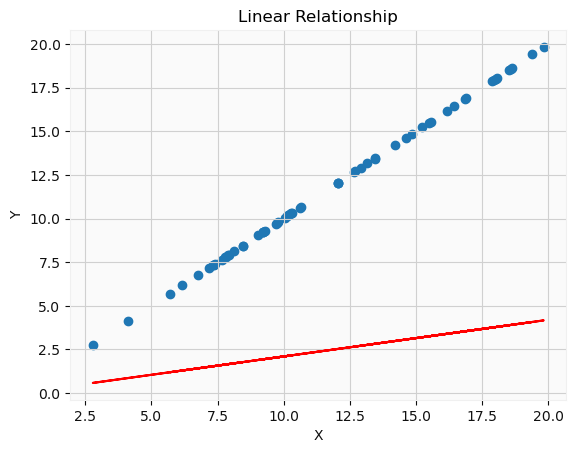

In [100]:
linear_points = coefficient * st_sl_ratio.values
import matplotlib.pyplot as plt

plt.scatter(st_sl_ratio.values, st_sl_ratio.values)  # Original values
plt.plot(st_sl_ratio.values, linear_points, color='red')  # Predicted values
plt.xlabel('X')  
plt.ylabel('Y') 
plt.title('Linear Relationship')  
plt.show()


In [ ]:
# Add ID coulmn
breakout_models_with_results.insert(0, 'ID', range(0, len(breakout_models_with_results)))

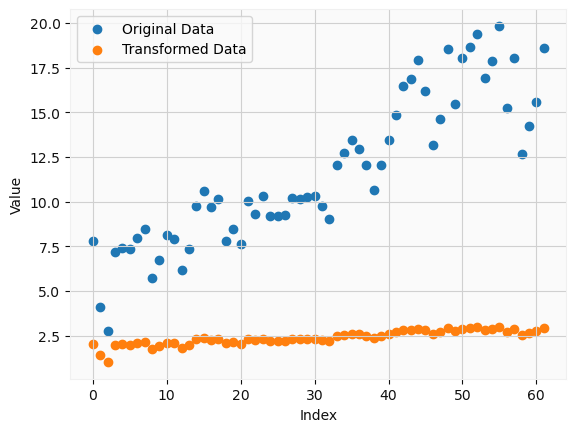

In [101]:
# Apply logarithmic transformation
transformed_data = np.log(st_sl_ratio.values)

# Plot original and transformed data
plt.scatter(np.arange(len(st_sl_ratio.values)), st_sl_ratio.values, label='Original Data')
plt.scatter(np.arange(len(transformed_data)), transformed_data, label='Transformed Data')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.show()

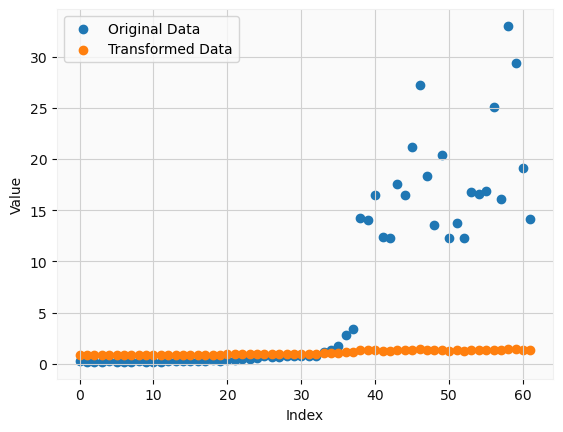

In [601]:
# Apply logarithmic transformation
transformed_data = np.sqrt(st_sl_ratio.values)

transformed_data = np.exp(st_sl_ratio.values)

transformed_data = 1 / st_sl_ratio.values

p = 0.1

transformed_data = np.power(st_sl_ratio.values, p)


# Plot original and transformed data
plt.scatter(np.arange(len(st_sl_ratio.values)), st_sl_ratio.values, label='Original Data')
plt.scatter(np.arange(len(transformed_data)), transformed_data, label='Transformed Data')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.show()

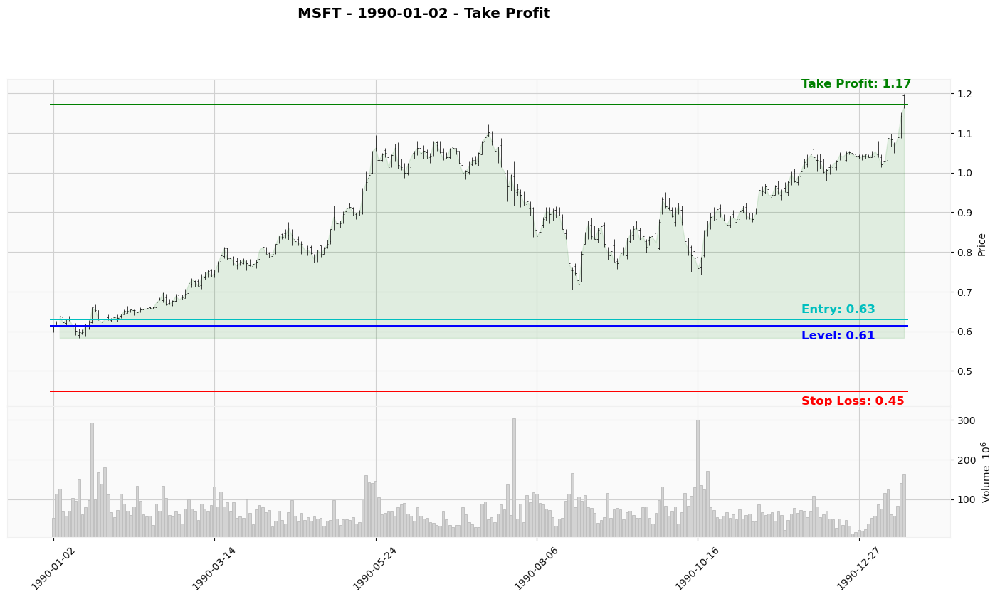

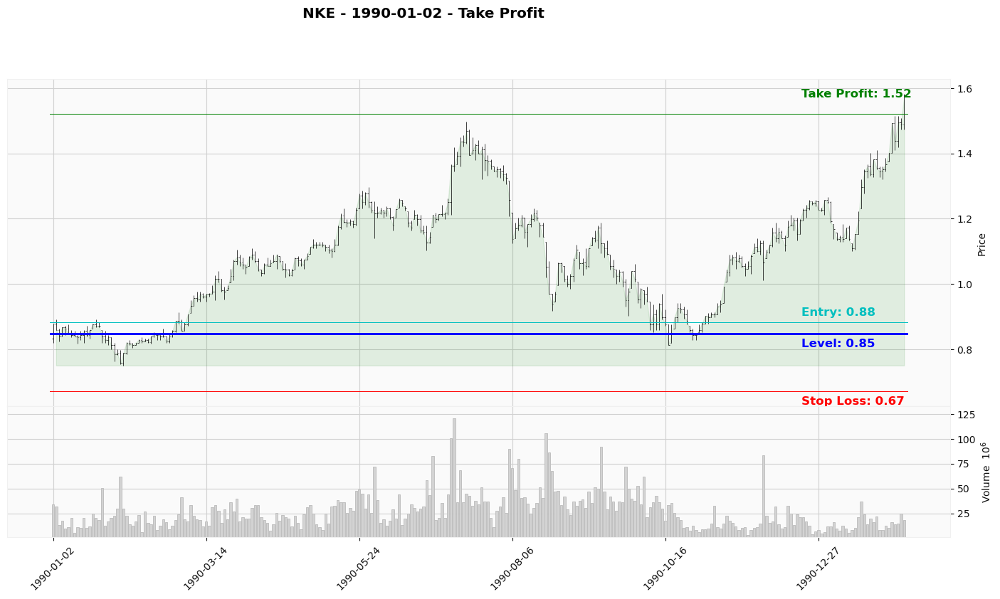

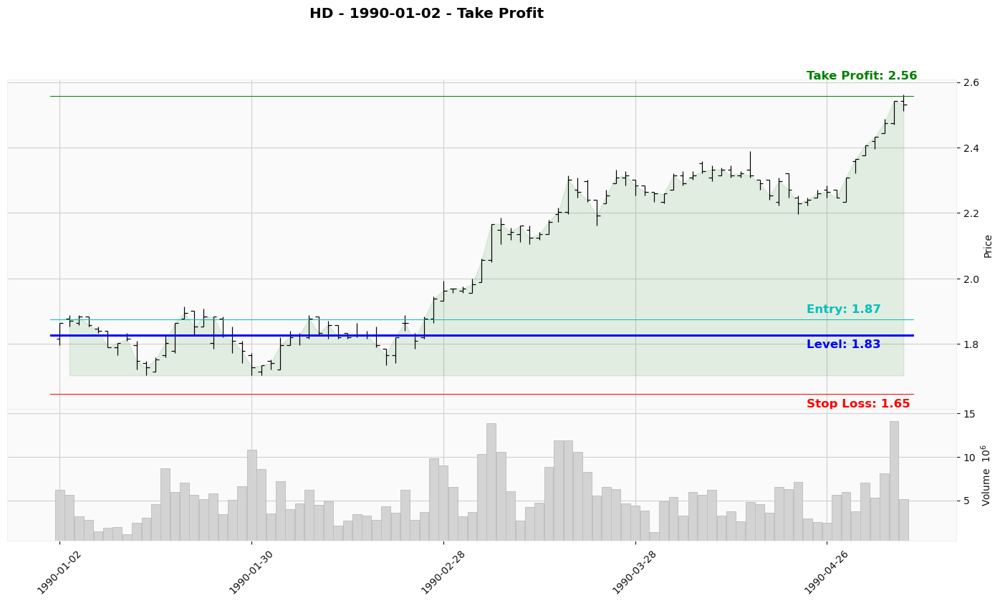

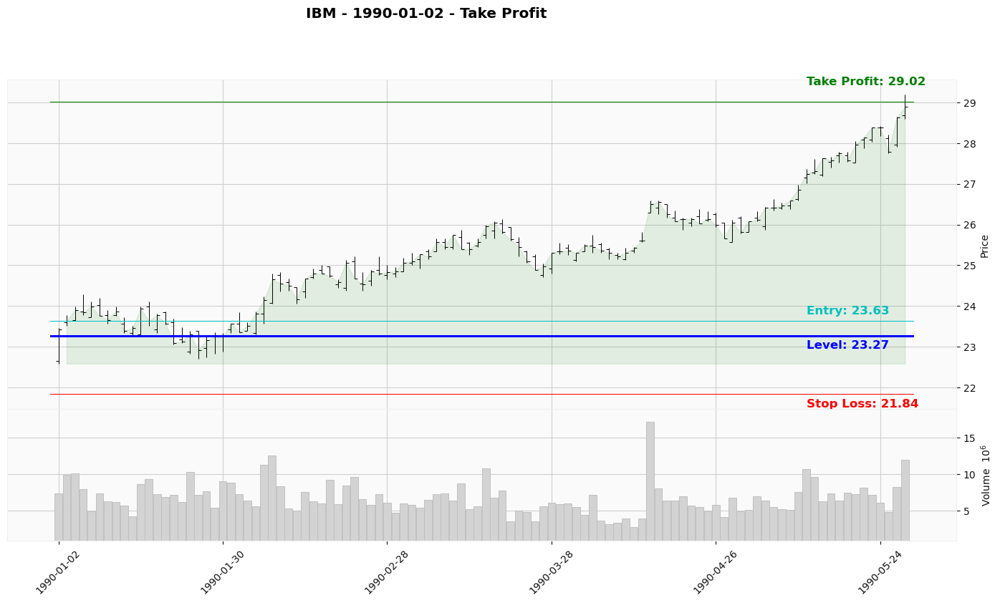

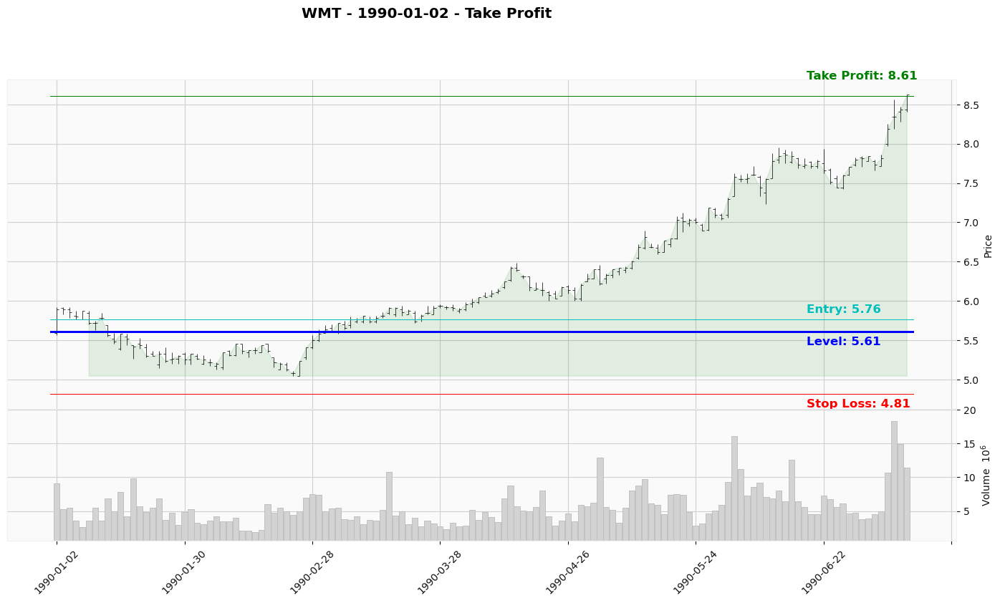

...

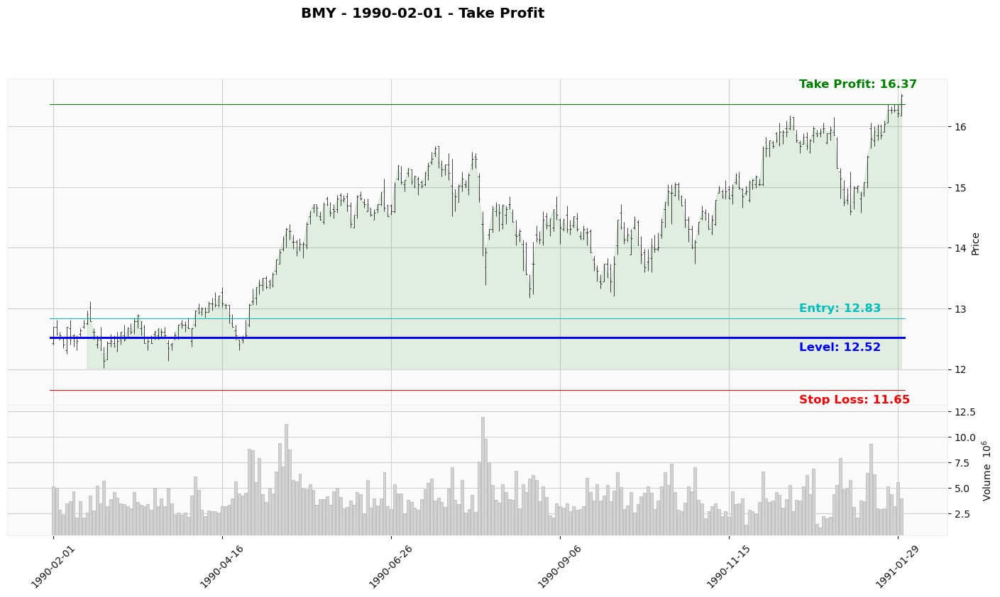

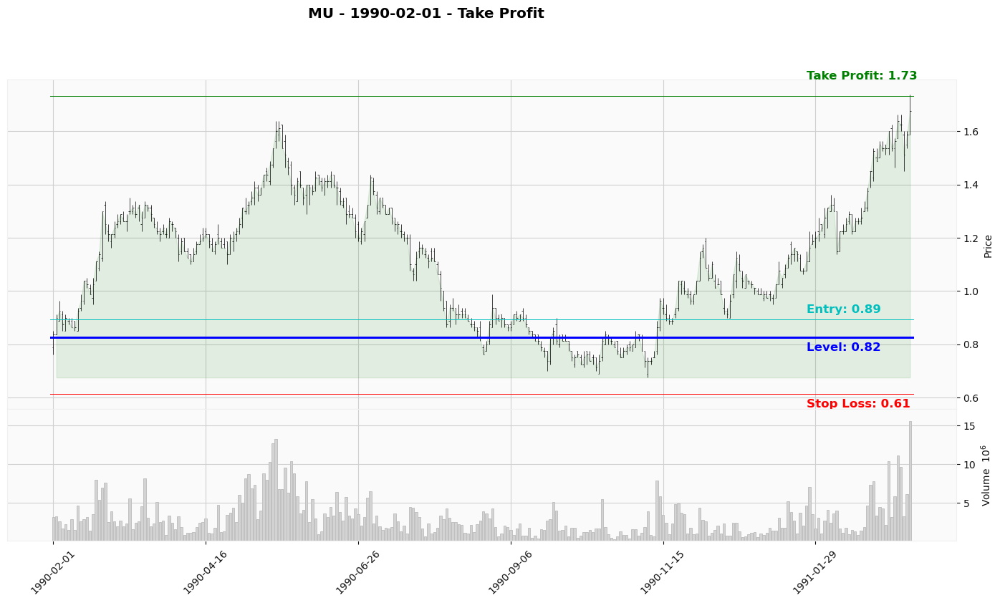

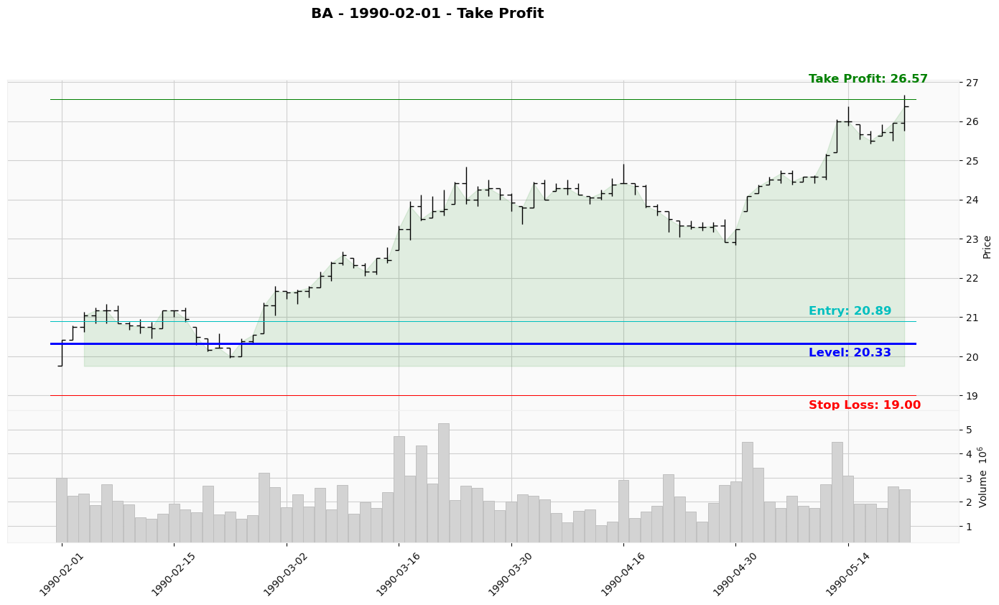

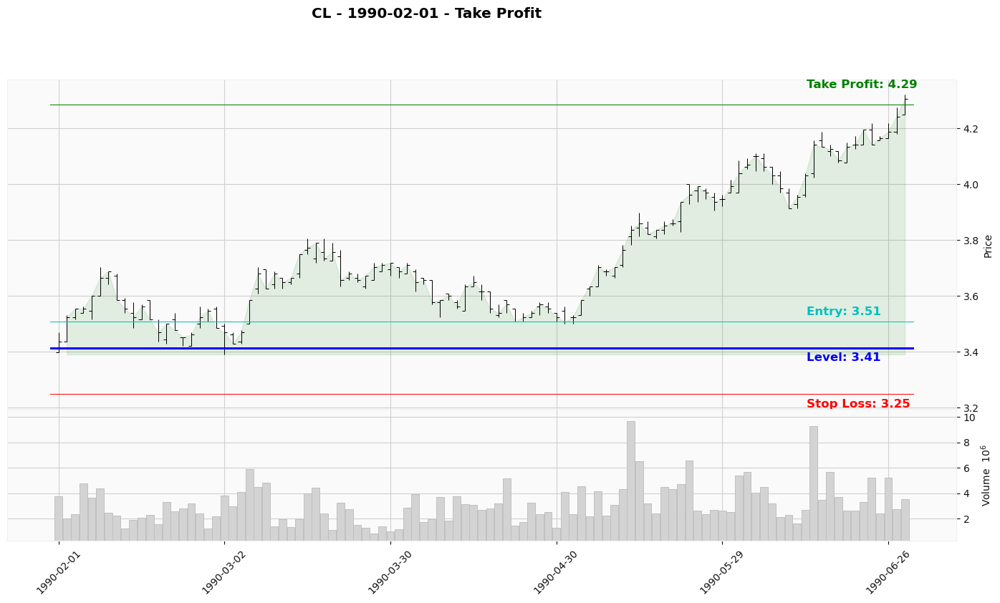

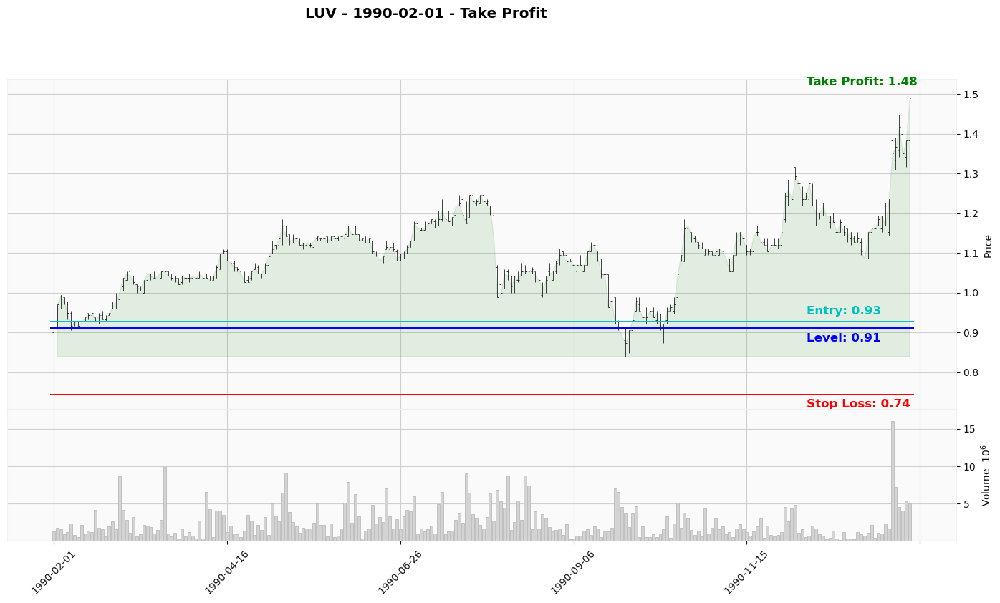

In [533]:
from pandas.tseries.offsets import *

# Set the start date for printing
plot_period_start = '1990-01-01'
plot_period_end = '1990-02-01'


# Set the number of days to include in the past and future for printing
print_days_in_past = 0
print_days_in_future = 0

# Define column names
tp = "Takeprofit_3/1_Triggered"  # Take Profit column
sl = "Stoploss_3/1_Triggered"  # Stop Loss column
tp_date = "Takeprofit_3/1_Date"  # Take Profit date column
sl_date = "Stoploss_3/1_Date"  # Stop Loss date column
tp_price = tp.replace('Triggered', 'Price')  # Take Profit price column

# Select the relevant data for printing based on the start date
df_print = overall_df_big[(overall_df_big.index >= plot_period_start) & (overall_df_big.index <= plot_period_end)]
df_print.insert(0, 'ID', range(0, len(df_print)))

# Iterate over each unique row in the breakout_models_with_results DataFrame
for (uniquerow), group in df_print.groupby(df_print["ID"]):
    symbol = group["Symbol"][0]  # Get the symbol for the current group
    
    df_1d = pd.read_csv("/home/jj/anaconda3/envs/stocks/Database/1D/1900-2023/" + symbol + '.csv', index_col='Unnamed: 0')          
    df_1d.index = df_1d.index.astype('datetime64[ns]')
    df_1d.index = df_1d.index.rename('Date')

    # Plotting Profit Trades
    if group[tp][0] != 0:  # Check if Take Profit is triggered
        status = "Take Profit"
        group.loc[group.index[0], tp_date] = pd.Timestamp(group.loc[group.index[0], tp_date])  # Convert Take Profit date to Timestamp
        print_df_1d = df_1d[group.index[0] - BDay(print_days_in_past):group[tp_date][0] + BDay(print_days_in_future)]
        # Select the relevant data for plotting based on the dates
        dates_df = pd.DataFrame(print_df_1d.index)
        buy_date = pd.Timestamp(group["Entry_Point_Date"][0]).normalize()  # Normalize the Entry Point date
        sell_date = pd.Timestamp(group[tp_date][0]).normalize()  # Normalize the Take Profit date
        where_values = pd.notnull(dates_df[(dates_df >= buy_date) & (dates_df <= sell_date)])['Date'].values
        # Get the values for plotting the fill_between area
        y1values = print_df_1d["close"].values
        y2value = print_df_1d['low'].min()
        level = group.iloc[0]["Level_Price"]

        # Generate the plot for profit trades
        fig, axlist = mpf.plot(
            print_df_1d,
            volume=True,
            hlines=dict(
                hlines=[group.iloc[0]["Level_Price"], group.iloc[0]["Entry_Price"], group.iloc[0]["Stoploss_Price"], group.iloc[0][tp_price]],
                colors=["b", "c", "r", "g"],
                linestyle=["-", "-", "-"],
                linewidths=[1, 0.7, 0.7, 0.7]  # Specify the linewidths for each horizontal line
            ),
            title=f"{symbol} - {group.iloc[0].name.date()} - {status} ",
            fill_between=dict(y1=y1values, y2=y2value, where=where_values, alpha=0.1, color='g'),
            datetime_format='%Y-%m-%d',
            figratio=(10, 5),
            figscale=1.6,
            style=custom_style,  # Apply the customized style
            returnfig=True,
        )

        # Add annotations for horizontal lines
        ax = axlist[0]
        ax.annotate(
            f"Stop Loss: {group.iloc[0]['Stoploss_Price']:.2f}",
            xy=(1, group.iloc[0]['Stoploss_Price']),
            xycoords=('axes fraction', 'data'),
            xytext=(-150, -10),
            textcoords='offset points',
            ha='left',
            va='center',
            fontsize=12,
            fontweight='bold',
            color='r'
        )

        # Add annotations for horizontal lines
        ax.annotate(
            f"Level: {group.iloc[0]['Level_Price']:.2f}",
            xy=(1, group.iloc[0]['Level_Price']),
            xycoords=('axes fraction', 'data'),
            xytext=(-150, -10),
            textcoords='offset points',
            ha='left',
            va='center',
            fontsize=12,
            fontweight='bold',
            color='b'
        )

        # Add annotations for horizontal lines
        ax.annotate(
            f"Entry: {group.iloc[0]['Entry_Price']:.2f}",
            xy=(1, group.iloc[0]['Entry_Price']),
            xycoords=('axes fraction', 'data'),
            xytext=(-150, 10),
            textcoords='offset points',
            ha='left',
            va='center',
            fontsize=12,
            fontweight='bold',
            color='c'
        )

        # Add annotations for horizontal lines
        ax.annotate(
            f"Take Profit: {group.iloc[0][tp_price]:.2f}",
            xy=(1, group.iloc[0][tp_price]),
            xycoords=('axes fraction', 'data'),
            xytext=(-150, 20),
            textcoords='offset points',
            ha='left',
            va='center',
            fontsize=12,
            fontweight='bold',
            color='g'
        )

        plt.show()
        
#     # Plotting Negative Trades
#     if group[sl][0] != 0:  # Check if Stop Loss is triggered
#         status = "Stop Loss"
#         group.loc[group.index[0], sl_date] = pd.Timestamp(group.loc[group.index[0], sl_date])  # Convert Stop Loss date to Timestamp
#         print_df_1d = jpm_df[group.index[0] - BDay(15):group[sl_date][0] + BDay(0)]
#         # Select the relevant data for plotting based on the dates
#         dates_df = pd.DataFrame(print_df_1d.index)
#         buy_date = pd.Timestamp(group["Entry_Point_Date"][0]).normalize()  # Normalize the Entry Point date
#         sell_date = pd.Timestamp(group[sl_date][0]).normalize()  # Normalize the Stop Loss date
#         where_values = pd.notnull(dates_df[(dates_df >= buy_date) & (dates_df <= sell_date)])['Date'].values
#         # Get the values for plotting the fill_between area
#         y1values = print_df_1d["close"].values
#         y2value = print_df_1d['low'].min()
#         level = group.iloc[0]["Level_Price"]

#         # Generate the plot for negative trades
#         fig, axlist = mpf.plot(
#             print_df_1d,
#             volume=True,
#             hlines=dict(
#                 hlines=[group.iloc[0]["Level_Price"], group.iloc[0]["Entry_Price"], group.iloc[0]["Stoploss_Price"]],
#                 colors=["b", "c", "r"],
#                 linestyle=["-", "-", "-"],
#                 linewidths=[1, 0.7, 0.7]  # Specify the linewidths for each horizontal line
#             ),
#             title=f"{symbol} - {group.iloc[0].name.date()} - {status} ",
#             fill_between=dict(y1=y1values, y2=y2value, where=where_values, alpha=0.1, color='r'),
#             datetime_format='%Y-%m-%d',
#             figratio=(10, 5),
#             figscale=1.6,
#             style=custom_style,  # Apply the customized style
#             returnfig=True,
#         )

#         # Add annotations for horizontal lines
#         ax = axlist[0]
#         ax.annotate(
#             f"Stop Loss: {group.iloc[0]['Stoploss_Price']:.2f}",
#             xy=(1, group.iloc[0]['Stoploss_Price']),
#             xycoords=('axes fraction', 'data'),
#             xytext=(-150, -10),
#             textcoords='offset points',
#             ha='left',
#             va='center',
#             fontsize=12,
#             fontweight='bold',
#             color='r'
#         )

#         ax.annotate(
#             f"Level: {group.iloc[0]['Level_Price']:.2f}",
#             xy=(1, group.iloc[0]['Level_Price']),
#             xycoords=('axes fraction', 'data'),
#             xytext=(-150, -10),
#             textcoords='offset points',
#             ha='left',
#             va='center',
#             fontsize=12,
#             fontweight='bold',
#             color='b'
#         )

#         ax.annotate(
#             f"Entry: {group.iloc[0]['Entry_Price']:.2f}",
#             xy=(1, group.iloc[0]['Entry_Price']),
#             xycoords=('axes fraction', 'data'),
#             xytext=(-150, 10),
#             textcoords='offset points',
#             ha='left',
#             va='center',
#             fontsize=12,
#             fontweight='bold',
#             color='c'
#         )

plt.show();  # Show the plots


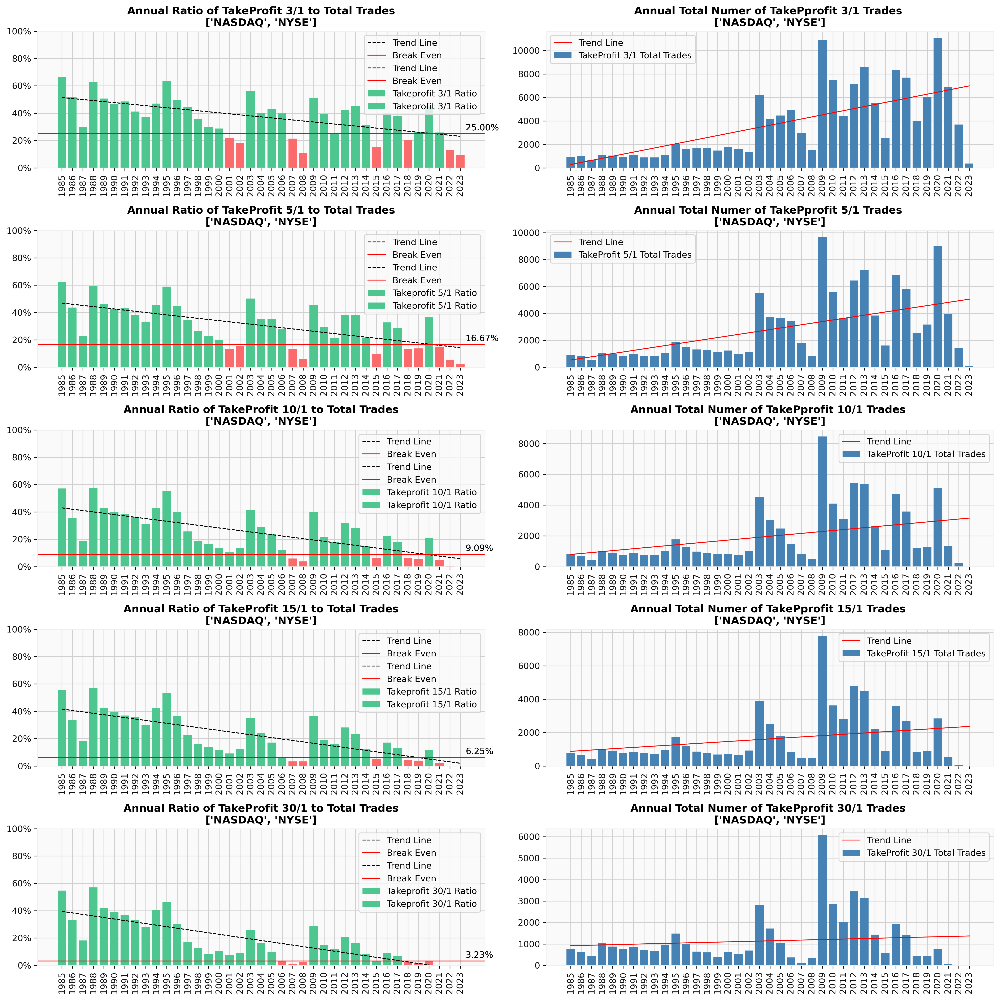

In [15]:
df_plot = overall_df_big

risk_ratios = [3, 5, 10, 15, 30]

exchange = ['NASDAQ', 'NYSE']

start_year = 1985

plot_annual_ratios(overall_df_big, risk_ratios, start_year)

## 3. Modeling

In [16]:
def target(risk_ratio):
    """
    Determine the target-related strings based on the given risk ratio.

    Arguments:
    - risk_ratio: Risk ratio to determine the target strings.

    Returns:
    - tp: Takeprofit column name corresponding to the risk ratio.
    - sl: Stoploss column name corresponding to the risk ratio.
    - tp_date: Takeprofit date column name corresponding to the risk ratio.
    - sl_date: Stoploss date column name corresponding to the risk ratio.
    """

    # Initialize variables
    tp = ""
    sl = ""
    tp_date = ""
    sl_date = ""

    # Determine the target strings based on the risk ratio
    if risk_ratio == 3:
        tp = "Takeprofit_3/1_Triggered"
        sl = "Stoploss_3/1_Triggered"
        tp_date = "Takeprofit_3/1_Date"
        sl_date = "Stoploss_3/1_Date"
    elif risk_ratio == 5:
        tp = "Takeprofit_5/1_Triggered"
        sl = "Stoploss_5/1_Triggered"
        tp_date = "Takeprofit_5/1_Date"
        sl_date = "Stoploss_5/1_Date"
    elif risk_ratio == 10:
        tp = "Takeprofit_10/1_Triggered"
        sl = "Stoploss_10/1_Triggered"
        tp_date = "Takeprofit_10/1_Date"
        sl_date = "Stoploss_10/1_Date"
    elif risk_ratio == 15:
        tp = "Takeprofit_15/1_Triggered"
        sl = "Stoploss_15/1_Triggered"
        tp_date = "Takeprofit_15/1_Date"
        sl_date = "Stoploss_15/1_Date"
    elif risk_ratio == 20:
        tp = "Takeprofit_20/1_Triggered"
        sl = "Stoploss_20/1_Triggered"
        tp_date = "Takeprofit_20/1_Date"
        sl_date = "Stoploss_20/1_Date"
    elif risk_ratio == 30:
        tp = "Takeprofit_30/1_Triggered"
        sl = "Stoploss_30/1_Triggered"
        tp_date = "Takeprofit_30/1_Date"
        sl_date = "Stoploss_30/1_Date"

    # Return the target strings
    return tp, sl, tp_date, sl_date

    
def make_50x50(df):
    """
    Balances the dataset by randomly sampling a subset of the larger class to achieve a 50-50 ratio.
    
    Args:
        df (DataFrame): The input dataframe containing the dataset.
    
    Returns:
        DataFrame: The balanced dataset.
    """
    
    # Separate the dataset into two classes based on the target variable
    df_class_A = df[df[tp] == 1]
    df_class_B = df[df[tp] == 0]
    
    # Get the sizes of the two classes
    size_class_A = df_class_A.shape[0]
    size_class_B = df_class_B.shape[0]
    
    # Randomly sample a subset of the larger class dataframe to balance the ratio
    if size_class_A > size_class_B:
        df_class_A = df_class_A.sample(size_class_B, random_state=42)
    else:
        df_class_B = df_class_B.sample(size_class_A, random_state=42)
    
    # Concatenate the two balanced class dataframes
    df_50x50 = pd.concat([df_class_A, df_class_B])
    
    # Shuffle the rows of the concatenated dataframe
    df_50x50 = df_50x50.sample(frac=1, random_state=42)
    
    return df_50x50


def make_train(df, train_period_start, train_period_end, test_period_start):
    """
    Prepares the training dataset by applying filters and balancing classes.
    
    Args:
        df (DataFrame): The input dataframe containing the raw data.
        train_period_start (str): The start date of the training period.
        train_period_end (str): The end date of the training period.
        test_period_start (str): The start date of the testing period.
    
    Returns:
        DataFrame: The processed training dataset.
    """
    
    # Filter data based on date range
    df_train = df[df.index >= train_period_start]
    df_train = df_train[df_train.index < train_period_end]
    df_train = df_train[df_train[tp_date] < str(test_period_start)]
    df_train = df_train[df_train[sl_date] < str(test_period_start)]
    
    # Filter data based on type and exchange
    df_train = df_train[df_train['Type'] == 'stock']
    df_train = df_train[df_train['Exchange'].isin(['NYSE'])]
    df_train = df_train[df_train['Level_Age'] >= 4]
    
    # Balance classes
    df_train = make_50x50(df_train)
        
    return df_train

def make_test(df, test_period_start, test_period_end):
    """
    Prepares the testing dataset by applying filters to select the relevant data.
    
    Args:
        df (DataFrame): The input dataframe containing the raw data.
        test_period_start (str): The start date of the testing period.
        test_period_end (str): The end date of the testing period.
    
    Returns:
        DataFrame: The processed testing dataset.
    """
    
    # Filter data based on date range
    df_test = df[df.index >= test_period_start]
    df_test = df_test[df_test.index < test_period_end]
    df_test = df_test[df_test['Type'] == 'stock']
    df_test = df_test[df_test['Exchange'].isin(['NYSE', 'NASDAQ'])]    
    
    return df_test


In [17]:
import numpy as np

def clf_predictions(
    df, train_period_start, train_period_end, test_period_start, 
    drop_list, tp, n_estimators, max_depth, random_state, criterion, 
    min_samples_leaf, verbose, class_weight, min_samples_split
):
    """
    Perform classification using a Random Forest Classifier.

    Arguments:
    - df: DataFrame containing the input dataset.
    - train_period_start: Start date of the training period.
    - train_period_end: End date of the training period.
    - test_period_start: Start date of the testing period.
    - drop_list: List of columns to drop from the dataset.
    - tp: Target variable column name.
    - n_estimators: Number of trees in the random forest.
    - max_depth: Maximum depth of each tree.
    - random_state: Seed for random number generation.
    - criterion: The function to measure the quality of a split.
    - min_samples_leaf: Minimum number of samples required to be at a leaf node.
    - verbose: Verbosity level for logging.
    - class_weight: Weights associated with classes for imbalanced data.
    - min_samples_split: Minimum number of samples required to split an internal node.

    Returns:
    - y_probs: Predicted probabilities for each class.
    - y_preds: Predicted class labels.
    - y_test: True class labels.
    - clf: Trained classifier.
    - X_train: Training data features.
    - y_train: Training data target variable.
    - X_test: Testing data features.
    - y_test: Testing data target variable.
    - y_probs_positive: Predicted probabilities for the positive class.
    - y_probs_negative: Predicted probabilities for the negative class.
    
    """
    
    # Prepare the dataset for modeling
    df_X = make_train(df, train_period_start, train_period_end, test_period_start)

    # Prepare the feature matrix (X) and the target variable (y)
    X = df_X.drop(drop_list, axis=1)
    y = df_X[tp]
    
    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=0, shuffle=True)
    
    # Uncomment the following lines if feature scaling is required
    # scaler = StandardScaler()
    # X_train = scaler.fit_transform(X_train)
    # X_test = scaler.transform(X_test)
    
    # Instantiate a Random Forest Classifier with specified parameters
    clf = RandomForestClassifier(
        n_estimators=n_estimators, 
        max_depth=max_depth,
        random_state=random_state, 
        n_jobs=-1,
        criterion=criterion,
        min_samples_leaf=min_samples_leaf,
        verbose=verbose,
        class_weight=class_weight,
        min_samples_split=min_samples_split
    )
    
    # Fit the classifier to the training data
    clf.fit(X_train, y_train)
    
    # Obtain feature importance scores
    feature_importance = clf.feature_importances_
    
    # Sort feature importance scores and get sorted indices
    sorted_indices = np.argsort(feature_importance)[::-1]
    
    # Get feature names in descending order of importance
    feature_names = X.columns[sorted_indices]
    
    # Make predictions on the test set using the classifier
    y_preds = clf.predict(X_test)

    # Calculate the predicted probabilities of the positive class using the classifier
    y_probs = clf.predict_proba(X_test)
    y_probs_positive = y_probs[:, 1]
    y_probs_negative = y_probs[:, 0]
    
    # Return the predicted probabilities, predicted values, true values, classifier, training data, test data,
    # positive probabilities, negative probabilities, length of the training data, and feature names
    return (
        y_probs, y_preds, y_test, clf, X_train, y_train, X_test, y_test, 
        y_probs_positive, y_probs_negative
    )


In [18]:
from sklearn.metrics import f1_score, recall_score, precision_score, roc_auc_score, confusion_matrix, roc_curve, precision_recall_curve, auc, ConfusionMatrixDisplay

def model_evaluation(df_test, df_train, y_test, y_preds, y_probs_positive, X_train, y_train, new_threshold, show_evaluation):
    """
    This function evaluates a model by displaying evaluation metrics and plots. Metrics calculated include accuracy, precision, 
    recall, F1 score, ROC AUC, PR AUC, and specificity (True Negative Rate). Plots generated include the ROC curve, 
    Precision-Recall curve, and the confusion matrix.

    Parameters:
    df_test (DataFrame): The test dataset.
    df_train (DataFrame): The training dataset.
    y_test (array-like): Actual labels of the test dataset.
    y_preds (array-like): Predicted labels by the model.
    y_probs_positive (array-like): Predicted probabilities for the positive class.
    X_train (array-like): Features of the training dataset.
    y_train (array-like): Labels of the training dataset.
    new_threshold (float): Threshold for predicting class labels based on probabilities.
    show_evaluation (bool, optional): If True, the function will print the evaluation metrics and plots. Default is True.

    Returns:
    A tuple containing the accuracy on the training data, accuracy on the test data, precision, recall, F1 score, ROC AUC, 
    PR AUC, and specificity (True Negative Rate). All values are expressed in percentages.
    """
    
    # Generate predicted classes by comparing predicted probabilities to new threshold
    y_preds = (y_probs[:, 1] >= new_threshold).astype(int)
    
    # Calculate metrics and create plots
    accuracy_train = round(clf.score(X_train, y_train) * 100, 2)  # Accuracy score on the training data
    accuracy_test = round(accuracy_score(y_test, y_preds) * 100, 2)  # Accuracy score on the testing data
    precision = round(precision_score(y_test, y_preds) * 100, 2)  # Precision score
    recall = round(recall_score(y_test, y_preds) * 100, 2)  # Recall score
    f1 = round(f1_score(y_test, y_preds) * 100, 2)  # F1 score
    test_proportion = len(df_test) / (len(df_test) + len(df_train)) * 100  # Proportion of testing data
    train_proportion = len(df_train) / (len(df_test) + len(df_train)) * 100  # Proportion of training data

    precision_list, recall_list, thresholds = precision_recall_curve(y_test == 1, y_probs_positive)  # Get precision, recall, and thresholds
    auc_pr = auc(recall_list, precision_list)  # Area under the precision-recall curve
    
    # Calculate ROC curve and AUC
    fpr, tpr, thresholds = roc_curve(y_test, y_probs_positive)
    roc_auc = roc_auc_score(y_test, y_probs_positive)
    
    # Create confusion matrix display
    cm_normalized = confusion_matrix(y_test, y_preds, normalize='pred')
    cm_normalized_display = ConfusionMatrixDisplay(cm_normalized)
    cm = confusion_matrix(y_test, y_preds)
    cm_display = ConfusionMatrixDisplay(cm)

    # Calculate specificity (also known as True Negative Rate)
    tn, fp, fn, tp = confusion_matrix(y_test, y_preds).ravel()
    specificity = tn / (tn+fp) * 100

    if show_evaluation:
        print(f"Accuracy score (train): {accuracy_train:.2f}%")
        print(f"Accuracy score (test): {accuracy_test:.2f}%")
        print(f"Precision score: {precision:.2f}%")
        print(f"Recall (True Positive Rate): {recall:.2f}%")
        print(f"Specificity (True Negative Rate): {specificity:.2f}%")
        print(f"F1 score: {f1:.2f}%")
        print(f"Training data size: {len(df_train):,}")
        print(f"Testing data size: {len(df_test):,}")
        print(f"Test/Train ratio: {len(df_test):,}/{len(df_train):,} ({test_proportion:.2f}%/{train_proportion:.2f}%)")
        print(f"ROC AUC: {roc_auc:.3f}")
        print(f"PR AUC: {auc_pr:.3f}")    
        

        # Plot ROC curve, precision-recall curve, and confusion matrix in the same figure
        fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(nrows=2, ncols=2, figsize=(12, 12), dpi=300)

        ax1.plot(fpr, tpr, label='ROC curve (AUC = {:.3f})'.format(roc_auc))
        ax1.set_xlabel('False Positive Rate')
        ax1.set_ylabel('True Positive Rate')
        ax1.set_title('Receiver Operating Characteristic (ROC) Curve')
        ax1.legend(loc='best')
        ax1.grid(visible=True)
        ax1.set_axisbelow(True)

        ax2.plot(recall_list, precision_list, label='AUC-PR = {:.3f}'.format(auc_pr))
        ax2.set_xlabel('Recall')
        ax2.set_ylabel('Precision')
        ax2.set_title('Precision-Recall Curve')
        ax2.legend(loc='best')
        ax2.grid(visible=True)
        ax2.set_axisbelow(True)

        cm_normalized_display.plot(ax=ax3, cmap='Blues')
        ax3.set_xlabel('Predicted label')
        ax3.set_ylabel('True label')
        ax3.set_title('Confusion Matrix Normalized')
        ax3.grid(visible=False)

        cm_display.plot(ax=ax4, cmap='Blues')
        ax4.set_xlabel('Predicted label')
        ax4.set_ylabel('True label')
        ax4.set_title('Confusion Matrix')
        ax4.grid(visible=False)
        plt.tight_layout()  # Adjust spacing between subplots

        plt.show();

    return accuracy_train, accuracy_test, precision, recall, f1, roc_auc, auc_pr, specificity

def update_evaluation_metrics(df_test_unseen, X_train, y_test, y_preds, y_probs_positive, y_train, new_threshold, test_year, evaluation_metrics):
    """
    This function updates the evaluation metrics for a machine learning model. It computes several metrics such as 
    accuracy, precision, recall, f1-score, ROC AUC score, PR AUC score, and specificity, for each test year. 
    These metrics are then aggregated to provide average performance over all the test years.
    
    Parameters:
    df_test_unseen (DataFrame): The unseen test data.
    X_train (DataFrame): The training feature data.
    y_test (Series): The true labels for the test data.
    y_preds (ndarray): The predicted labels for the test data.
    y_probs_positive (ndarray): The predicted probabilities of the positive class.
    y_train (Series): The true labels for the train data.
    new_threshold (float): The threshold for classifying a prediction as positive.
    test_year (int): The year in which the test is being conducted.
    evaluation_metrics (list): A list of dictionaries containing metrics for each test year.

    Returns:
    DataFrame: A DataFrame containing the evaluation metrics for each test year and their averages.
    """

    # Calculate the evaluation metrics for the unseen test data
    unseen_evaluation_metrics = model_evaluation(df_test_unseen, X_train, y_test, y_preds, y_probs_positive, X_train, y_train, new_threshold, show_evaluation)
    
    # Store the calculated metrics in a dictionary
    metrics_dict = {
        'test_year': test_year,
        'accuracy(train)': unseen_evaluation_metrics[0],
        'accuracy(test)': unseen_evaluation_metrics[1],
        'precision': unseen_evaluation_metrics[2],
        'recall': unseen_evaluation_metrics[3],
        'f1': unseen_evaluation_metrics[4],
        'roc_auc': unseen_evaluation_metrics[5],
        'auc_pr': unseen_evaluation_metrics[6],
        'specificity': unseen_evaluation_metrics[7]
    }

    # Append the metrics dictionary to the list of evaluation metrics
    evaluation_metrics.append(metrics_dict)

    # Convert the list of evaluation metrics into a DataFrame
    evaluation_df = pd.DataFrame(evaluation_metrics)
    
    # Set 'test_year' as the index of the DataFrame
    evaluation_df.set_index('test_year', inplace=True)
    
    # Compute the mean of each metric across all test years (ignoring the 'Aggregate' row, if present)
    aggregate_metrics = evaluation_df.drop('Aggregate', errors='ignore').mean().to_dict()  
    
    # Convert the aggregate metrics into a DataFrame with 'Average' as the index
    aggregate_df = pd.DataFrame([aggregate_metrics], index=['Average'])
    
    # Append the aggregate metrics DataFrame to the original evaluation DataFrame
    evaluation_df = pd.concat([evaluation_df, aggregate_df])
    
    # Return the updated evaluation DataFrame
    return evaluation_df

def plot_evaluation_metrics(evaluation_df):
    """
    This function plots the model's evaluation metrics over the years. Two graphs are generated: one for 'roc_auc' and 
    'auc_pr', and another for all the remaining metrics.

    Parameters:
    evaluation_df (DataFrame): A DataFrame containing the evaluation metrics for each test year and their averages.

    Returns:
    None. Displays the plots.
    """

    # Exclude the last row (which contains averages) for the purpose of plotting
    evaluation_df = evaluation_df.iloc[:-1]

    # Create a list of years for the x-axis
    years = evaluation_df.index
    
    # Create two groups of metrics to be plotted in separate graphs
    group1_metrics = ['roc_auc', 'auc_pr']
    group2_metrics = [col for col in evaluation_df.columns if col not in group1_metrics]

    # Initialize a figure with two subplots
    fig, axs = plt.subplots(2, figsize=(12, 12), dpi=300)

    # Plot the metrics in the first group ('roc_auc' and 'auc_pr')
    for metric in group1_metrics:
        values = evaluation_df[metric]
        axs[0].plot(years, values, label=metric, marker='o')
    axs[0].set_xlabel('Year')
    axs[0].set_ylabel('Metric (%)')
    axs[0].set_title('roc_auc and auc_pr Over Years')
    axs[0].legend(bbox_to_anchor=(1, 1), loc='upper left')
    axs[0].grid(visible=True)
    axs[0].set_xticks(years.astype(int))
    axs[0].set_xticklabels(years.astype(int), rotation=90)

    # Plot the metrics in the second group (all remaining metrics)
    for metric in group2_metrics:
        values = evaluation_df[metric]
        axs[1].plot(years, values, label=metric, marker='o')
    axs[1].set_xlabel('Year')
    axs[1].set_ylabel('Metric (%)')
    axs[1].set_title('Other Metrics Over Years')
    axs[1].legend(bbox_to_anchor=(1, 1), loc='upper left')
    axs[1].grid(visible=True)
    axs[1].set_xticks(years.astype(int))
    axs[1].set_xticklabels(years.astype(int), rotation=90)

    # Adjust the spacing between the plots and display them
    plt.tight_layout()
    plt.show();


In [54]:
def get_annual_report(df_preds_overall):
    df_preds_overall_class1 = df_preds_overall.loc[
        (df_preds_overall['Preds'] == 1) & 
        (df_preds_overall['Entry_Point_Triggered'] == 1) &
        ((df_preds_overall['Takeprofit_3/1_Triggered'] == 1) | 
         (df_preds_overall['Stoploss_3/1_Triggered'] == 1))
    ]
    
    annual_ml_trades = df_preds_overall_class1.groupby(df_preds_overall_class1.index.year)['Entry_Point_Triggered'].sum()
    annual_ml_profit_trades = df_preds_overall_class1.groupby(df_preds_overall_class1.index.year)['Takeprofit_3/1_Triggered'].sum()
#     annual_ml_loss_trades = df_preds_overall_class1.groupby(df_preds_overall_class1.index.year)['Stoploss_3/1_Triggered'].sum()
    annual_ml_profit_ratio = annual_ml_profit_trades / annual_ml_trades * 100

    annual_nonml_trades = df_preds_overall.groupby(df_preds_overall.index.year)['Entry_Point_Triggered'].sum()
    annual_nonml_profit_trades = df_preds_overall.groupby(df_preds_overall.index.year)['Takeprofit_3/1_Triggered'].sum()
    annual_nonml_loss_trades = df_preds_overall.groupby(df_preds_overall.index.year)['Stoploss_3/1_Triggered'].sum()
    annual_nonml_profit_ratio = annual_nonml_profit_trades / annual_nonml_trades * 100

    improvement = annual_ml_profit_ratio - annual_nonml_profit_ratio

    data = {
        'ML Trades': annual_ml_trades,
#         'ML Loss Trades': annual_ml_loss_trades,
        'ML Profit Ratio': annual_ml_profit_ratio,
        'Non-ML Trades': annual_nonml_trades,
        'Non-ML Profit Ratio': annual_nonml_profit_ratio,
        'Profit Ratio Improvement': improvement
    }
    
    # Add overall row
    overall_row = {
        'ML Trades': annual_ml_trades.sum(),
#         'ML Loss Trades': annual_ml_loss_trades.sum(),
        'ML Profit Ratio': annual_ml_profit_ratio.mean(),
        'Non-ML Trades': annual_nonml_trades.sum(),
        'Non-ML Profit Ratio': annual_nonml_profit_ratio.mean(),
        'Profit Ratio Improvement': improvement.mean()
    }
    annual_report = pd.DataFrame(data)

    # Add overall row
    overall_row = pd.DataFrame(overall_row, index=['Total'])
    annual_report = pd.concat([annual_report, overall_row])
    
    # Calculate the number of trades without results(ucompleted trades)
    df_preds_overall_class1_no_results = df_preds_overall.loc[
        (df_preds_overall['Preds'] == 1) & 
        (df_preds_overall['Entry_Point_Triggered'] == 1) &
        (df_preds_overall['Takeprofit_3/1_Triggered'] == 0) & 
        (df_preds_overall['Stoploss_3/1_Triggered'] == 0)
    ]
    
    # Print report about non results trades
    if not df_preds_overall_class1_no_results.empty:
        print('Opened Trades Without Completion: ', len(df_preds_overall_class1_no_results))

    return annual_report

In [57]:
drop_list = [
    
    'Symbol',
    'Type',
    'Exchange',
    'Entry_Point_Triggered',
    'Entry_Point_Date',
    'Entry_Point_Duration',
    'Entry_Point_Day_of_Week',
    'Entry_Point_Week',
    'Entry_Point_Month',
    'Stoploss_3/1_Triggered',
    'Stoploss_3/1_Date',
    'Stoploss_3/1_Duration',
    'Takeprofit_3/1_Triggered',
    'Takeprofit_3/1_Date',
    'Takeprofit_3/1_Duration',
    'Stoploss_5/1_Triggered',
    'Stoploss_5/1_Date',
    'Stoploss_5/1_Duration',
    'Takeprofit_5/1_Triggered',
    'Takeprofit_5/1_Date',
    'Takeprofit_5/1_Duration',
    'Stoploss_10/1_Triggered',
    'Stoploss_10/1_Date',
    'Stoploss_10/1_Duration',
    'Takeprofit_10/1_Triggered',
    'Takeprofit_10/1_Date',
    'Takeprofit_10/1_Duration',
    'Stoploss_15/1_Triggered',
    'Stoploss_15/1_Date',
    'Stoploss_15/1_Duration',
    'Takeprofit_15/1_Triggered',
    'Takeprofit_15/1_Date',
    'Takeprofit_15/1_Duration',
    'Stoploss_30/1_Triggered',
    'Stoploss_30/1_Date',
    'Stoploss_30/1_Duration',
    'Takeprofit_30/1_Triggered',
    'Takeprofit_30/1_Date',
    'Takeprofit_30/1_Duration',    
    'Level_Date',
    'Year',  
#     'Sqrt_Stoploss_Price',
    
#     'volume',
#     'close',
#     'open',
#     'high',
#     'low',
    'adjclose',
    
    'SMA_5',
    'STD_5',
    'Band1_5',
    'Band2_5',
    'Dist_From_Mean_5',
    'BB_5',
    'KAMA_5',
    'STOSHI_5',
    'MACD_5',
    'SMA_8',
    'STD_8',
    'Band1_8',
    'Band2_8',
    'Dist_From_Mean_8',
    'BB_8',
    'KAMA_8',
    'STOSHI_8',
    'MACD_8',
    'SMA_10',
    'STD_10',
    'Band1_10',
    'Band2_10',
    'Dist_From_Mean_10',
    'BB_10',
    'KAMA_10',
    'STOSHI_10',
    'MACD_10',
    'SMA_12',
    'STD_12',
    'Band1_12',
    'Band2_12',
    'Dist_From_Mean_12',
    'BB_12',
    'KAMA_12',
    'STOSHI_12',
    'MACD_12',
    'SMA_15',
    'STD_15',
    'Band1_15',
    'Band2_15',
    'Dist_From_Mean_15',
    'BB_15',
    'KAMA_15',
    'STOSHI_15',
    'MACD_15',
    'SMA_20',
    'STD_20',
    'Band1_20',
    'Band2_20',
    'Dist_From_Mean_20',
    'BB_20',
    'KAMA_20',
    'STOSHI_20',
    'MACD_20',
    'SMA_50',
    'STD_50',
    'Band1_50',
    'Band2_50',
    'Dist_From_Mean_50',
    'BB_50',
    'KAMA_50',
    'STOSHI_50',
    'MACD_50',
    'SMA_100',
    'STD_100',
    'Band1_100',
    'Band2_100',
    'Dist_From_Mean_100',
    'BB_100',
    'KAMA_100',
    'STOSHI_100',
    'MACD_100',
    'SMA_150',
    'STD_150',
    'Band1_150',
    'Band2_150',
    'Dist_From_Mean_150',
    'BB_150',
    'KAMA_150',
    'STOSHI_150',
    'MACD_150',
    'SMA_200',
    'STD_200',
    'Band1_200',
    'Band2_200',
    'Dist_From_Mean_200',
    'BB_200',
    'KAMA_200',
    'STOSHI_200',
    'MACD_200',
    'SMA_300',
    'STD_300',
    'Band1_300',
    'Band2_300',
    'Dist_From_Mean_300',
    'BB_300',
    'KAMA_300',
    'STOSHI_300',
    'MACD_300',
    'SMA_400',
    'STD_400',
    'Band1_400',
    'Band2_400',
    'Dist_From_Mean_400',
    'BB_400',
    'KAMA_400',
    'STOSHI_400',
    'MACD_400',
    'SMA_500',
    'STD_500',
    'Band1_500',
    'Band2_500',
    'Dist_From_Mean_500',
    'BB_500',
    'KAMA_500',
    'STOSHI_500',
    'MACD_500',
    
    'ROC',
    'HMA',
    'EOM',
    'Coppock_Curve',
    'Force_Index',
    'Gator_Upper',
    'Gator_Lower',
    'Pivot',
    'R1',
    'S1',
    'R2',
    'S2',
    'R3',
    'S3',
    'PPO',
    'PPO_Signal',
    'PPO_Histogram',
    'Bearish_Fractal',
    'Bullish_Fractal',
    'RVI',
    'TEMA',
    'DPO',
    'OBV',
    'MA_volume',
    'OBV_Ratio',
    'Ehlers_Fisher_Transform',
    'Fisher_Transform',
    'Balance_of_Power',
#     
#     'Level_Price',
#     'Level_Age',
    'Lookback_Period',
#     'ATR5',
#     'Spread',
#     'Entry_Price',
#     'Stoploss_Price',
#     'Takeprofit_3/1_Price',
#     'Takeprofit_5/1_Price',
#     'Takeprofit_10/1_Price',
#     'Takeprofit_15/1_Price',
#     'Takeprofit_30/1_Price',
    
    'Open_Delta',
    'High_Delta',
    'Close_Delta',
    'Low_Delta',
    'Model_Age',
    
#     'Financial_Growth_revenueGrowth',
#     'Financial_Growth_grossProfitGrowth',
#     'Financial_Growth_ebitgrowth',
#     'Financial_Growth_operatingIncomeGrowth',
#     'Financial_Growth_netIncomeGrowth',
#     'Financial_Growth_epsgrowth',
#     'Financial_Growth_epsdilutedGrowth',
#     'Financial_Growth_weightedAverageSharesGrowth',
#     'Financial_Growth_weightedAverageSharesDilutedGrowth',
#     'Financial_Growth_dividendsperShareGrowth',
#     'Financial_Growth_operatingCashFlowGrowth',
#     'Financial_Growth_freeCashFlowGrowth',
#     'Financial_Growth_tenYRevenueGrowthPerShare',
#     'Financial_Growth_fiveYRevenueGrowthPerShare',
#     'Financial_Growth_threeYRevenueGrowthPerShare',
#     'Financial_Growth_tenYOperatingCFGrowthPerShare',
#     'Financial_Growth_fiveYOperatingCFGrowthPerShare',
#     'Financial_Growth_threeYOperatingCFGrowthPerShare',
#     'Financial_Growth_tenYNetIncomeGrowthPerShare',
#     'Financial_Growth_fiveYNetIncomeGrowthPerShare',
#     'Financial_Growth_threeYNetIncomeGrowthPerShare',
#     'Financial_Growth_tenYShareholdersEquityGrowthPerShare',
#     'Financial_Growth_fiveYShareholdersEquityGrowthPerShare',
#     'Financial_Growth_threeYShareholdersEquityGrowthPerShare',
#     'Financial_Growth_tenYDividendperShareGrowthPerShare',
#     'Financial_Growth_fiveYDividendperShareGrowthPerShare',
#     'Financial_Growth_threeYDividendperShareGrowthPerShare',
#     'Financial_Growth_receivablesGrowth',
#     'Financial_Growth_inventoryGrowth',
#     'Financial_Growth_assetGrowth',
#     'Financial_Growth_bookValueperShareGrowth',
#     'Financial_Growth_debtGrowth',
#     'Financial_Growth_rdexpenseGrowth',
#     'Financial_Growth_sgaexpensesGrowth',
#     'Balance_Sheet_cashAndCashEquivalents',
#     'Balance_Sheet_shortTermInvestments',
#     'Balance_Sheet_cashAndShortTermInvestments',
#     'Balance_Sheet_netReceivables',
#     'Balance_Sheet_inventory',
#     'Balance_Sheet_otherCurrentAssets',
#     'Balance_Sheet_totalCurrentAssets',
#     'Balance_Sheet_propertyPlantEquipmentNet',
#     'Balance_Sheet_goodwill',
#     'Balance_Sheet_intangibleAssets',
#     'Balance_Sheet_goodwillAndIntangibleAssets',
#     'Balance_Sheet_longTermInvestments',
#     'Balance_Sheet_taxAssets',
#     'Balance_Sheet_otherNonCurrentAssets',
#     'Balance_Sheet_totalNonCurrentAssets',
#     'Balance_Sheet_otherAssets',
#     'Balance_Sheet_totalAssets',
#     'Balance_Sheet_accountPayables',
#     'Balance_Sheet_shortTermDebt',
#     'Balance_Sheet_taxPayables',
#     'Balance_Sheet_deferredRevenue',
#     'Balance_Sheet_otherCurrentLiabilities',
#     'Balance_Sheet_totalCurrentLiabilities',
#     'Balance_Sheet_longTermDebt',
#     'Balance_Sheet_deferredRevenueNonCurrent',
#     'Balance_Sheet_deferredTaxLiabilitiesNonCurrent',
#     'Balance_Sheet_otherNonCurrentLiabilities',
#     'Balance_Sheet_totalNonCurrentLiabilities',
#     'Balance_Sheet_otherLiabilities',
#     'Balance_Sheet_capitalLeaseObligations',
#     'Balance_Sheet_totalLiabilities',
#     'Balance_Sheet_preferredStock',
#     'Balance_Sheet_commonStock',
#     'Balance_Sheet_retainedEarnings',
#     'Balance_Sheet_accumulatedOtherComprehensiveIncomeLoss',
#     'Balance_Sheet_othertotalStockholdersEquity',
#     'Balance_Sheet_totalStockholdersEquity',
#     'Balance_Sheet_totalEquity',
#     'Balance_Sheet_totalLiabilitiesAndStockholdersEquity',
#     'Balance_Sheet_minorityInterest',
#     'Balance_Sheet_totalLiabilitiesAndTotalEquity',
#     'Balance_Sheet_totalInvestments',
#     'Balance_Sheet_totalDebt',
#     'Balance_Sheet_netDebt',
#     'Cash_Flow_Statement_netIncome',
#     'Cash_Flow_Statement_depreciationAndAmortization',
#     'Cash_Flow_Statement_deferredIncomeTax',
#     'Cash_Flow_Statement_stockBasedCompensation',
#     'Cash_Flow_Statement_changeInWorkingCapital',
#     'Cash_Flow_Statement_accountsReceivables',
#     'Cash_Flow_Statement_inventory',
#     'Cash_Flow_Statement_accountsPayables',
#     'Cash_Flow_Statement_otherWorkingCapital',
#     'Cash_Flow_Statement_otherNonCashItems',
#     'Cash_Flow_Statement_netCashProvidedByOperatingActivities',
#     'Cash_Flow_Statement_investmentsInPropertyPlantAndEquipment',
#     'Cash_Flow_Statement_acquisitionsNet',
#     'Cash_Flow_Statement_purchasesOfInvestments',
#     'Cash_Flow_Statement_salesMaturitiesOfInvestments',
#     'Cash_Flow_Statement_otherInvestingActivites',
#     'Cash_Flow_Statement_netCashUsedForInvestingActivites',
#     'Cash_Flow_Statement_debtRepayment',
#     'Cash_Flow_Statement_commonStockIssued',
#     'Cash_Flow_Statement_commonStockRepurchased',
#     'Cash_Flow_Statement_dividendsPaid',
#     'Cash_Flow_Statement_otherFinancingActivites',
#     'Cash_Flow_Statement_netCashUsedProvidedByFinancingActivities',
#     'Cash_Flow_Statement_effectOfForexChangesOnCash',
#     'Cash_Flow_Statement_netChangeInCash',
#     'Cash_Flow_Statement_cashAtEndOfPeriod',
#     'Cash_Flow_Statement_cashAtBeginningOfPeriod',
#     'Cash_Flow_Statement_operatingCashFlow',
#     'Cash_Flow_Statement_capitalExpenditure',
#     'Cash_Flow_Statement_freeCashFlow',
#     'Income_Statement_revenue',
#     'Income_Statement_costOfRevenue',
#     'Income_Statement_grossProfit',
#     'Income_Statement_grossProfitRatio',
#     'Income_Statement_researchAndDevelopmentExpenses',
#     'Income_Statement_generalAndAdministrativeExpenses',
#     'Income_Statement_sellingAndMarketingExpenses',
#     'Income_Statement_sellingGeneralAndAdministrativeExpenses',
#     'Income_Statement_otherExpenses',
#     'Income_Statement_operatingExpenses',
#     'Income_Statement_costAndExpenses',
#     'Income_Statement_interestIncome',
#     'Income_Statement_interestExpense',
#     'Income_Statement_depreciationAndAmortization',
#     'Income_Statement_ebitda',
#     'Income_Statement_ebitdaratio',
#     'Income_Statement_operatingIncome',
#     'Income_Statement_operatingIncomeRatio',
#     'Income_Statement_totalOtherIncomeExpensesNet',
#     'Income_Statement_incomeBeforeTax',
#     'Income_Statement_incomeBeforeTaxRatio',
#     'Income_Statement_incomeTaxExpense',
#     'Income_Statement_netIncome',
#     'Income_Statement_netIncomeRatio',
#     'Income_Statement_eps',
#     'Income_Statement_epsdiluted',
#     'Income_Statement_weightedAverageShsOut',
#     'Income_Statement_weightedAverageShsOutDil'
]

In [21]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import precision_recall_curve, auc
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import confusion_matrix

pd.options.display.float_format = "{:.2f}".format

Accuracy score (train): 56.67%
Accuracy score (test): 56.59%
Precision score: 59.06%
Recall (True Positive Rate): 41.10%
Specificity (True Negative Rate): 71.88%
F1 score: 48.47%
Training data size: 38,639
Testing data size: 6,819
Test/Train ratio: 6,819/38,639 (15.00%/85.00%)
ROC AUC: 0.596
PR AUC: 0.600


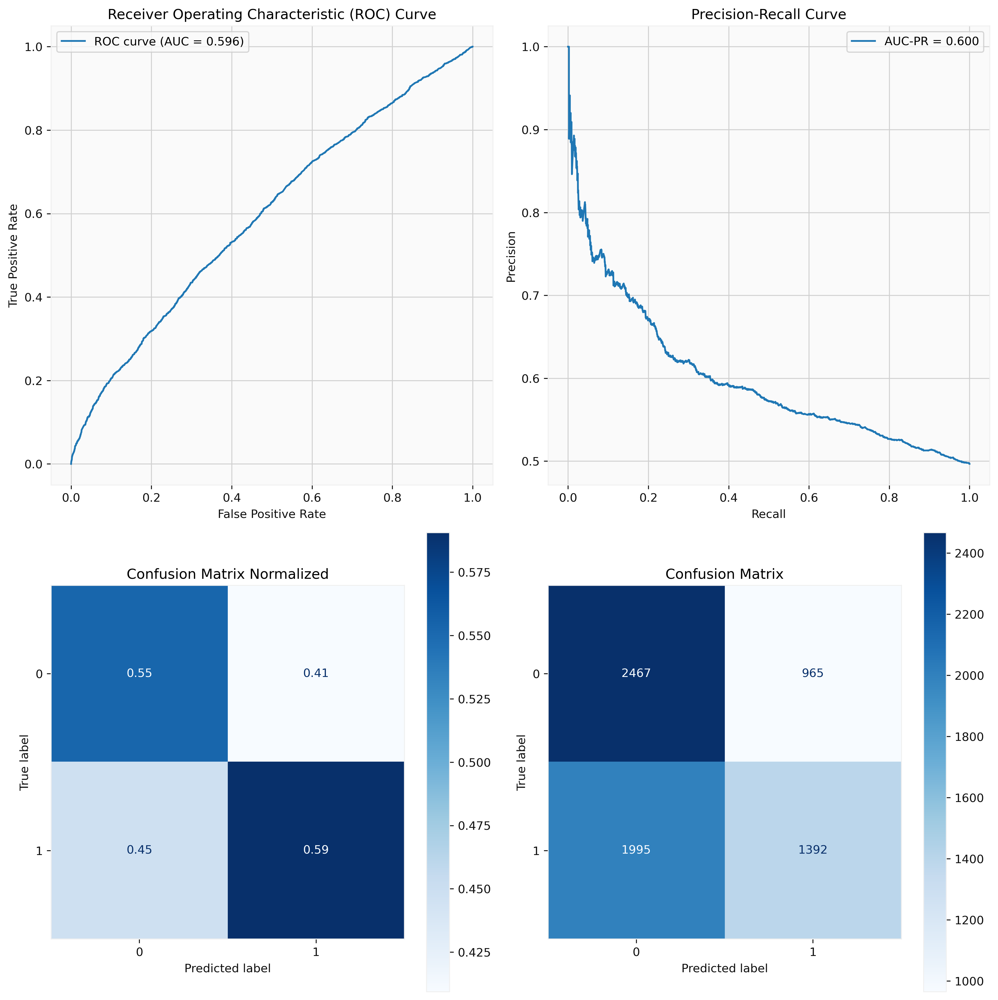

Opened Trades Without Results:  52


,ML Trades,ML Loss Trades,ML Profit Ratio,Non-ML Trades,Non-ML Profit Ratio,Profit Ratio Improvement
2022,539.00,387.00,28.20,28585.00,12.92,15.28


Accuracy score (train): 56.67%
Accuracy score (test): 87.74%
Precision score: 22.75%
Recall (True Positive Rate): 4.12%
Specificity (True Negative Rate): 98.24%
F1 score: 6.97%
Training data size: 38,639
Testing data size: 33,078
Test/Train ratio: 33,078/38,639 (46.12%/53.88%)
ROC AUC: 0.543
PR AUC: 0.141


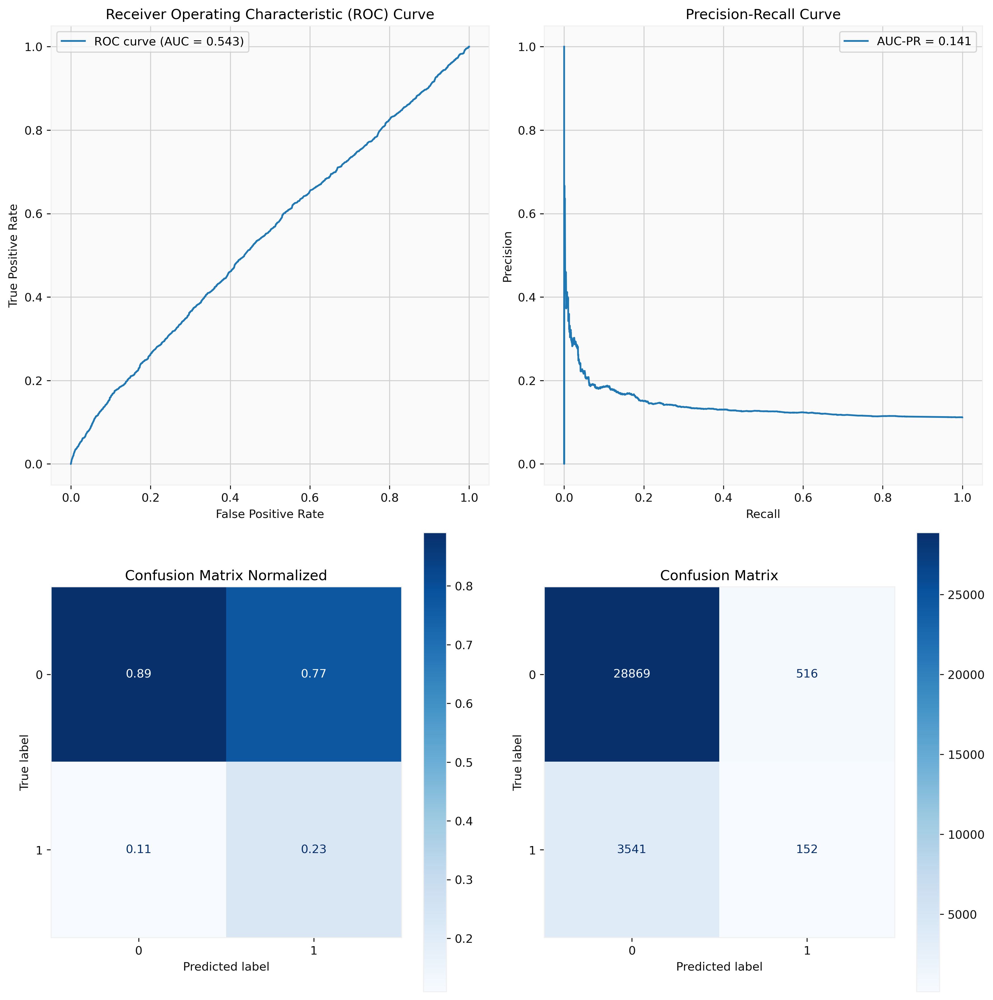

In [32]:
import pandas as pd

# Set the training and testing periods
train_period_start = pd.to_datetime("1990-01-01")
train_period_end = pd.to_datetime("2021-12-31")
test_period_start = pd.to_datetime("2022-01-01")
test_period_end = pd.to_datetime("2022-12-31")

# Define risk ratio and calculate target variables
risk_ratio = 3
tp, sl, tp_date, sl_date = target(risk_ratio)

# Set the random state and classifier parameters
random_state = 0
n_estimators = 100
max_depth = 4
criterion = "gini"
class_weight = None
min_samples_leaf = 2
min_samples_split = 2
verbose = 0

# Set the new threshold for predictions
new_threshold = 0.5

# Perform predictions using the classifier
predictions = clf_predictions(
    overall_df_big, train_period_start, train_period_end, test_period_start, 
    drop_list, tp, n_estimators, max_depth, random_state, criterion, 
    min_samples_leaf, verbose, class_weight, min_samples_split
)

# Extract prediction results
y_probs, y_preds, y_test, clf, X_train, y_train, X_test, y_test, y_probs_positive, y_probs_negative = predictions

# Set flag to show evaluation results
show_evaluation = True

# Show evaluation metrics for the training period
train_evaluation_metrics = model_evaluation(
    X_test, X_train, y_test, y_preds, y_probs_positive, X_train, y_train, new_threshold, show_evaluation
)

# Create the test dataframe for unseen data
df_test_unseen = make_test(overall_df_big, test_period_start, test_period_end)

X_test_unseen = df_test_unseen.drop(drop_list, axis=1)
y_test = df_test_unseen[tp]

# Make predictions on the unseen test set
y_preds = clf.predict(X_test_unseen)

# Set a new threshold for predictions
new_threshold = 0.65

# Calculate predicted probabilities of positive class
y_probs = clf.predict_proba(X_test_unseen)
y_probs_positive = y_probs[:, 1]
y_probs_negative = y_probs[:, 0]

# Add predictions to the unseen dataframe
df_test_unseen['Preds'] = (y_probs[:, 1] >= new_threshold).astype(int)

# Generate the annual report for the test data
annual_report = get_annual_report(df_test_unseen)
display(annual_report[:1])

# Show evaluation metrics for the unseen test data
unseen_evaluation_metrics = model_evaluation(
    df_test_unseen, X_train, y_test, y_preds, y_probs_positive, X_train, y_train, new_threshold, show_evaluation
)


In [56]:
# Set the start and end dates for annual test
period_start_date = '1965-01-01'
period_end_date = '2022-01-01'

# Convert the string dates to datetime objects
period_start_date = pd.to_datetime(period_start_date)
period_end_date = pd.to_datetime(period_end_date)

# Set the length of training and test windows in years
train_window_length_years = 20
test_window_length_years = 1

risk_ratio = 3  # Risk ratio value

# Function call to calculate target values and their respective dates
tp, sl, tp_date, sl_date = target(risk_ratio)

# Initialize an empty list for storing evaluation metrics and empty DataFrames for overall results and predictions
evaluation_metrics = []
evaluation_df = pd.DataFrame()
overall_results_df = pd.DataFrame()
df_preds_overall = pd.DataFrame()

# Set the length of the gap between training and test windows in years
gap_length_years = 1

# Loop over each year within the specified period
for train_year in range(period_start_date.year, period_end_date.year - train_window_length_years + 1):
    
    # Set the start and end dates of each training window
    train_period_start = pd.to_datetime(f'{train_year}-01-01')
    train_period_end = pd.to_datetime(f'{train_year + train_window_length_years - 1}-12-31')
    
    # Loop over each year within the test window for a given training window
    for test_year in range(train_period_end.year + gap_length_years, train_period_end.year + gap_length_years + test_window_length_years):
        
        clear_output(wait=True)  # Clear the output for each test year
        
        # Set the start and end dates of each test window
        test_period_start = pd.to_datetime(f'{test_year}-01-01')
        test_period_end = pd.to_datetime(f'{test_year + test_window_length_years - 1}-12-31')
        
        # If the start of the test period is later than the specified end date, exit the loop
        if test_period_start > period_end_date:
            break

        # Set hyperparameters for the classifier
        random_state = 0
        n_estimators = 500
        max_depth = 4
        criterion = "gini"
        class_weight = None
        min_samples_leaf = 2
        min_samples_split = 2
        verbose = 0
        
        # Set the threshold value for the classifier
        new_threshold = 0.65
        
        show_evaluation = False  # Flag to control whether to show evaluation metrics

        # Get the classifier's predictions on the training and test sets
        predictions = clf_predictions(
            overall_df_big, train_period_start, train_period_end, test_period_start, 
            drop_list, tp, n_estimators, max_depth, random_state, criterion, 
            min_samples_leaf, verbose, class_weight, min_samples_split
        )

        # Get the predicted probabilities and other outputs from the classifier
        y_probs, y_preds, y_test, clf, X_train, y_train, X_test, y_test, y_probs_positive, y_probs_negative = predictions
        
        # Calculate the training evaluation metrics
        train_evaluation_metrics = model_evaluation(X_test, X_train, y_test, y_preds, y_probs_positive, X_train, y_train, new_threshold, show_evaluation)

        # Create the unseen test dataframe
        df_test_unseen = make_test(overall_df_big, test_period_start, test_period_end)

        # Prepare the test set for the classifier
        X_test_unseen = df_test_unseen.drop(drop_list, axis=1)
        y_test = df_test_unseen[tp]

        # Make predictions on unseen test set using the trained classifier
        y_preds = clf.predict(X_test_unseen)

        # Calculate the predicted probabilities of positive class using the trained classifier
        y_probs = clf.predict_proba(X_test_unseen)
        y_probs_positive = y_probs[:, 1]
        y_probs_negative = y_probs[:, 0]
        
        # Update the evaluation metrics with the results from the unseen test set
        evaluation_df = update_evaluation_metrics(df_test_unseen, X_train, y_test, y_preds, y_probs_positive, y_train, new_threshold, test_year, evaluation_metrics)
        
        # Add the predicted class labels to the unseen test dataframe and add it to the overall predictions dataframe
        df_test_unseen['Preds'] = (y_probs[:, 1] >= new_threshold).astype(int)
        df_preds_overall = pd.concat([df_preds_overall, df_test_unseen])
            
        # Display the annual report of predictions
        annual_report = get_annual_report(df_preds_overall)
        display(annual_report)


Opened Trades Without Completion:  53


,ML Trades,ML Profit Ratio,Non-ML Trades,Non-ML Profit Ratio,Profit Ratio Improvement
1985,206.00,87.38,1416.00,66.17,21.21
1986,190.00,88.42,1915.00,51.91,36.52
1987,68.00,98.53,2300.00,30.00,68.53
1988,46.00,80.43,1794.00,62.71,17.73
1989,66.00,50.00,2083.00,50.65,-0.65
1990,141.00,48.23,1918.00,46.72,1.51
1991,87.00,85.06,2300.00,48.70,36.36
1992,47.00,68.09,2139.00,41.28,26.80
1993,61.00,70.49,2409.00,37.24,33.26
1994,65.00,49.23,2311.00,47.04,2.19


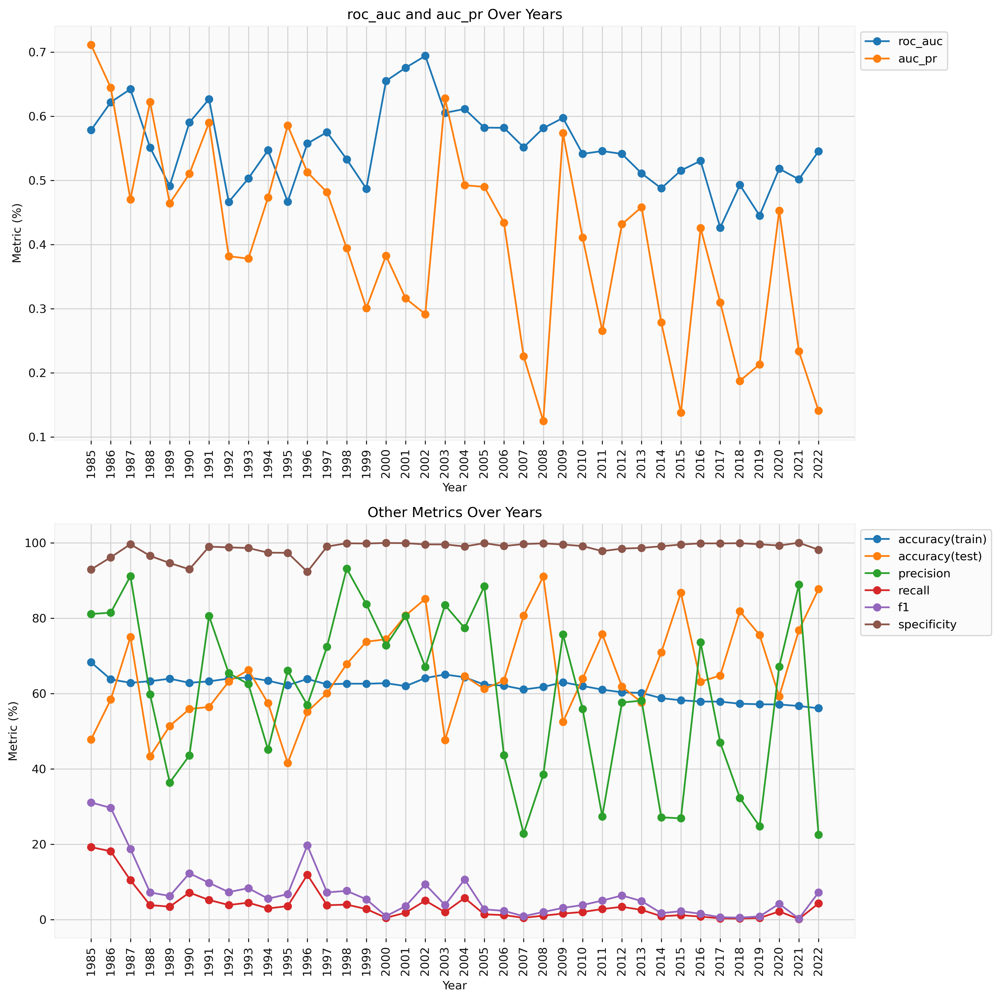

In [31]:
plot_evaluation_metrics(evaluation_df)


In [32]:
def compare_annual_ratios(df1, df2, risk_ratios, start_year):
    # Calculate breakeven thresholds for each risk ratio
    breakeven_thresholds = [1 / (ratio + 1) * 100 for ratio in risk_ratios]

    # Extract the year from the 'Model_Date' column
    df1 = df1.copy()
    df1['Year'] = df1.index.year
    df2 = df2.copy()
    df2['Year'] = df2.index.year

    # Filter the data for years and asset type
    filtered_df1 = df1[
        (df1['Year'] >= start_year) &
        (df1['Year'] <= end_year) &
        (df1['Exchange'].isin(exchange)) & 
        (df1['Type'] == 'stock')
    ]
    
    
    df2 = df2.loc[
        (df2['Preds'] == 1) & 
        (df2['Entry_Point_Triggered'] == 1) &
        ((df2['Takeprofit_3/1_Triggered'] == 1) | 
         (df2['Stoploss_3/1_Triggered'] == 1))
    ]
    
    filtered_df2 = df2[
        (df2['Year'] >= start_year) & 
        (df2['Year'] <= end_year) &
        (df2['Exchange'].isin(exchange)) & 
        (df2['Type'] == 'stock')
    ]

    # Create a figure and axes
    fig, axs = plt.subplots(len(risk_ratios), 2, figsize=(16, 16), dpi=300, sharex=False)

    for i, ratio in enumerate(risk_ratios):
        # Calculate the annual ratio for the current risk ratio
        annual_ratio1 = (filtered_df1.groupby('Year')['Takeprofit_{}/1_Triggered'.format(ratio)].sum() / filtered_df1.groupby('Year')['Entry_Point_Triggered'].sum()) * 100
        annual_ratio2 = (filtered_df2.groupby('Year')['Takeprofit_{}/1_Triggered'.format(ratio)].sum() / filtered_df2.groupby('Year')['Entry_Point_Triggered'].sum()) * 100
        annual_trades = filtered_df2.groupby('Year')['Entry_Point_Triggered'].sum()

        # Plot the ratio
        plot_takeprofit_ratio(axs[i, 0], annual_ratio1, ratio, breakeven_thresholds[i])
        plot_takeprofit_ratio(axs[i, 1], annual_ratio2, ratio, breakeven_thresholds[i])

    plt.tight_layout()
    plt.show()
    
    return annual_trades

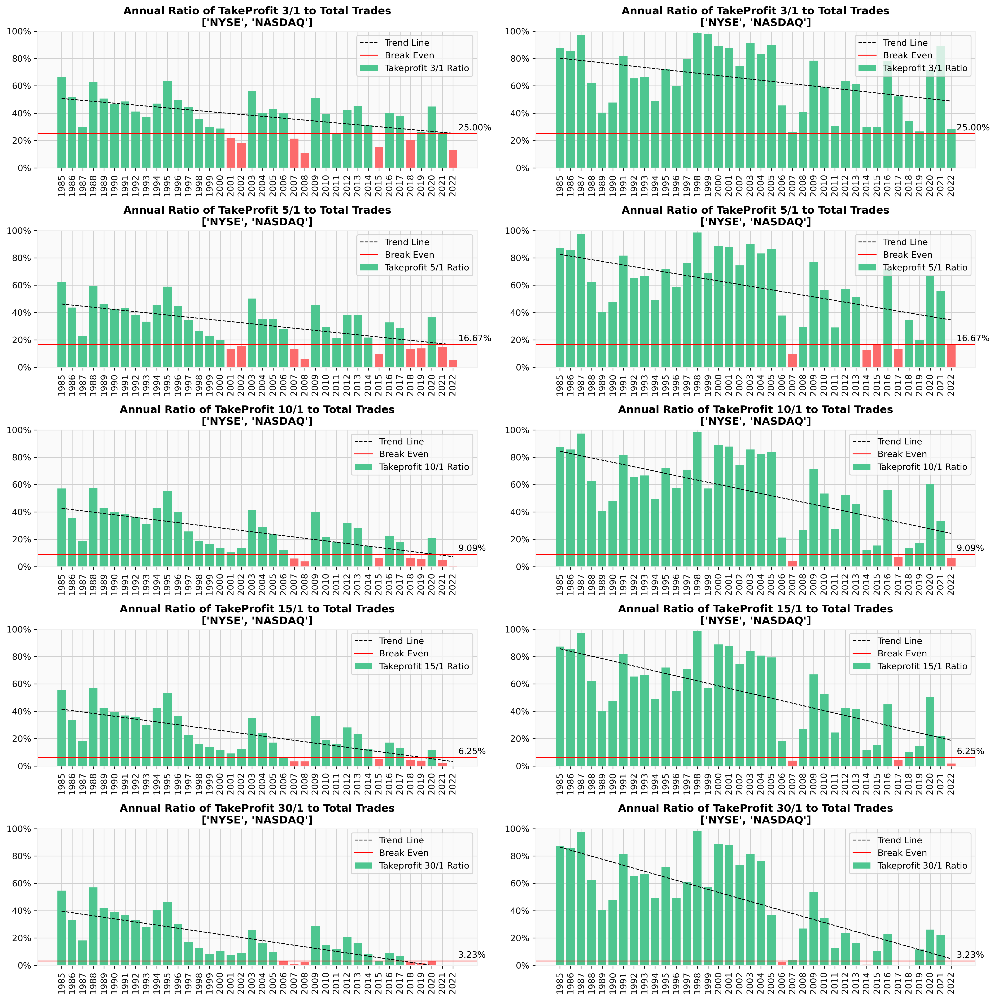

In [39]:
risk_ratios = [3, 5, 10, 15, 30]

exchange = ['NYSE', 'NASDAQ']

start_year = 1985
end_year = 2022

annual_trades = compare_annual_ratios(overall_df_big, df_preds_overall, risk_ratios, start_year)

In [40]:
def aggregate_trading_results(df, risk_ratios, risk_value, starting_deposit_value, start_year):
    results_dict = {}
    
    df_copy = df.copy()
    df_copy = df_copy.loc[df_copy['Preds'] == 1]

    for ratio in risk_ratios:
        # Modify column names based on the current risk ratio
        takeprofit_col = 'Takeprofit_{}/1_Date'.format(ratio)
        stoploss_col = 'Stoploss_{}/1_Date'.format(ratio)
        profit_trigger_col = 'Takeprofit_{}/1_Triggered'.format(ratio)
        loss_trigger_col = 'Stoploss_{}/1_Triggered'.format(ratio)

        # Aggregation code for the current risk ratio
        
        df_copy = df_copy.loc[df_copy.index.year >= start_year]

        # Replace non-date values with NaN
        df_copy.loc[df_copy[takeprofit_col] == 0, takeprofit_col] = np.nan
        df_copy.loc[df_copy[stoploss_col] == 0, stoploss_col] = np.nan

        # Convert date columns to datetime format
        df_copy[takeprofit_col] = pd.to_datetime(df_copy[takeprofit_col], errors='coerce')
        df_copy[stoploss_col] = pd.to_datetime(df_copy[stoploss_col], errors='coerce')

        # Filter trades where Takeprofit_X/1_Triggered == 1
        profit_trades = df_copy[df_copy[profit_trigger_col] == 1]

        # Group by 'Takeprofit_X/1_Date' and count the trades
        profit_trades_count = profit_trades.groupby(takeprofit_col).size()

        # Convert to DataFrame
        profit_trades_count = profit_trades_count.reset_index(name='Profit_Trades')

        # Filter trades where Stoploss_X/1_Triggered == 1
        loss_trades = df_copy[df_copy[loss_trigger_col] == 1]

        # Group by 'Stoploss_X/1_Date' and count the trades
        loss_trades_count = loss_trades.groupby(stoploss_col).size()

        # Convert to DataFrame
        loss_trades_count = loss_trades_count.reset_index(name='Loss_Trades')

        # Merge the two dataframes on date
        result = pd.merge(profit_trades_count, loss_trades_count,
                          left_on=takeprofit_col,
                          right_on=stoploss_col,
                          how='outer')

        # Fill NAs with 0
        result[['Profit_Trades', 'Loss_Trades']] = result[['Profit_Trades', 'Loss_Trades']].fillna(0)

        # Create a unified Date column
        result['Date'] = result[takeprofit_col].combine_first(result[stoploss_col])

        # Drop the original date columns
        result = result.drop([takeprofit_col, stoploss_col], axis=1)

        # Calculate profit and loss based on the specified risk value and risk ratio
        profit = risk_value * ratio
        loss = risk_value

        # Add net profit column
        result['Net_Profit'] = result['Profit_Trades'] * profit - result['Loss_Trades'] * loss

        result = result.sort_values(by='Date')

        result = result.set_index('Date')

        # Calculate the cumulative profit starting from the specified starting value
        result['Cumulative_Profit'] = result['Net_Profit'].cumsum() + starting_deposit_value

        # Get the first date where 'Cumsum_Profit_{}/1' is less than or equal to zero
        first_negative = result[result['Cumulative_Profit'.format(ratio)] <= 0].index.min()
        
        # Drop all rows after the first date of non-positive 'Cumsum_Profit_{}/1'
        if pd.notna(first_negative):  # Check if we have any non-positive cumsum
            result = result[result.index <= first_negative]
            
        # Rename columns and check if the dataframe is empty before storing in the dictionary
        if not result.empty:
            result = result.rename(columns={'Profit_Trades': 'Profit_Trades_{}/1'.format(ratio),
                                        'Loss_Trades': 'Loss_Trades_{}/1'.format(ratio),
                                        'Net_Profit': 'Net_Profit_{}/1'.format(ratio),
                                        'Cumulative_Profit': 'Cumulative_Profit_{}/1'.format(ratio)})  
            
            results_dict[ratio] = result

    return results_dict


,Profit_Trades_3/1,Loss_Trades_3/1,Net_Profit_3/1,Cumulative_Profit_3/1
Date,,,,
2008-06-24,0.00,1.00,-100.00,9900.00
2008-07-11,0.00,3.00,-300.00,9600.00
2008-08-01,3.00,0.00,900.00,10500.00
2008-08-05,1.00,0.00,300.00,10800.00
2008-09-23,1.00,0.00,300.00,11100.00


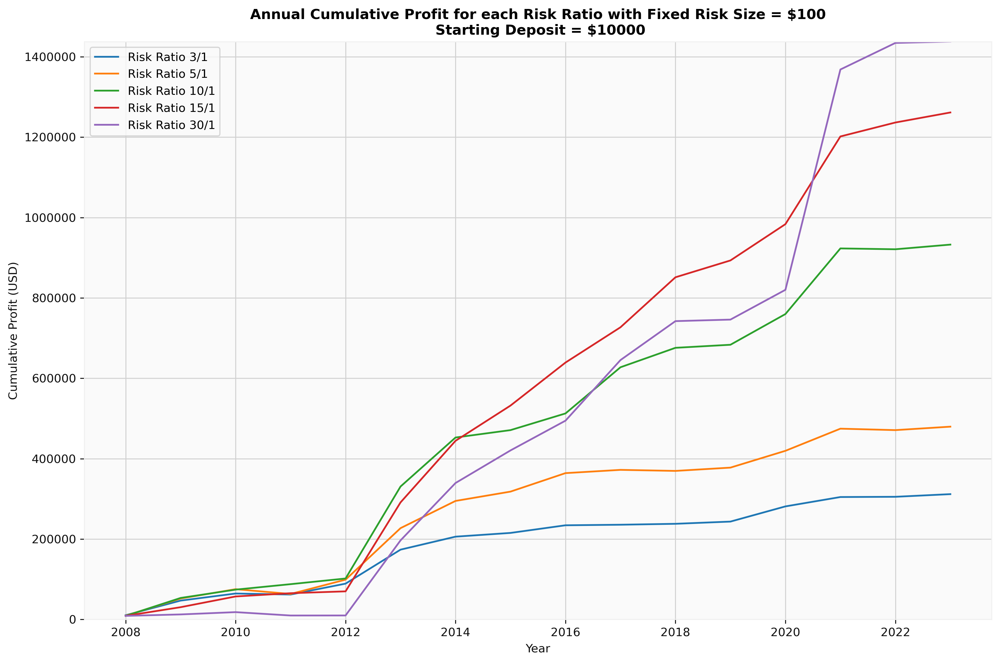

In [41]:
def plot_cumulative_profit_by_year(results_dict):
    plt.figure(figsize=(12, 8), dpi=300)

    # Collect all yearly_cumulative_profit values for the ylim calculation
    all_profits = []

    for ratio, df in results_dict.items():
        # Group the data by year and calculate the cumulative profit for each year
        yearly_cumulative_profit = df.groupby(df.index.year)['Cumulative_Profit_{}/1'.format(ratio)].last()
        
        # Append to the all_profits list
        all_profits.extend(yearly_cumulative_profit)

        # Plot the cumulative profit for each year
        plt.plot(yearly_cumulative_profit.index, yearly_cumulative_profit, label='Risk Ratio {}/1'.format(ratio))

    plt.xlabel('Year')
    plt.ylabel('Cumulative Profit (USD)')
    plt.legend()
    plt.title(f'Annual Cumulative Profit for each Risk Ratio with Fixed Risk Size = ${risk_value}\n Starting Deposit = ${starting_deposit_value}', fontweight='bold')

    # Set y-axis tick labels as actual numbers
    plt.ticklabel_format(axis='y', style='plain', useOffset=False)

    # Set ylim to start at zero and end at maximum profit value
    plt.ylim(0, max(all_profits))

    plt.tight_layout()
    plt.show()



risk_ratios = [3, 5, 10, 15, 30]

risk_value = 100

starting_deposit_value = 10000

start_year = 2008

trading_results = aggregate_trading_results(df_preds_overall, risk_ratios, risk_value, starting_deposit_value, start_year)

display(trading_results[3].head())
# Plot cumulative profit by year for each risk ratio
plot_cumulative_profit_by_year(trading_results)

In [50]:
def create_risk_management_dict(df_preds_overall, risk_value, risk_ratios, start_year, end_year, starting_deposit_value):

    result_dict = {}
    for ratio in risk_ratios:
        
        takeprofit_date_col = 'Takeprofit_{}/1_Date'.format(ratio)
        stoploss_date_col = 'Stoploss_{}/1_Date'.format(ratio)
        profit_trigger_col = 'Takeprofit_{}/1_Triggered'.format(ratio)
        loss_trigger_col = 'Stoploss_{}/1_Triggered'.format(ratio)
        profit_duration_col = 'Takeprofit_{}/1_Duration'.format(ratio)
        loss_duration_col = 'Stoploss_{}/1_Duration'.format(ratio)
        profit_price_col = 'Takeprofit_{}/1_Price'.format(ratio)
        
        df_preds_overall_class1 = df_preds_overall.loc[
        (df_preds_overall.index.year >= trading_start_year) &
        (df_preds_overall.index.year <= trading_end_year) &
        (df_preds_overall['Preds'] == 1) & 
        (df_preds_overall['Entry_Point_Triggered'] == 1)
    ]
        
        columns_to_keep = [
            'Symbol', 'Exchange', 'volume', 'close', 'open', 'high', 'low',
            'adjclose', 'Level_Price', 'Level_Date', 'Level_Age', 'ATR5', 'Spread','Preds',
            'Entry_Price', 'Stoploss_Price', 'Entry_Point_Triggered', 'Entry_Point_Date', 
            'Entry_Point_Duration', profit_price_col, loss_trigger_col, takeprofit_date_col,
            loss_duration_col, profit_trigger_col, stoploss_date_col, profit_duration_col,
        ]
        
        df_filtered = df_preds_overall_class1[columns_to_keep].copy()
        
        # Replace non-date values with NaN
        df_filtered[takeprofit_date_col] = pd.to_datetime(df_filtered[takeprofit_date_col], errors='coerce')
        df_filtered[stoploss_date_col] = pd.to_datetime(df_filtered[stoploss_date_col], errors='coerce')
        df_filtered.insert(0, 'Model_Date', 0)
        df_filtered.insert(3, 'Relative_Risk', 0)
        df_filtered.insert(4, 'Lot_Size', 0)
        df_filtered.insert(5, 'Absolute_Risk', 0)
        df_filtered.insert(6, 'Profit', 0)
        df_filtered.insert(7, 'Loss', 0)
        df_filtered.insert(8, 'Cumulative_Net_Profit', 0)
        df_filtered.insert(9, 'Risk_Value', 0)
        df_filtered.insert(10, 'Deposit', 0)
        
        df_filtered.loc[:, 'Relative_Risk'] = df_filtered['Entry_Price'] - df_filtered['Stoploss_Price']
        df_filtered.loc[:, 'Lot_Size'] = risk_value / df_filtered['Relative_Risk']
        df_filtered.loc[:, 'Absolute_Risk'] = df_filtered['Lot_Size'] * df_filtered['Relative_Risk']

        # Create a new column that is the minimum of takeprofit_date_col and stoploss_date_col
        df_filtered['min_date'] = df_filtered[[takeprofit_date_col, stoploss_date_col]].min(axis=1)

        # Sort by this new column and drop the column
        df_filtered = df_filtered.sort_values(by='min_date')
        
        df_filtered.loc[:, 'Model_Date'] = df_filtered.index
        
        df_filtered.index = df_filtered['min_date']
        
        df_filtered.index.name = 'Completion_Date'
        
        df_filtered.drop('min_date', axis=1, inplace=True)
        
#         df_filtered = df_filtered.loc[(df_filtered.index.year <= end_year)]
        
        # Calculate profit and loss based on the specified risk value and risk ratio
        profit = risk_value * ratio
        loss = risk_value
        
        df_filtered.loc[:, 'Risk_Value'] = risk_value
        df_filtered.loc[df_filtered[profit_trigger_col] == 1, 'Profit'] = profit
        df_filtered.loc[df_filtered[loss_trigger_col] == 1, 'Loss'] = loss
        df_filtered.loc[:, 'Cumulative_Net_Profit'] = (df_filtered['Profit'] - df_filtered['Loss']).cumsum()
        df_filtered.loc[:, 'Deposit'] = df_filtered['Cumulative_Net_Profit'] + starting_deposit_value
        
        # Get the first date where 'Cumsum_Profit_{}/1' is less than or equal to zero
        first_negative_deposit = df_filtered[df_filtered['Deposit'] <= 0].index.min()
        
        # Drop all rows after the first date of non-positive 'Deposit'
        if pd.notna(first_negative_deposit):  # Check if we have any non-positive cumsum
            df_filtered = df_filtered[df_filtered.index <= first_negative_deposit]
        
        result_dict[ratio] = df_filtered

    return result_dict

def plot_annual_deposit(risk_management_dict):
    plt.figure(figsize=(12, 8), dpi=300)

    # Collect all yearly_cumulative_profit values for the ylim calculation
    all_profits = []

    for ratio, df in risk_management_dict.items():
        # Group the data by year and calculate the cumulative profit for each year
        yearly_deposit = df.groupby(df.index.year)['Deposit'.format(ratio)].last()
        
        # Append to the all_profits list
        all_profits.extend(yearly_deposit)

        # Plot the cumulative profit for each year
        plt.plot(yearly_deposit.index, yearly_deposit, label='Risk Ratio {}/1'.format(ratio))

    plt.xlabel('Year')
    plt.ylabel('Deposit ($)')
    plt.legend()
    plt.title(f'Annual Deposit Size for Corresponding Risk Ratio'
              f' with Fixed Risk Value = ${risk_value}\n Initial Deposit = ${starting_deposit_value}.'
              f' Trading Period {trading_start_year} - {trading_end_year}', fontweight='bold')

    # Set y-axis tick labels as actual numbers
    plt.ticklabel_format(axis='y', style='plain', useOffset=False)

    # Set ylim to start at zero and end at maximum profit value
    plt.ylim(0, max(all_profits))

    plt.tight_layout()
    plt.show()

def plot_trades_completion(risk_management_dict, trading_start_year, trading_end_year):
    years = range(trading_start_year, trading_end_year + 1)
    ratios = list(risk_management_dict.keys())
    num_ratios = len(ratios)

    width = 0.15  # Width of each bar
    offset = width * (num_ratios - 1) / 2

    has_completed_trades = False
    has_uncompleted_trades = False

    for i, (ratio, df) in enumerate(risk_management_dict.items()):
        completed_trades = df[~df.index.isnull()]
        if not completed_trades.empty:
            has_completed_trades = True

        uncompleted_trades = df[df.index.isnull()]
        if not uncompleted_trades.empty:
            has_uncompleted_trades = True

    if not has_completed_trades and not has_uncompleted_trades:
        print("No trades to display.")
        return

    if has_completed_trades and has_uncompleted_trades:
        fig, axs = plt.subplots(2, 1, figsize=(12, 16), dpi=300)
    else:
        fig, axs = plt.subplots(1, 1, figsize=(12, 8), dpi=300)
        axs = [axs]  # To handle the indexing in the for loop below

    for i, (ratio, df) in enumerate(risk_management_dict.items()):
        # Plot completed trades
        completed_trades = df[~df.index.isnull()]
        yearly_counts = completed_trades.groupby(completed_trades.index.year).size()
        if not yearly_counts.empty:
            x = np.array(list(yearly_counts.index))
            y = np.array(list(yearly_counts.values))
            x_shifted = x + (i * width) - offset
            axs[0].bar(x_shifted, y, width=width, label=f"Risk Ratio: {ratio}")

        # Plot uncompleted trades
        uncompleted_trades = df[df.index.isnull()]
        yearly_counts = uncompleted_trades.groupby(uncompleted_trades['Model_Date'].dt.year).size()
        if not yearly_counts.empty:
            x = np.array(list(yearly_counts.index))
            y = np.array(list(yearly_counts.values))
            x_shifted = x + (i * width) - offset
            if has_completed_trades:
                axs[1].bar(x_shifted, y, width=width, label=f"Risk Ratio: {ratio}")
            else:
                axs[0].bar(x_shifted, y, width=width, label=f"Risk Ratio: {ratio}")

    # Set common properties
    for ax, title in zip(axs, ["Completed Trades by Year", "Uncompleted Trades by Year"]):
        ax.set_title(title, fontweight='bold')
        ax.set_xlabel("Year")
        ax.set_ylabel("Count")
        ax.set_xticks(years)
        ax.set_xticklabels(years, rotation=90)
        ax.grid(True, linestyle='--', linewidth=0.5, zorder=0)
        ax.legend(loc="upper left")

    plt.tight_layout()
    plt.show()


In [43]:
def plot_distributions(risk_management_dict, risk_ratios):
    
    plt.figure(figsize=(12, 8), dpi=300)
    
    # Concatenate all the relevant columns from all dataframes
    relative_risk = pd.concat([df['Relative_Risk'] for df in risk_management_dict.values()])
    absolute_risk = pd.concat([df['Absolute_Risk'] for df in risk_management_dict.values()])
    lot_size = pd.concat([df['Lot_Size'] for df in risk_management_dict.values()])
    level_price = pd.concat([df['Level_Price'] for df in risk_management_dict.values()])
    level_age = pd.concat([df['Level_Age'] for df in risk_management_dict.values()])
    atr5 = pd.concat([df['ATR5'] for df in risk_management_dict.values()])

    # Plot histograms of the concatenated series
    plt.subplot(2, 3, 1)
    plt.hist(relative_risk, bins=30, zorder=1, color='#4ec690', edgecolor='black', alpha=1)
    plt.xlabel('Relative Risk')
    plt.ylabel('Frequency')
    plt.title('Distribution of Relative Risk', fontweight='bold')
    plt.grid(True, linestyle='--', linewidth=0.5, zorder=0)

    plt.subplot(2, 3, 2)
    plt.hist(absolute_risk, bins=30, zorder=1, color='#4ec690', edgecolor='black', alpha=1)
    plt.xlabel('Absolute Risk')
    plt.ylabel('Frequency')
    plt.title('Distribution of Absolute Risk', fontweight='bold')
    plt.grid(True, linestyle='--', linewidth=0.5, zorder=0)

    plt.subplot(2, 3, 3)
    plt.hist(lot_size, bins=30, zorder=1, color='#4ec690', edgecolor='black', alpha=1)
    plt.xlabel('Lot Size')
    plt.ylabel('Frequency')
    plt.title('Distribution of Lot Size', fontweight='bold')
    plt.grid(True, linestyle='--', linewidth=0.5, zorder=0)

    plt.subplot(2, 3, 4)
    plt.hist(level_price, bins=30, zorder=1, color='#4ec690', edgecolor='black', alpha=1)
    plt.xlabel('Level Price')
    plt.ylabel('Frequency')
    plt.title('Distribution of Level Price', fontweight='bold')
    plt.grid(True, linestyle='--', linewidth=0.5, zorder=0)

    plt.subplot(2, 3, 5)
    filtered_level_age = level_age[level_age <= 10000]
    plt.hist(filtered_level_age, bins=30, zorder=1, color='#4ec690', edgecolor='black', alpha=1)
    plt.xlabel('Level Age')
    plt.ylabel('Frequency')
    plt.title('Distribution of Level Age', fontweight='bold')
    plt.grid(True, linestyle='--', linewidth=0.5, zorder=0)

    plt.subplot(2, 3, 6)
    plt.hist(atr5, bins=30, zorder=1, color='#4ec690', edgecolor='black', alpha=1)
    plt.xlabel('ATR5')
    plt.ylabel('Frequency')
    plt.title('Distribution of ATR5', fontweight='bold')
    plt.grid(True, linestyle='--', linewidth=0.5, zorder=0)
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust the rectangle to make room for the title
    plt.show()

    plt.figure(figsize=(12, len(risk_ratios) * 4), dpi=300)

    for i, ratio in enumerate(risk_ratios, 1):
        # Plot Takeprofit_{ratio}/1_Duration
        plt.subplot(len(risk_ratios), 2, 2*i - 1)
        filtered_data = risk_management_dict[ratio][risk_management_dict[ratio][f'Takeprofit_{ratio}/1_Triggered'] == 1]
        plt.hist(filtered_data[f'Takeprofit_{ratio}/1_Duration'], bins=60, zorder=1, edgecolor='black')
        plt.xlabel(f'Takeprofit_{ratio}/1_Duration')
        plt.ylabel('Frequency')
        plt.title(f'Distribution of Takeprofit {ratio}/1 Duration', fontweight='bold')
        plt.grid(True, linestyle='--', linewidth=0.5, zorder=0)

        # Plot Stoploss_{ratio}/1_Duration
        plt.subplot(len(risk_ratios), 2, 2*i)
        filtered_data = risk_management_dict[ratio][risk_management_dict[ratio][f'Stoploss_{ratio}/1_Triggered'] == 1]
        plt.hist(filtered_data[f'Stoploss_{ratio}/1_Duration'], bins=60, zorder=1, edgecolor='black')
        plt.xlabel(f'Stoploss_{ratio}/1_Duration')
        plt.ylabel('Frequency')
        plt.title(f'Distribution of Stoploss {ratio}/1 Duration', fontweight='bold')
        plt.grid(True, linestyle='--', linewidth=0.5, zorder=0)

    plt.tight_layout()
    plt.show()
    

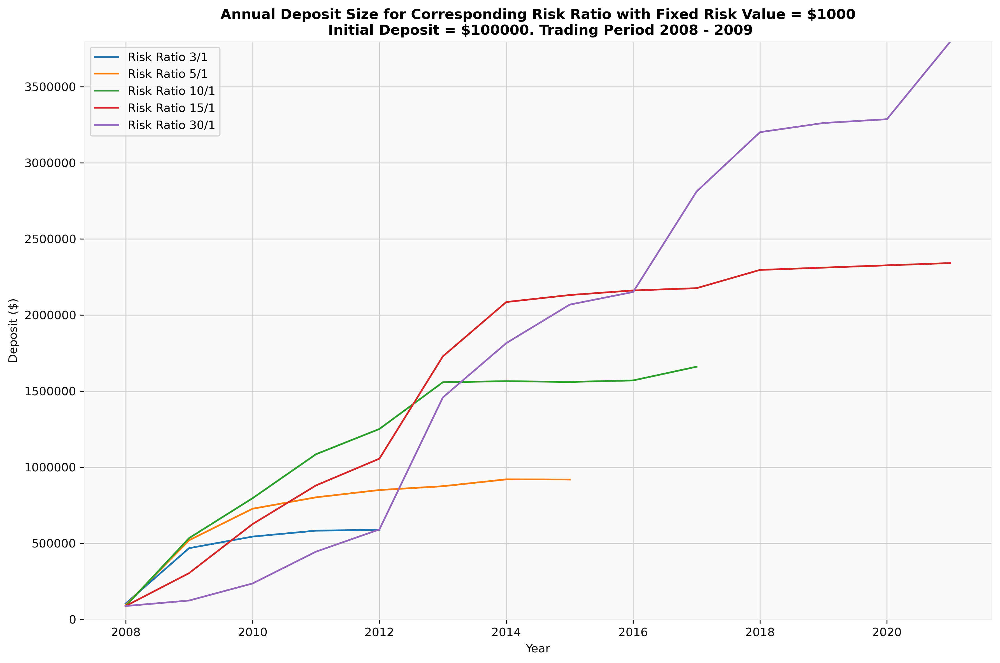

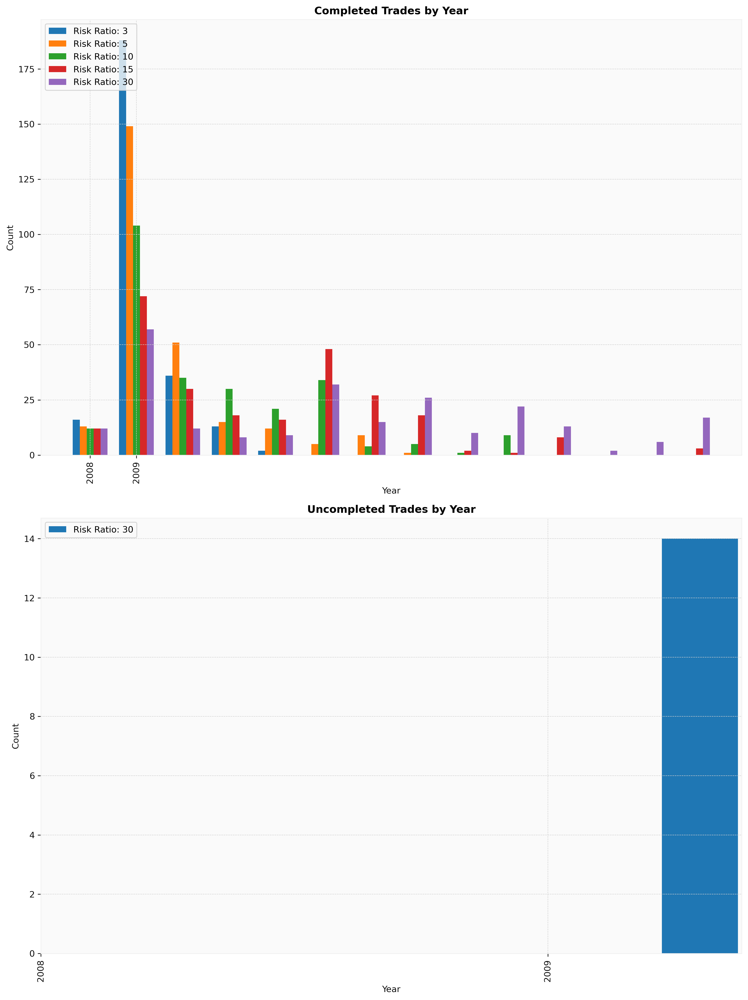

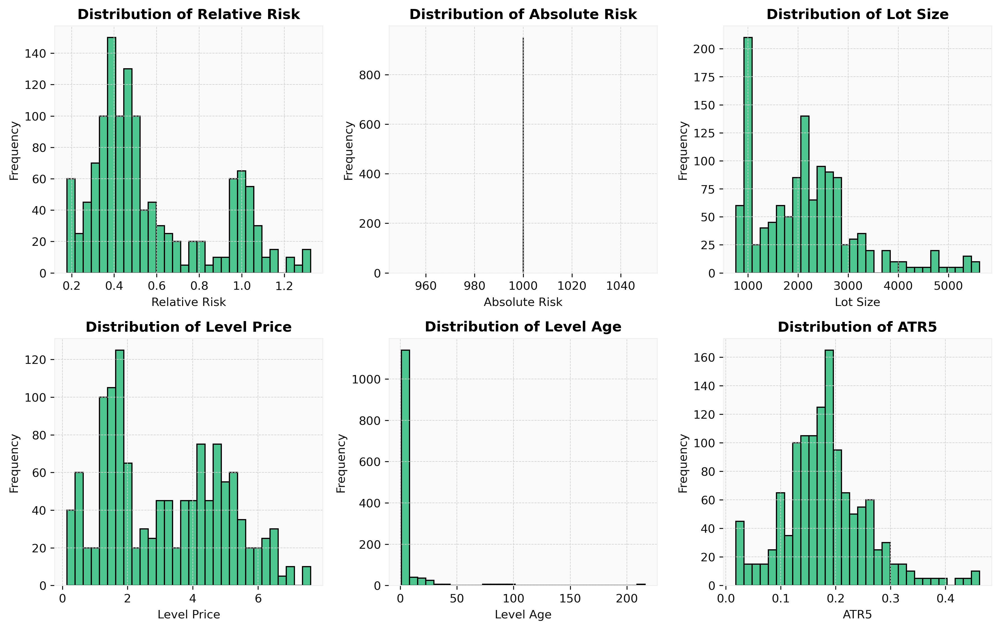

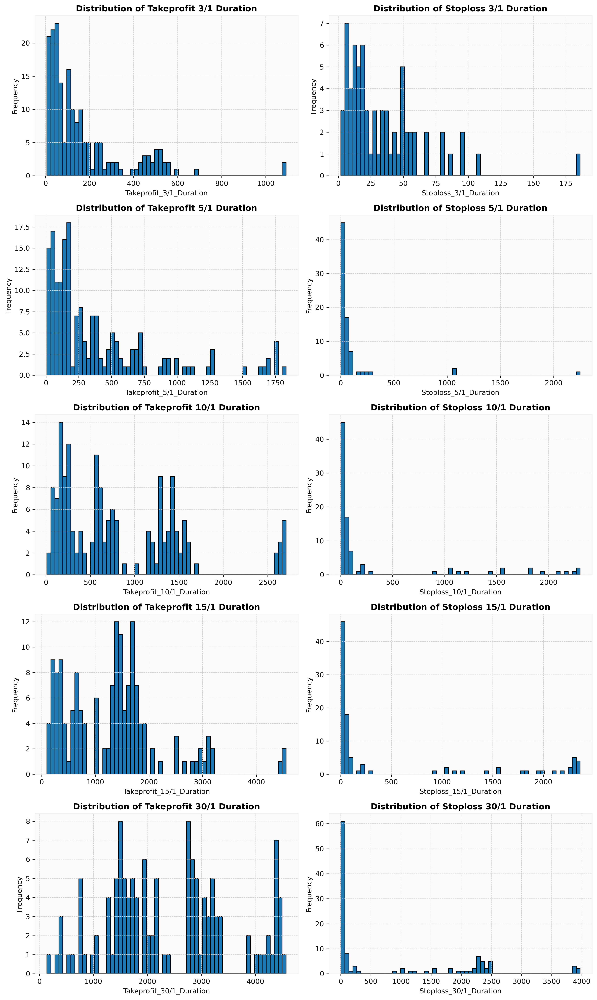

In [51]:
trading_start_year = 2008
trading_end_year = 2009

risk_ratios = [3, 5, 10, 15, 30]

starting_deposit_value = 100000

risk_value = 1000

risk_management_dict = create_risk_management_dict(df_preds_overall, risk_value, risk_ratios, start_year, end_year, starting_deposit_value)

# display(risk_management_dict[3].tail())

plot_annual_deposit(risk_management_dict)

plot_trades_completion(risk_management_dict, trading_start_year, trading_end_year)

plot_distributions(risk_management_dict, risk_ratios)